# Data acquisition

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

### Caricamento file train.csv

In [3]:
file_path= "../../train.csv"
df = pd.read_csv(file_path)

In [4]:
# Visualizzazione le prime righe del dataframe
df.head() 

,Year,S0,S1,S2,S3,S4,S5,S6,S7,S8,...,S80,S81,S82,S83,S84,S85,S86,S87,S88,S89
0,2007,44.76752,114.82099,3.83239,27.99928,1.49153,-15.90853,28.24844,3.61650,-7.24653,...,-1.89619,-471.02844,411.56205,443.01198,19.30254,309.07806,-336.91706,-14.70547,-474.44157,31.32820
1,2004,52.28942,75.73319,11.35941,-6.20582,-27.64559,-30.75995,12.50955,7.47877,9.88498,...,4.57060,1.36110,-6.52977,59.48672,3.69790,-36.92252,44.08077,3.39993,-70.07591,3.86143
2,2005,33.81773,-139.07371,134.19332,17.85216,63.47408,-25.28005,-34.65911,-5.99135,1.27848,...,54.16608,15.04530,39.09107,39.03041,3.68708,-61.88547,45.68115,6.39822,3.24471,35.74749
3,1998,41.60866,3.17811,-3.97174,23.53564,-19.68553,20.74407,18.80866,6.24474,-7.98424,...,28.08591,295.88684,54.02395,102.02880,40.47711,15.10258,-250.32293,2.81288,56.05172,3.60432
4,1987,44.49525,-32.25270,58.08217,3.73684,-32.53274,-18.72885,-15.85665,-3.34607,22.63786,...,31.44988,-136.50457,-85.11989,-74.96342,9.56921,-100.61689,-133.29315,9.19246,-97.37953,30.11015


In [ ]:
# Dimensione del dataframe
print("Dimensione del dataframe")
print("- Righe: " + str(len(df.index)))
print("- Colonne: " + str(len(df.columns)))

Dimensione del dataframe 

- Righe: 252175
- Colonne: 91


# Data Visualization

### Distribuzione delle canzoni per anno di pubblicazione 


Distribuzione delle canzoni per anno di pubblicazione:
Year
1956      283
1957      299
1958      291
1959      296
1960      212
1961      285
1962      302
1963      451
1964      473
1965      560
1966      689
1967      859
1968      934
1969     1105
1970     1174
1971     1065
1972     1144
1973     1298
1974     1092
1975     1241
1976     1089
1977     1251
1978     1463
1979     1554
1980     1551
1981     1581
1982     1798
1983     1693
1984     1684
1985     1789
1986     2110
1987     2561
1988     2805
1989     3335
1990     3628
1991     4323
1992     4771
1993     5263
1994     6061
1995     6629
1996     7065
1997     7591
1998     7907
1999     9119
2000     9642
2001    10795
2002    11726
2003    13691
2004    14803
2005    17476
2006    18767
2007    19702
2008    17380
2009    15519
Name: count, dtype: int64


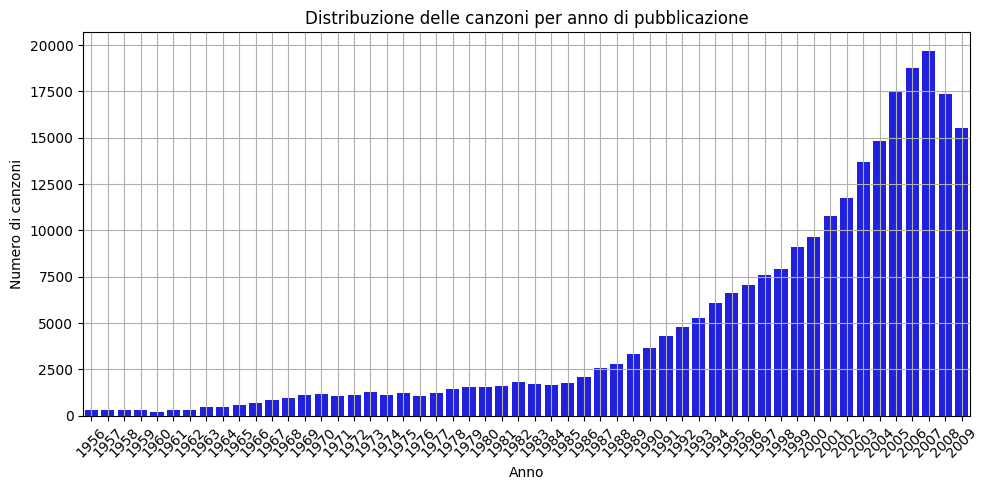

In [6]:
# Calcola la frequenza di canzoni per anno
year_distribution = df['Year'].value_counts().sort_index()

print("\nDistribuzione delle canzoni per anno di pubblicazione:")
print(year_distribution)

plt.figure(figsize=(10, 5)) 
sns.barplot(x=year_distribution.index, y=year_distribution.values, color='blue') 
plt.title('Distribuzione delle canzoni per anno di pubblicazione')
plt.xlabel('Anno')
plt.ylabel('Numero di canzoni')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()  
plt.show()

### Divisione in decenni e numero di features

In [7]:
# Definisci i decenni come intervalli
decade_bins = list(range(1950, 2021, 10))
decade_labels = [f'{dec}-{dec+9}' for dec in decade_bins[:-1]]

# Aggiungi una colonna 'DecadeGroup' al DataFrame
df['DecadeGroup'] = pd.cut(df['Year'], bins=decade_bins, labels=decade_labels, include_lowest=True)

# Calcola il numero di canzoni per ogni 'DecadeGroup' usando 'value_counts'
decade_counts = df['DecadeGroup'].value_counts().sort_index()

# Crea un DataFrame ordinato con i risultati
decade_distribution_df = pd.DataFrame({
    'Decade': decade_counts.index,
    'Number of Songs': decade_counts.values
})

print("Distribuzione delle canzoni per decennio:")
print(decade_distribution_df)

Distribuzione delle canzoni per decennio:
      Decade  Number of Songs
0  1950-1959             1381
1  1960-1969             6832
2  1970-1979            12748
3  1980-1989            22984
4  1990-1999            68371
5  2000-2009           139859
6  2010-2019                0


### Density plot delle features per decenni

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


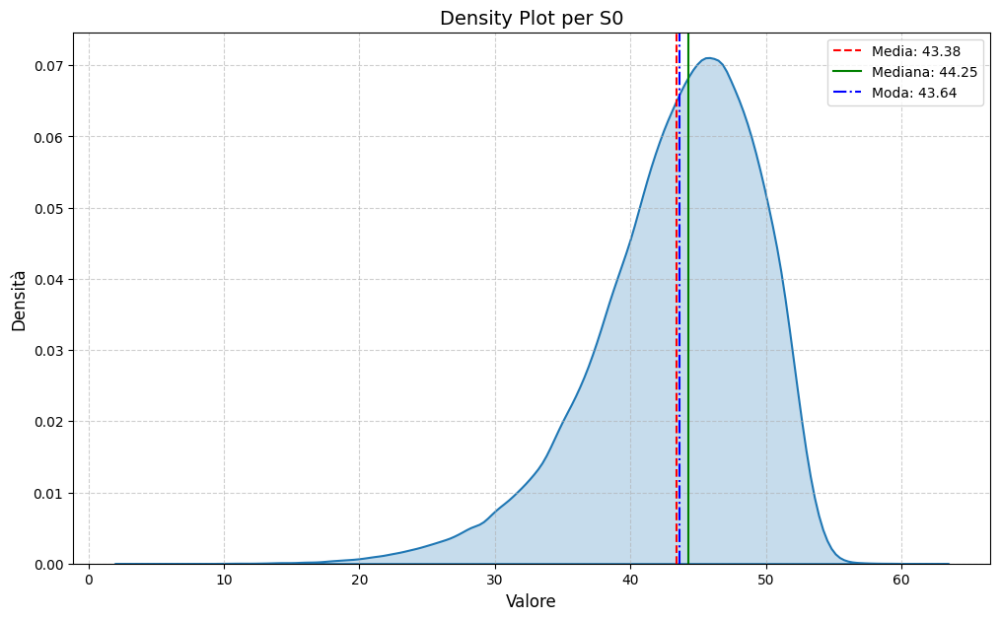

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


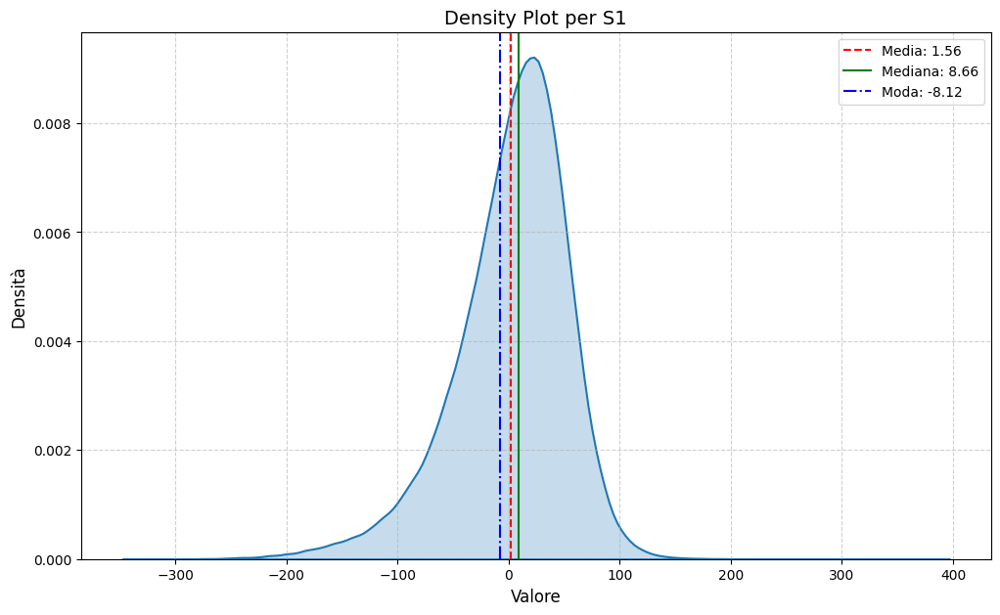

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


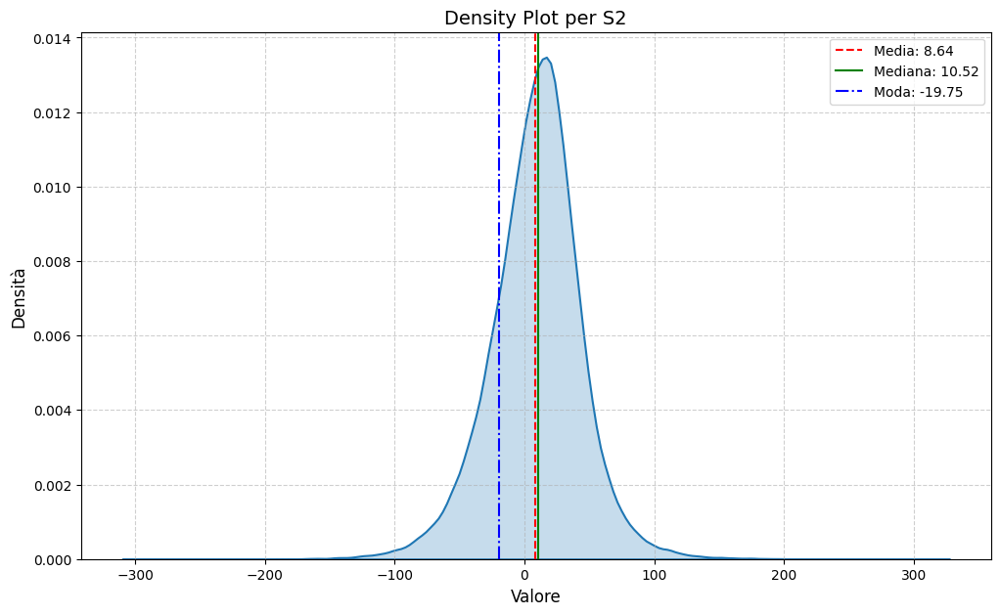

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


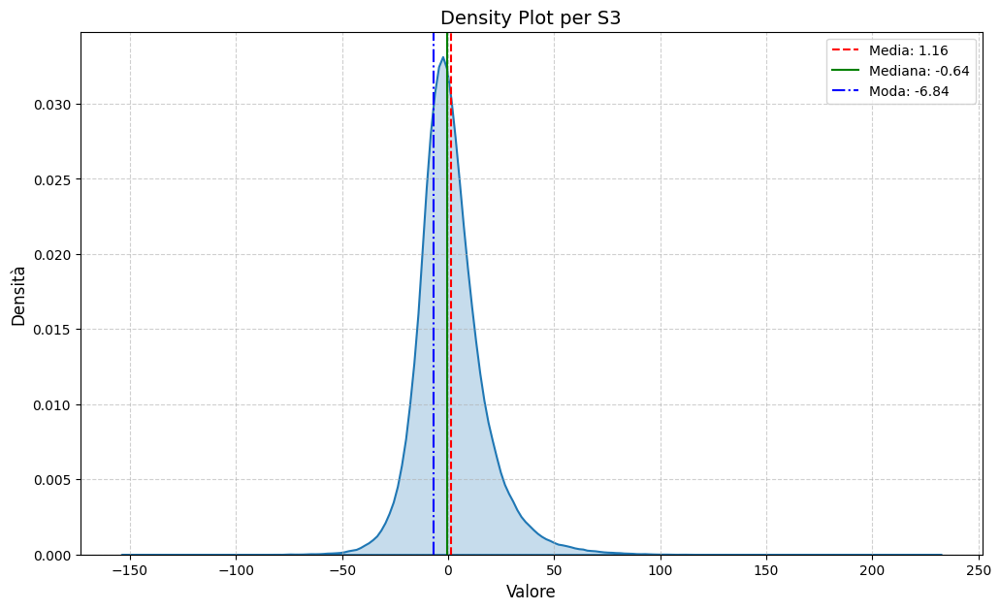

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


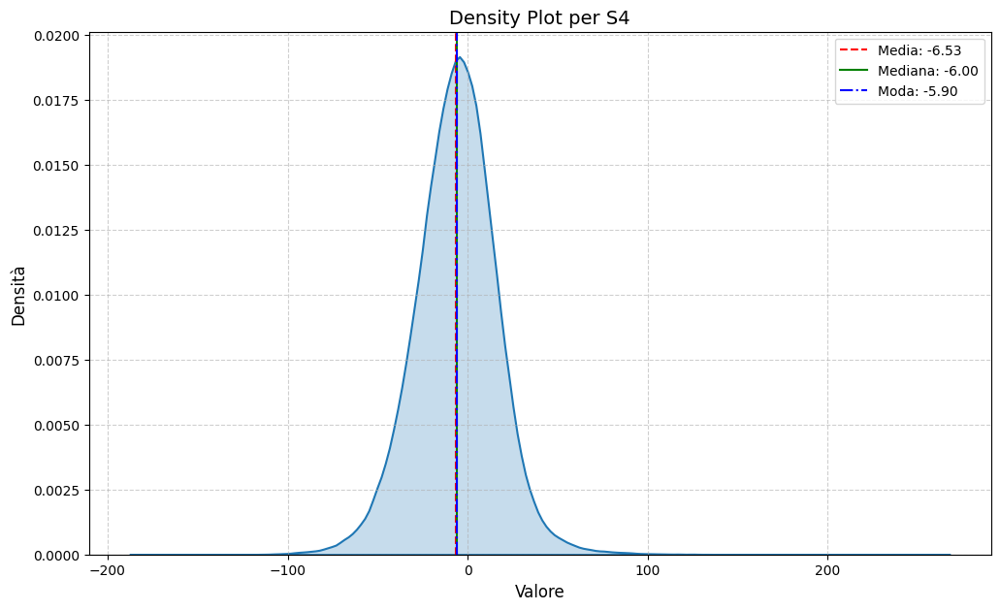

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


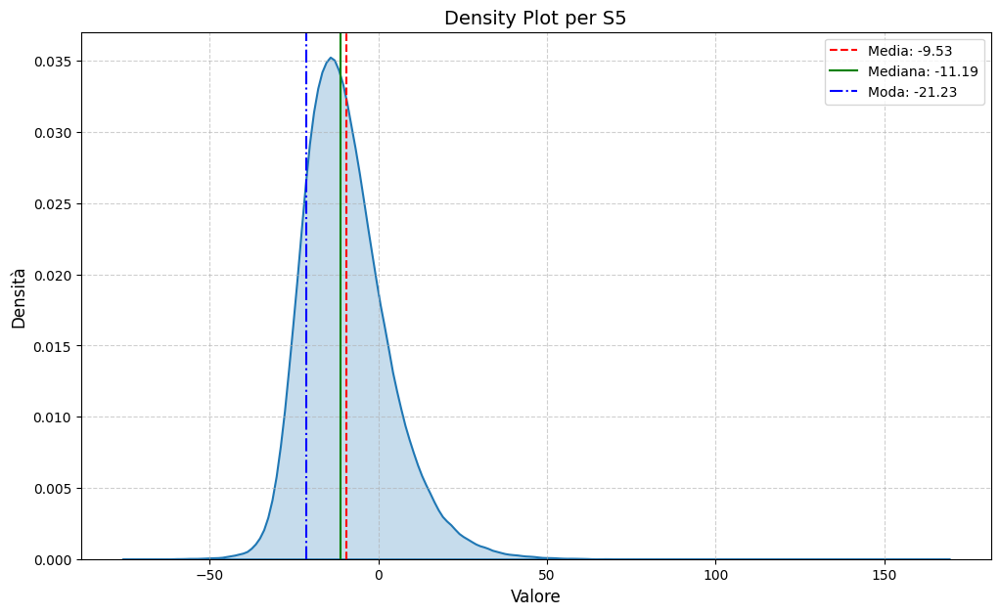

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


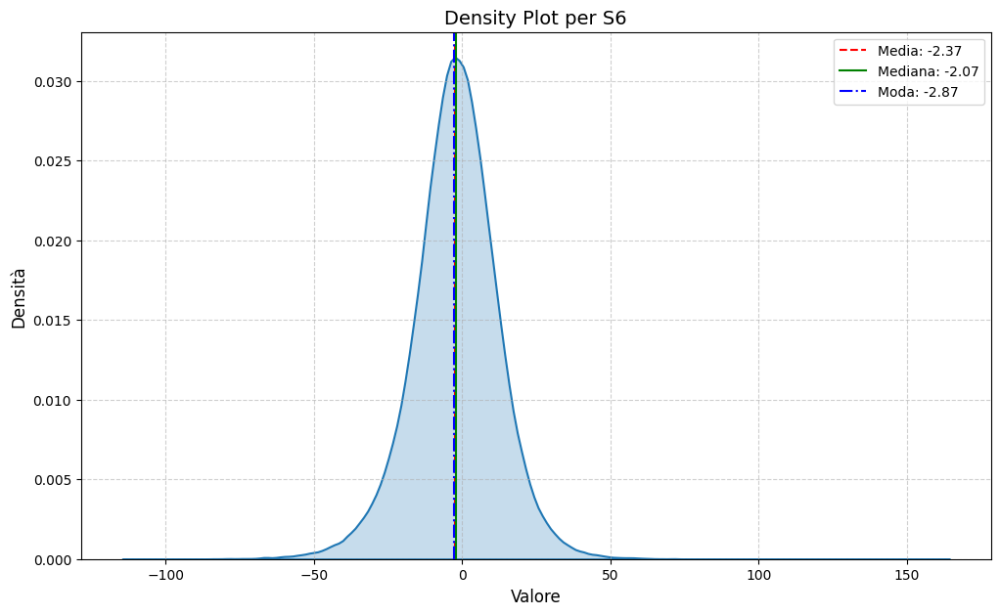

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


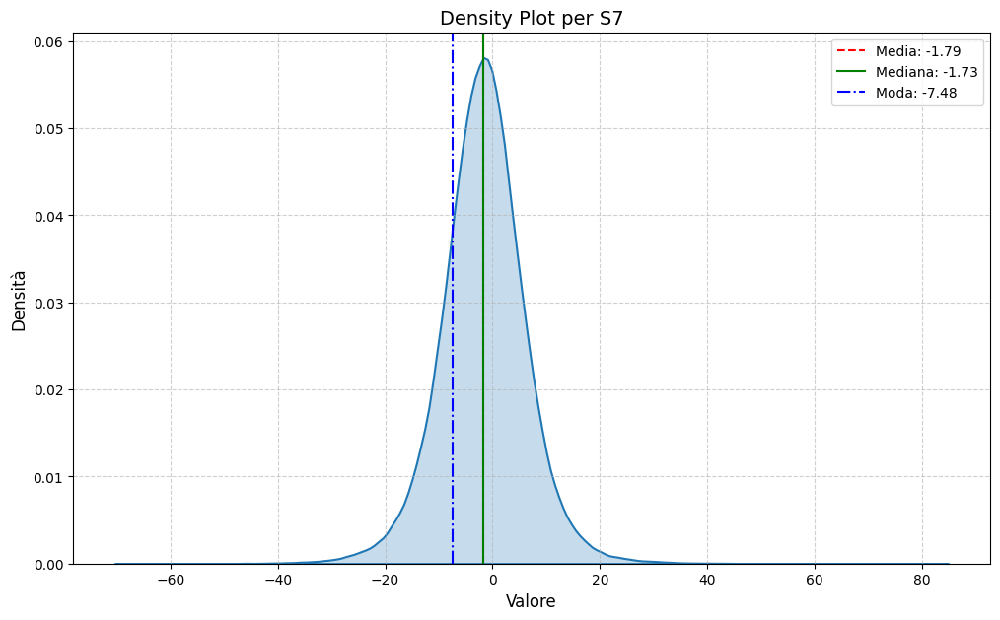

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


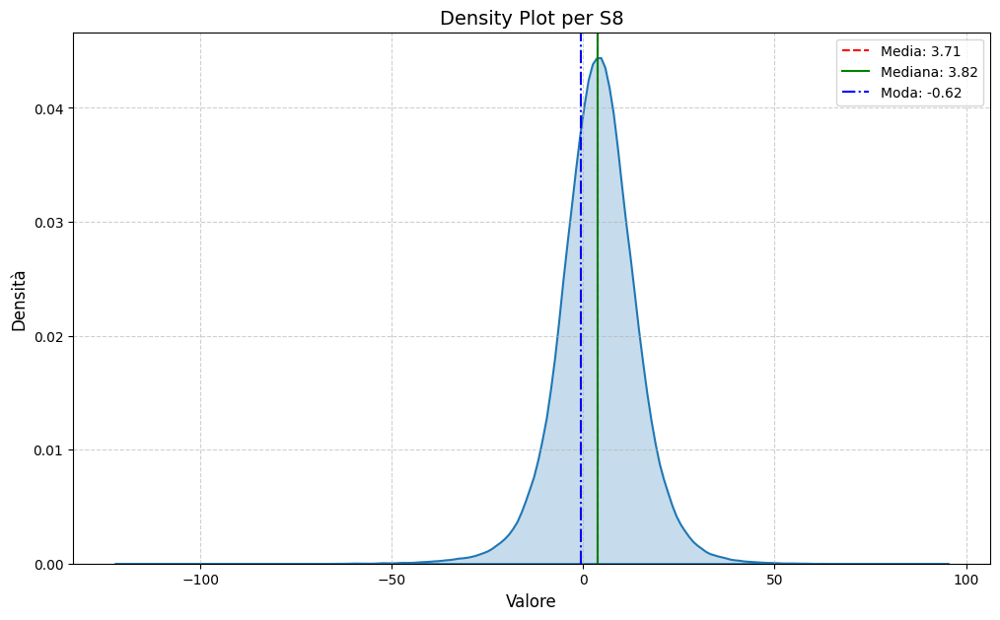

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


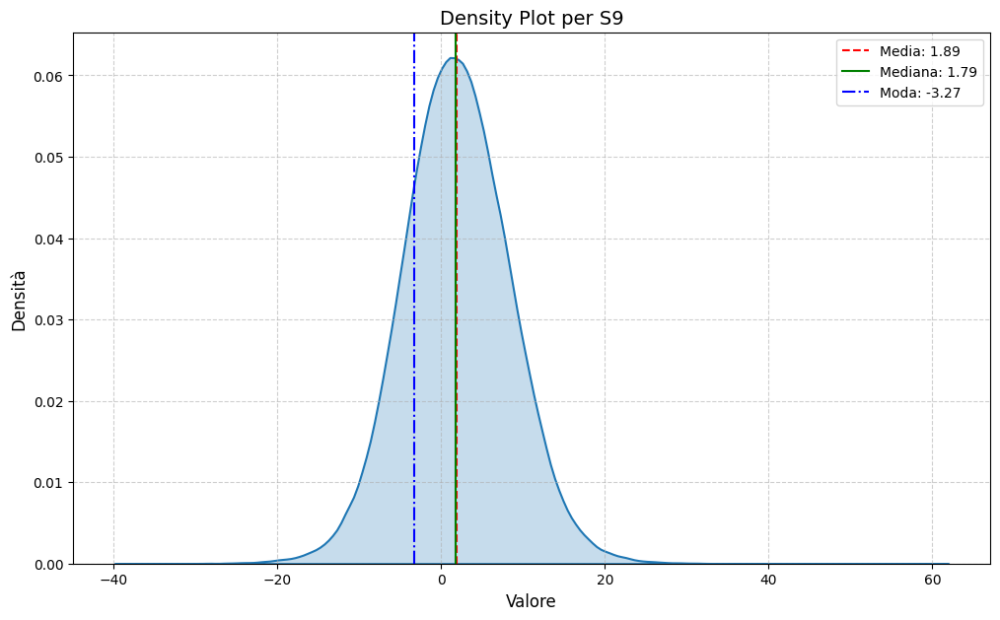

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


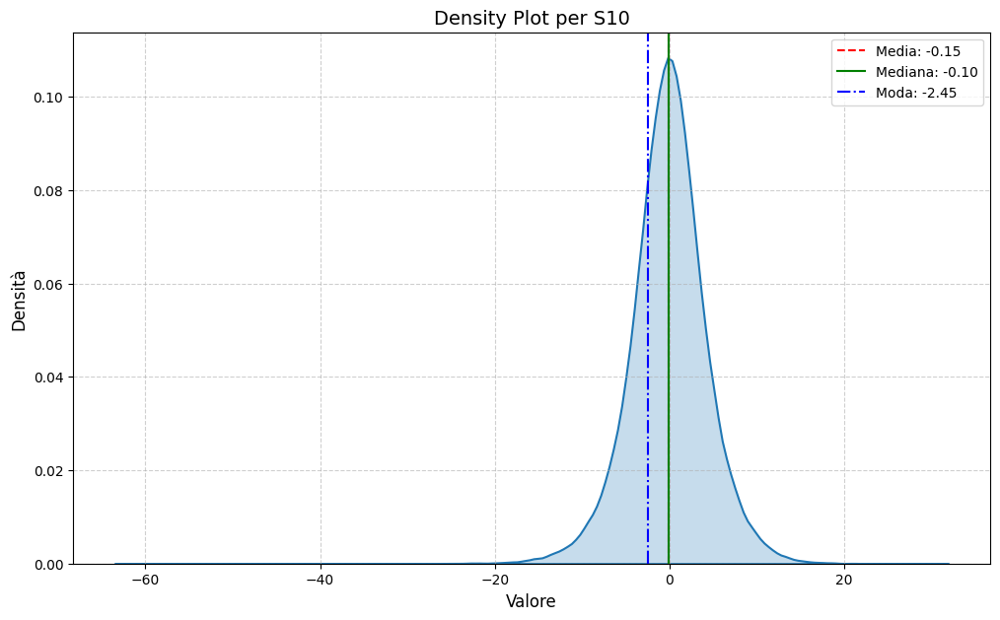

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


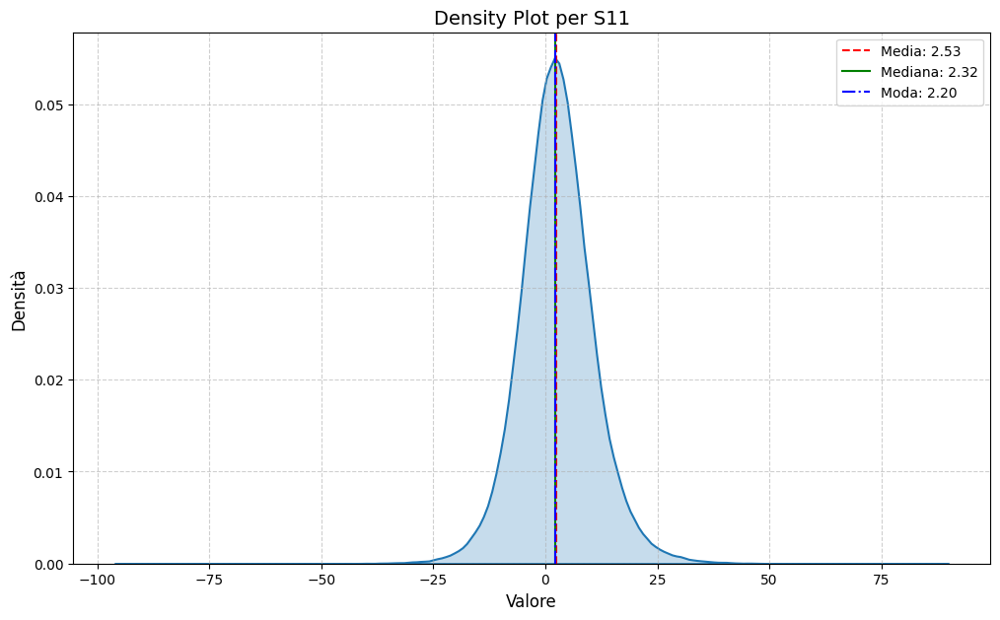

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


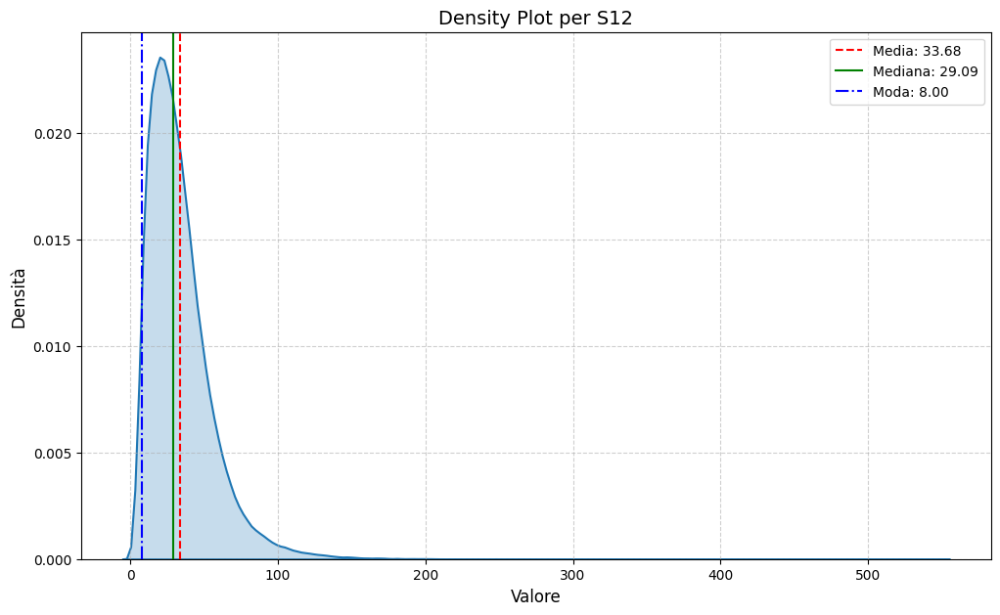

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


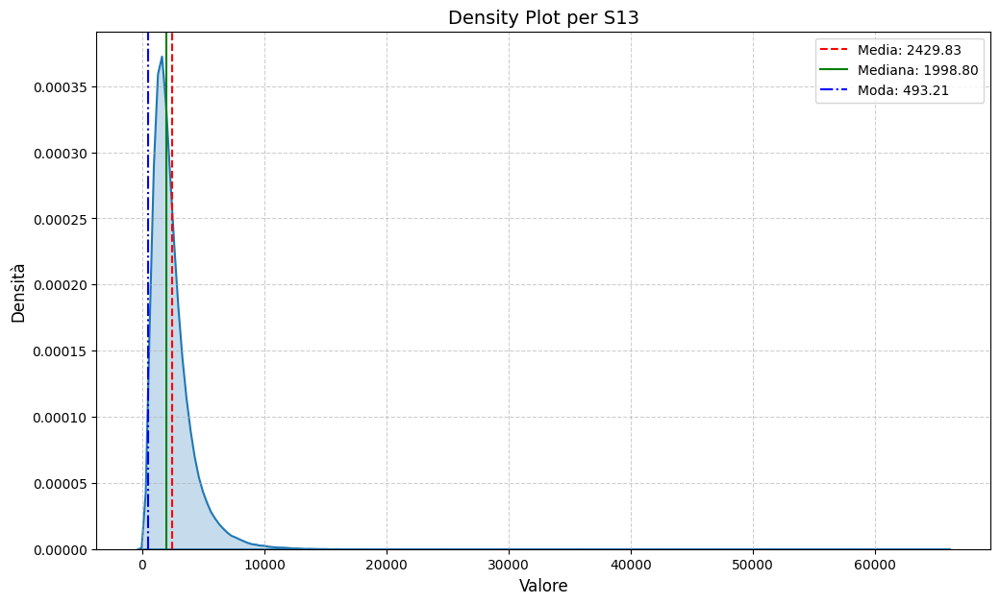

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


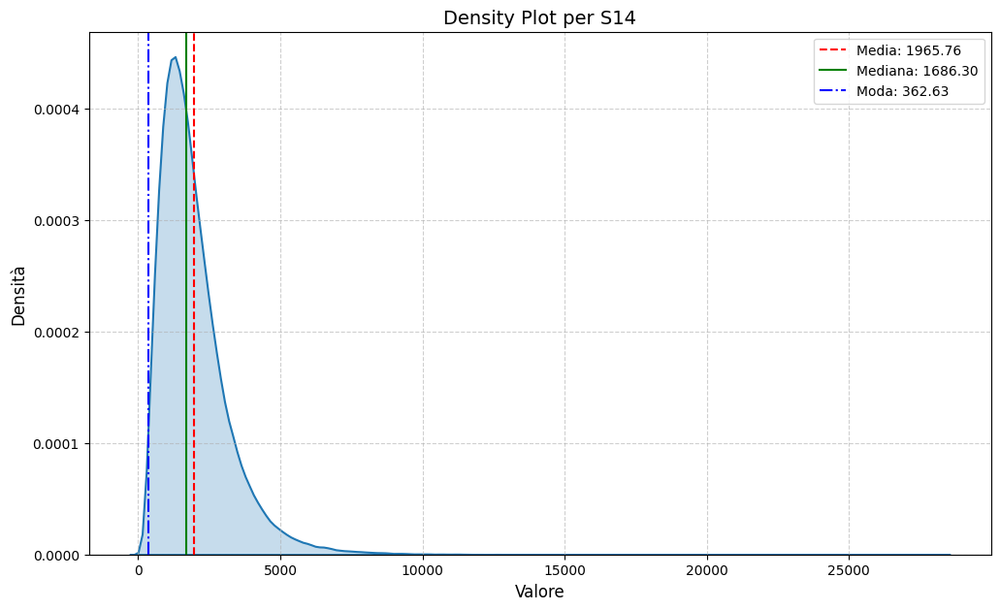

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


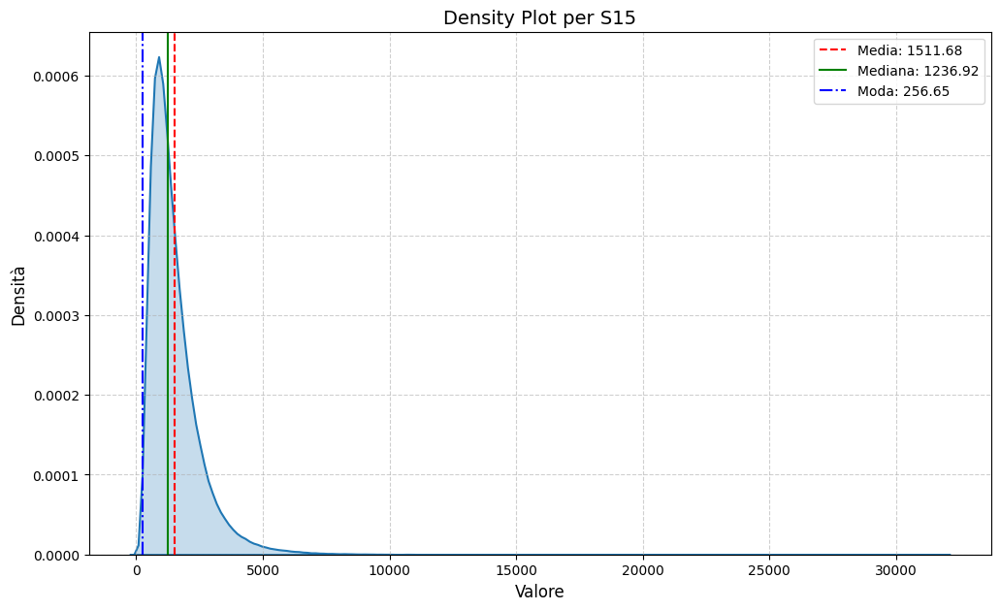

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


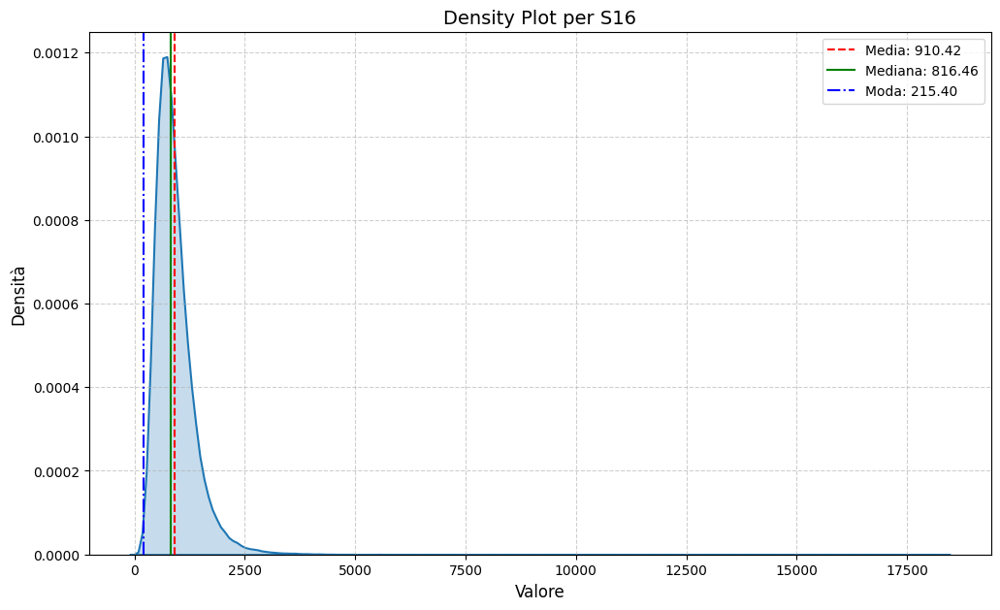

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


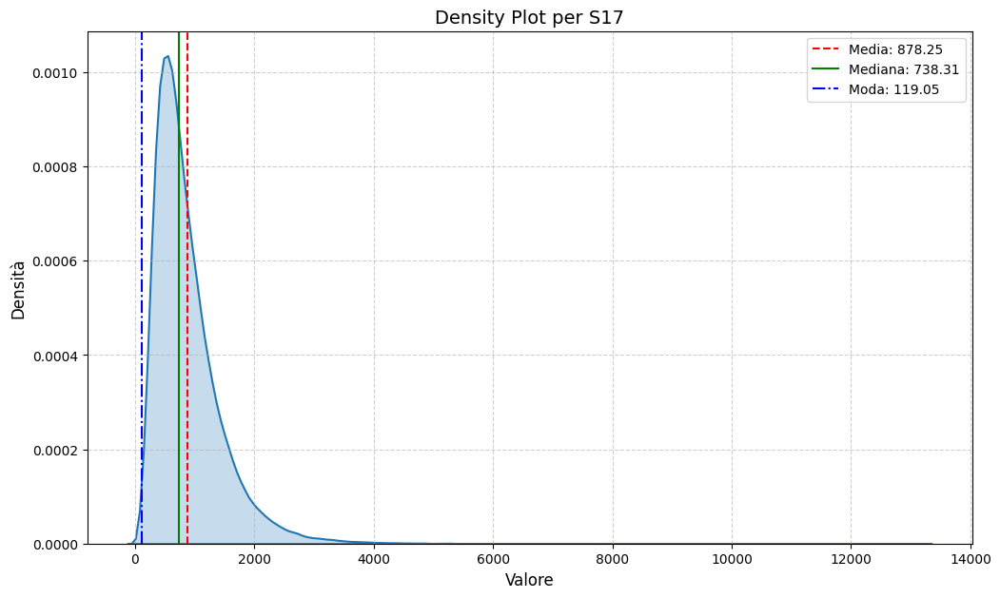

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


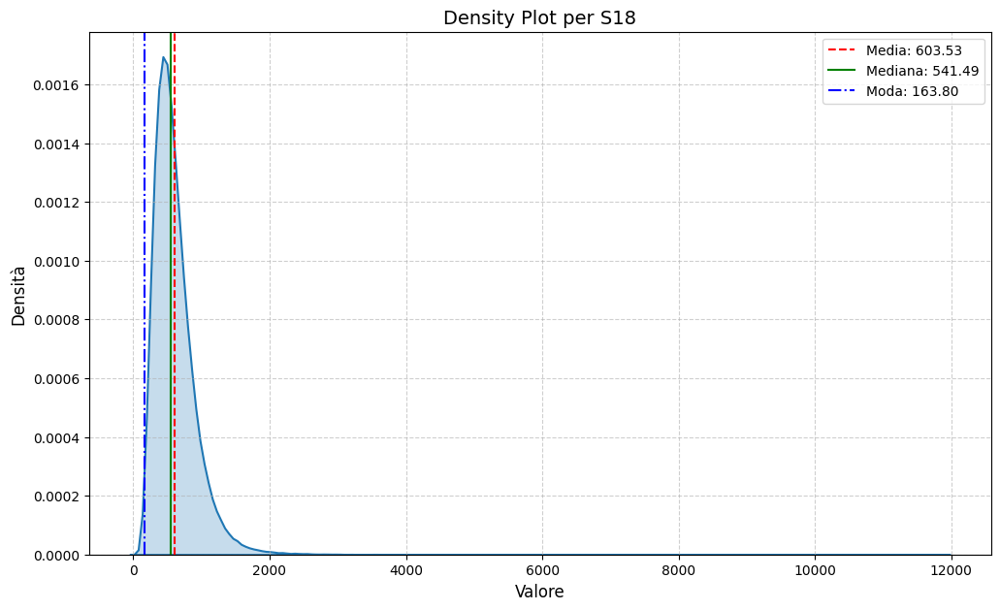

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


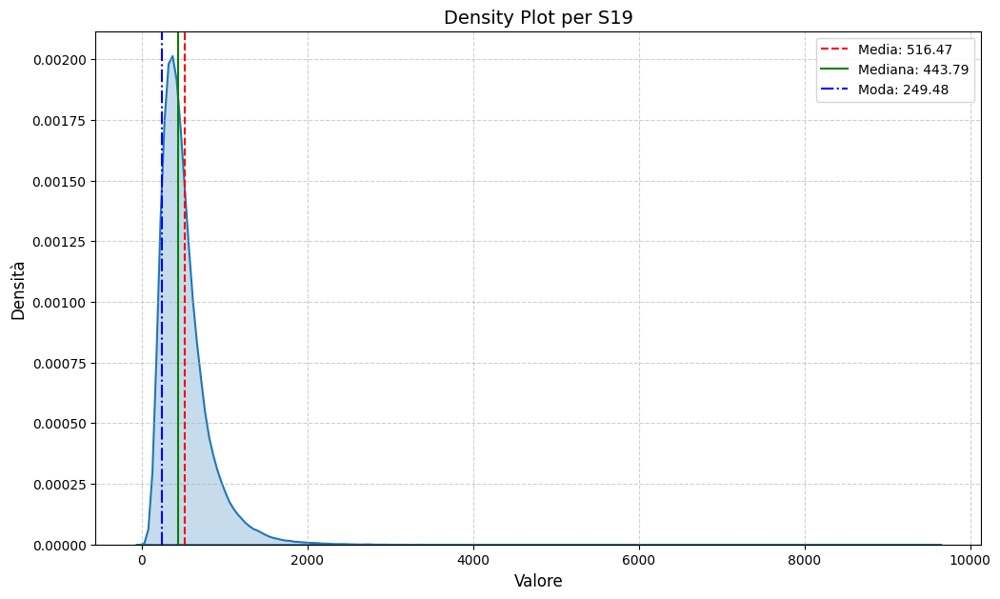

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


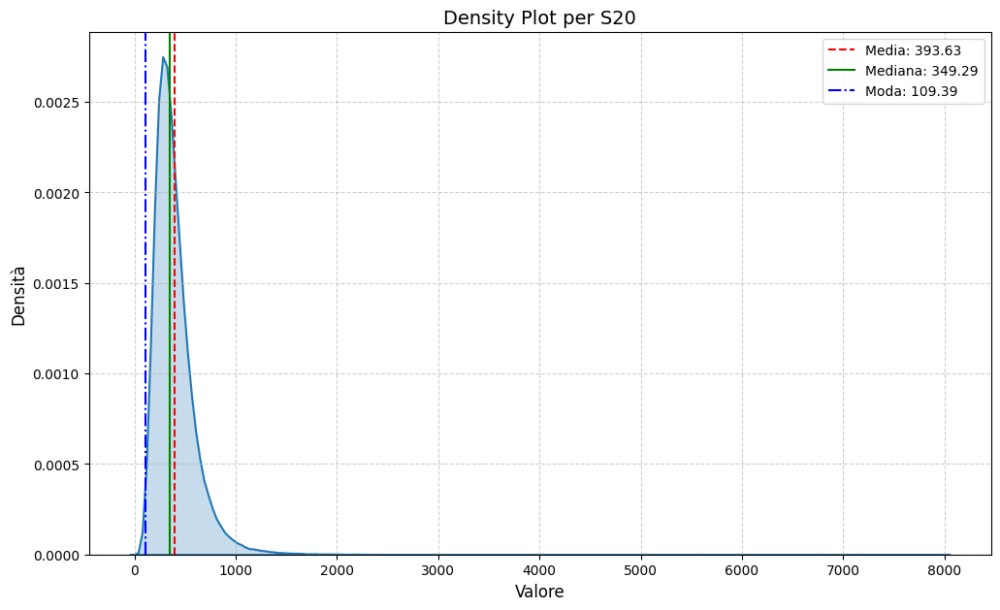

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


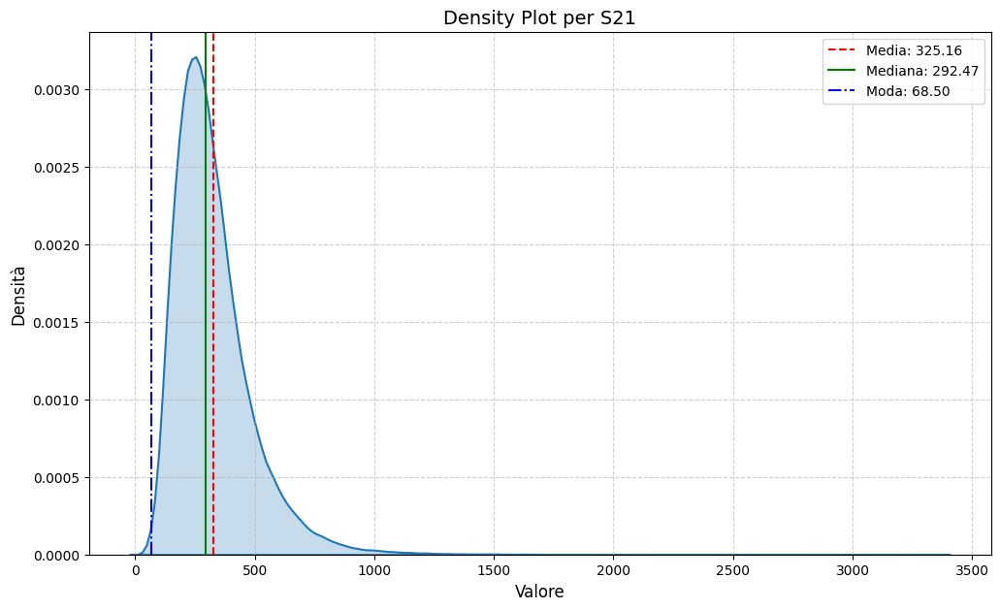

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


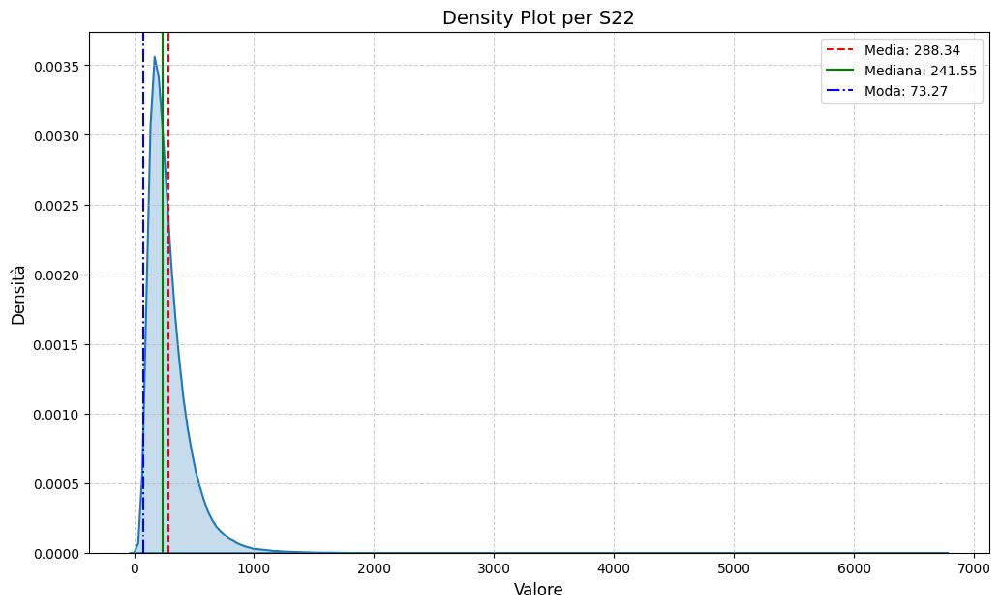

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


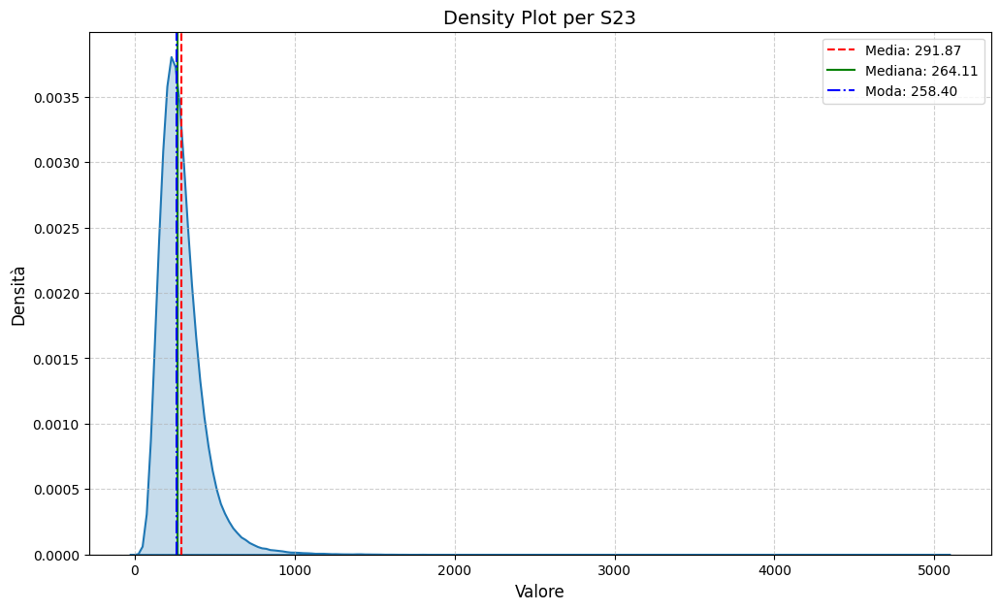

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


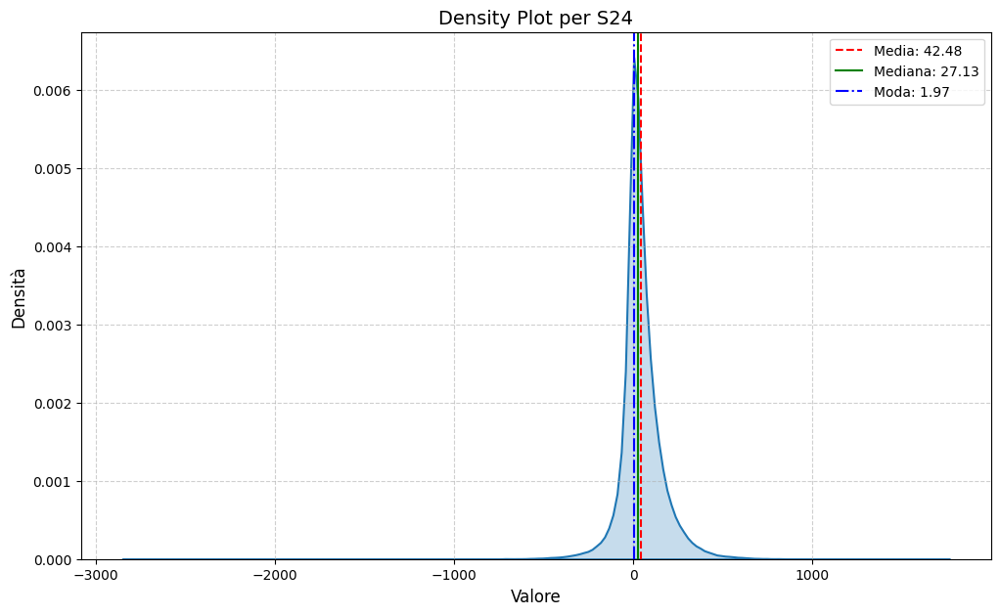

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


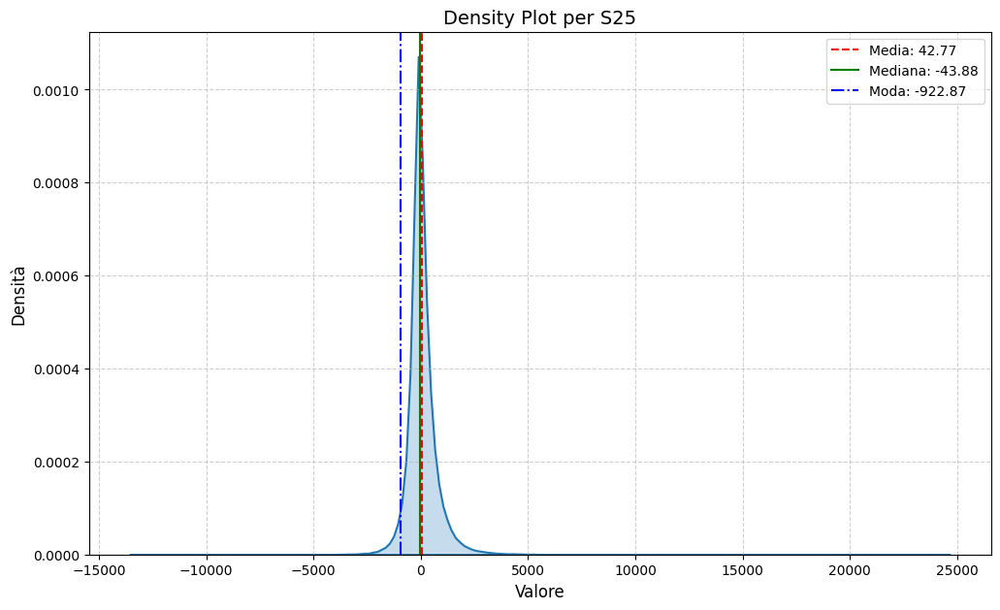

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


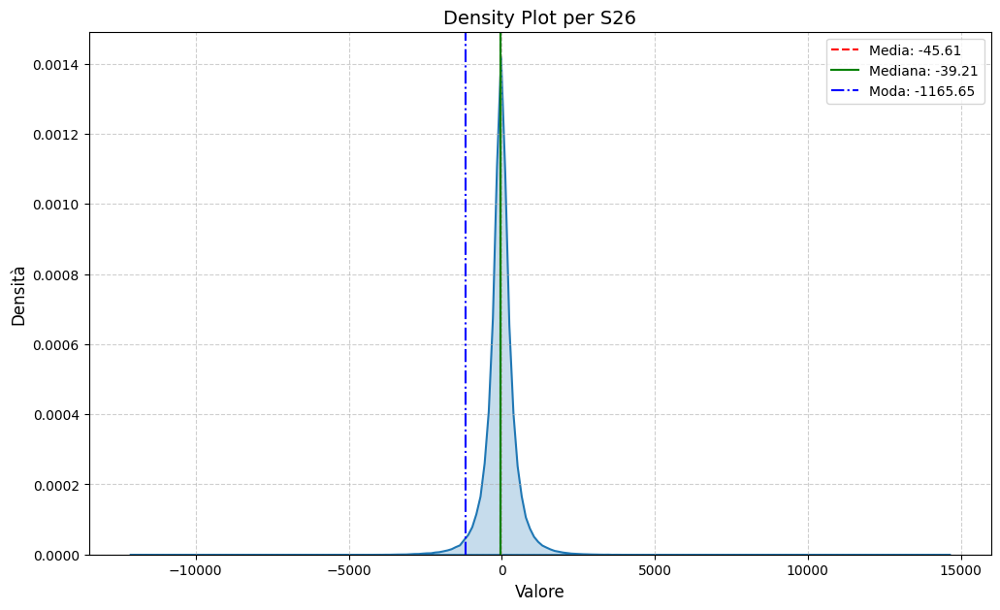

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


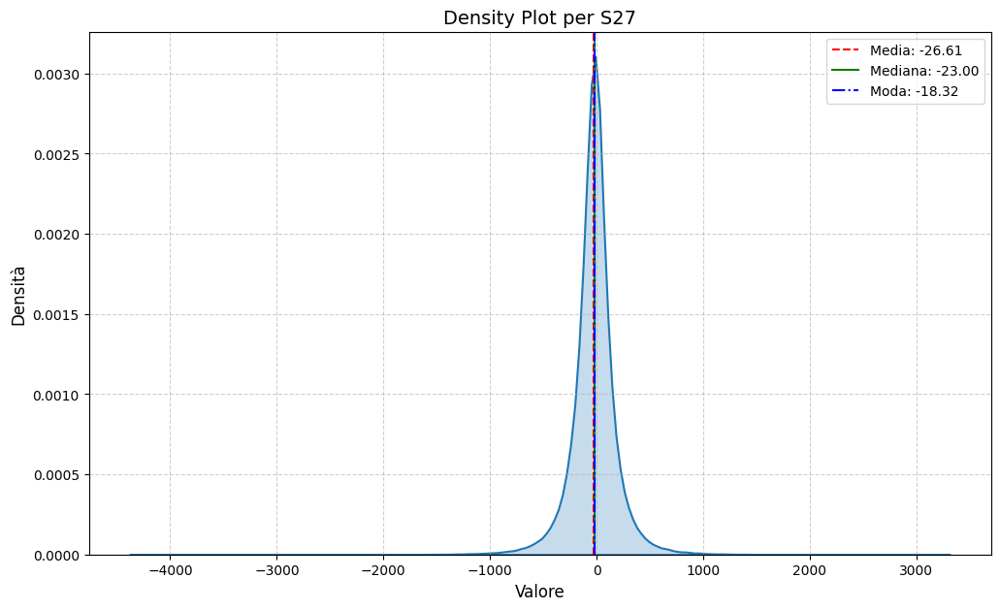

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


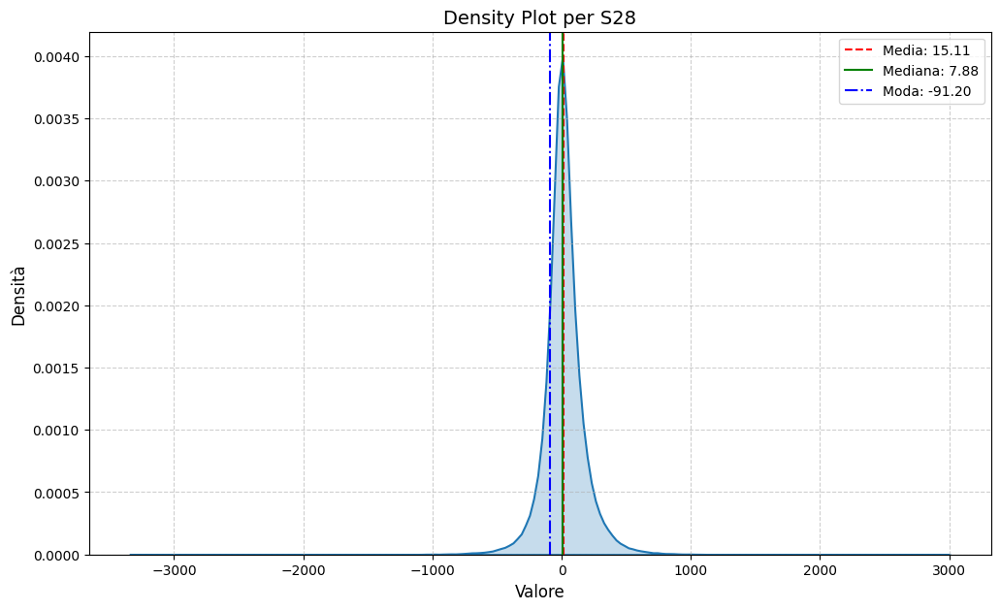

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


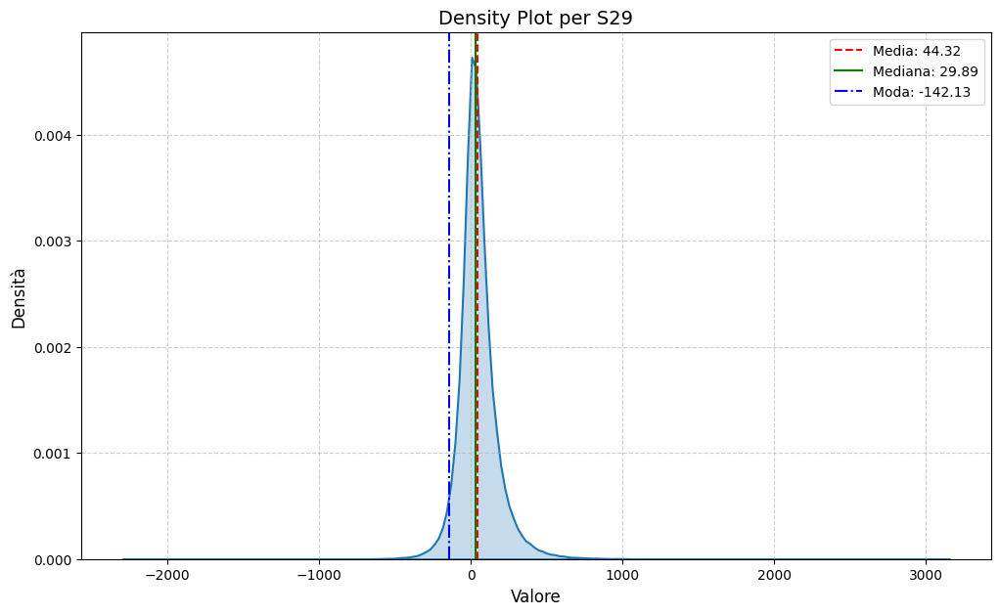

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


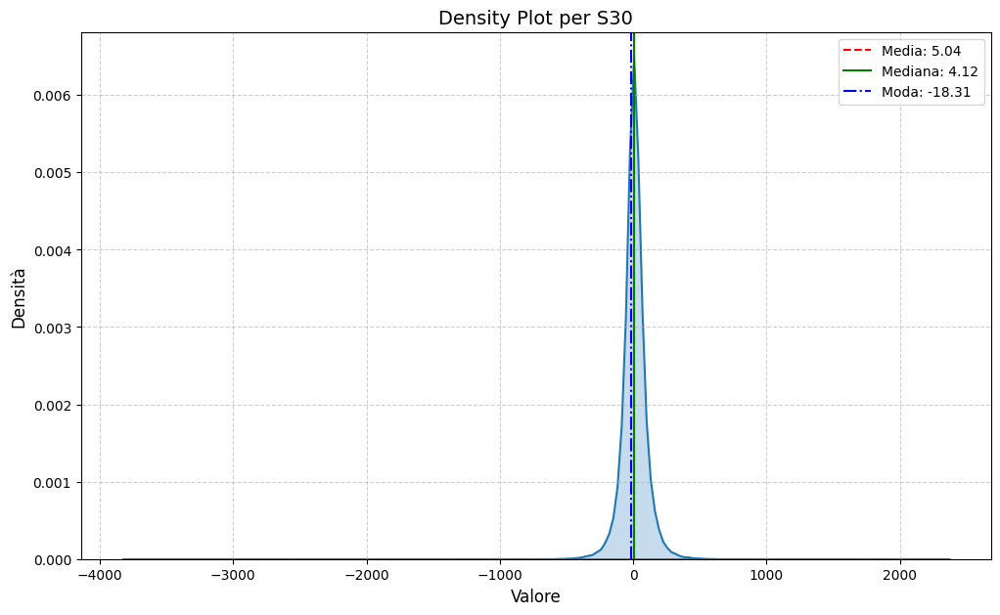

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


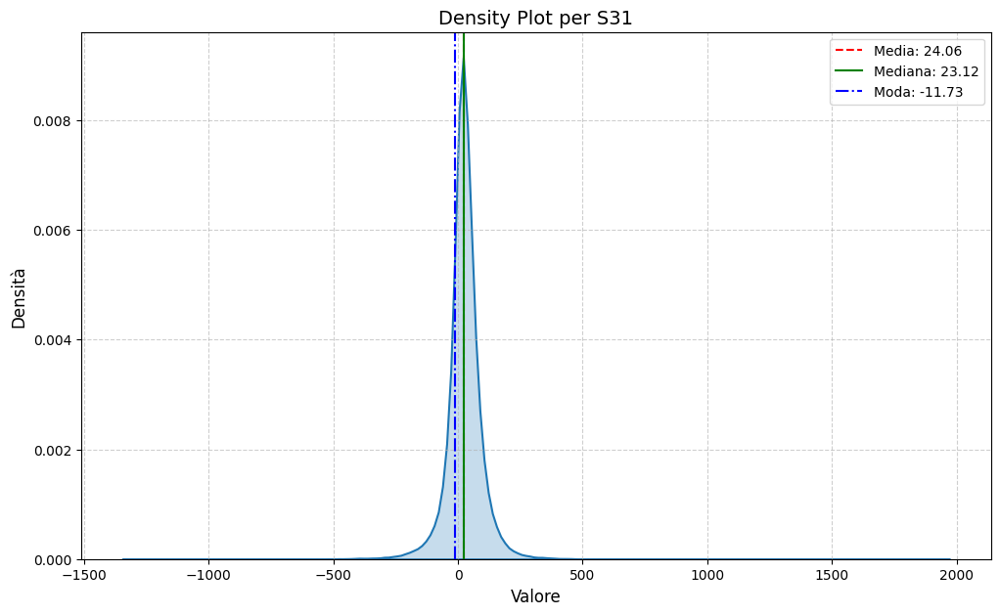

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


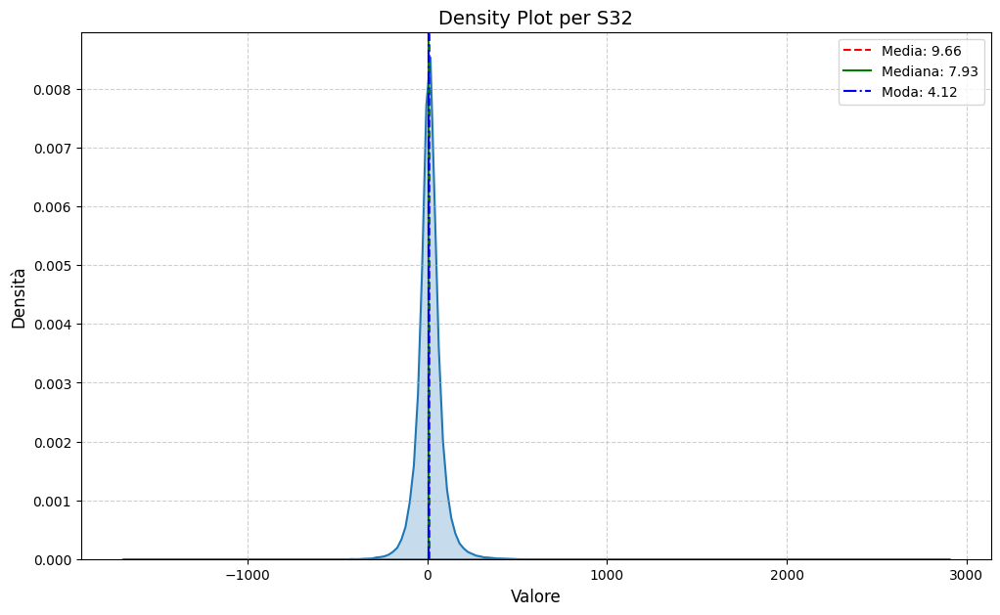

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


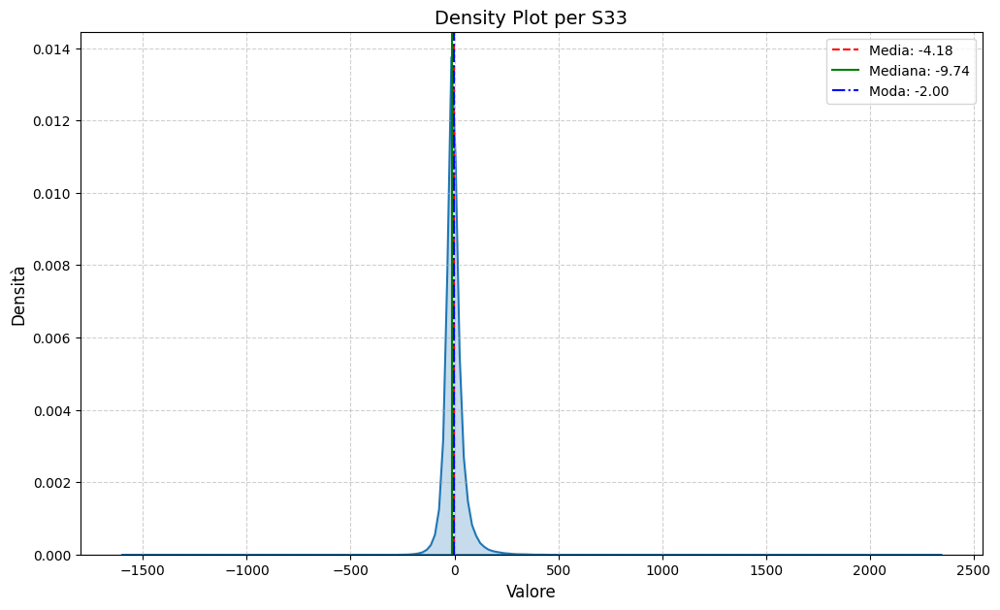

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


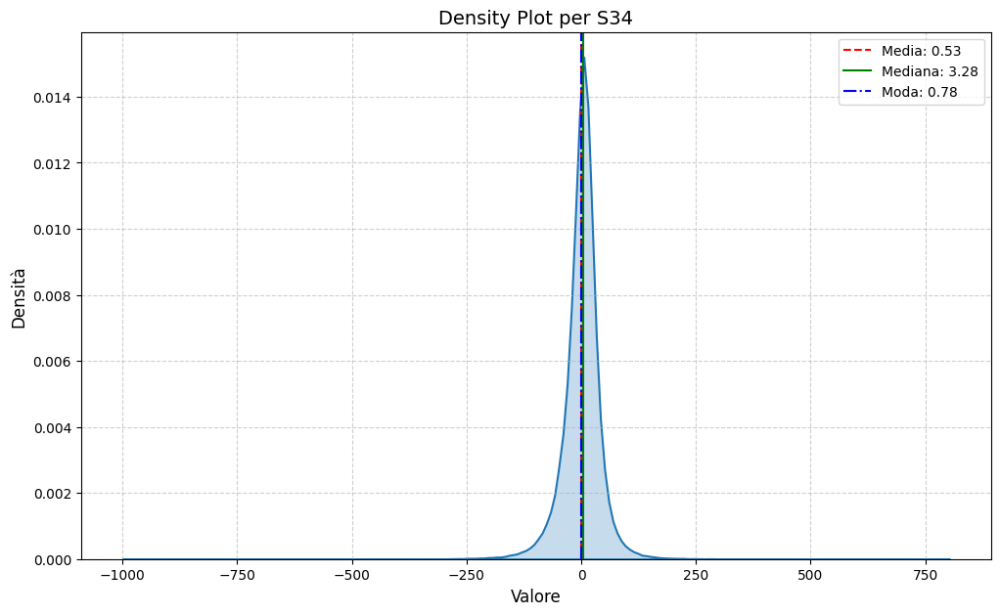

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


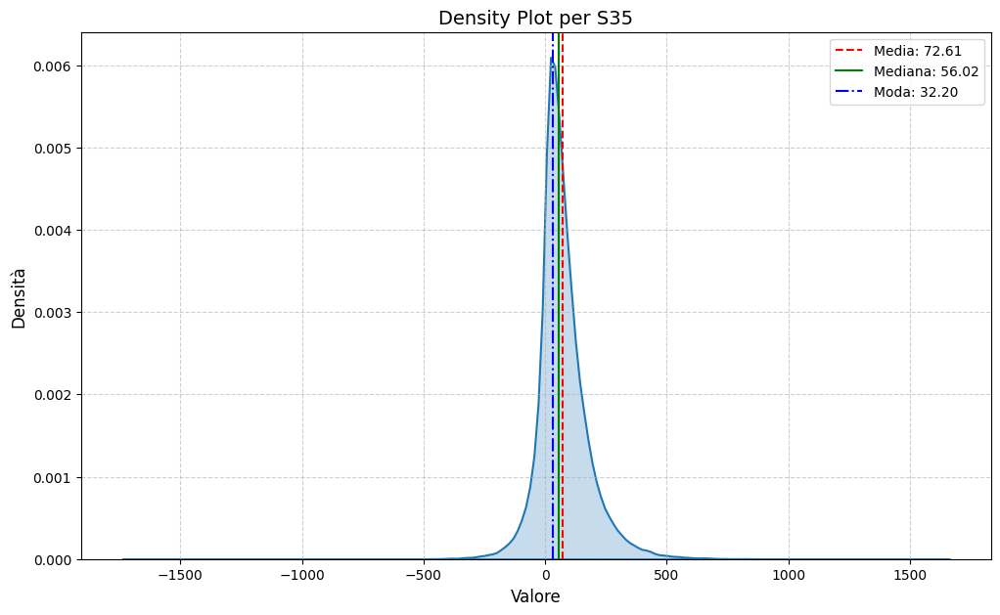

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


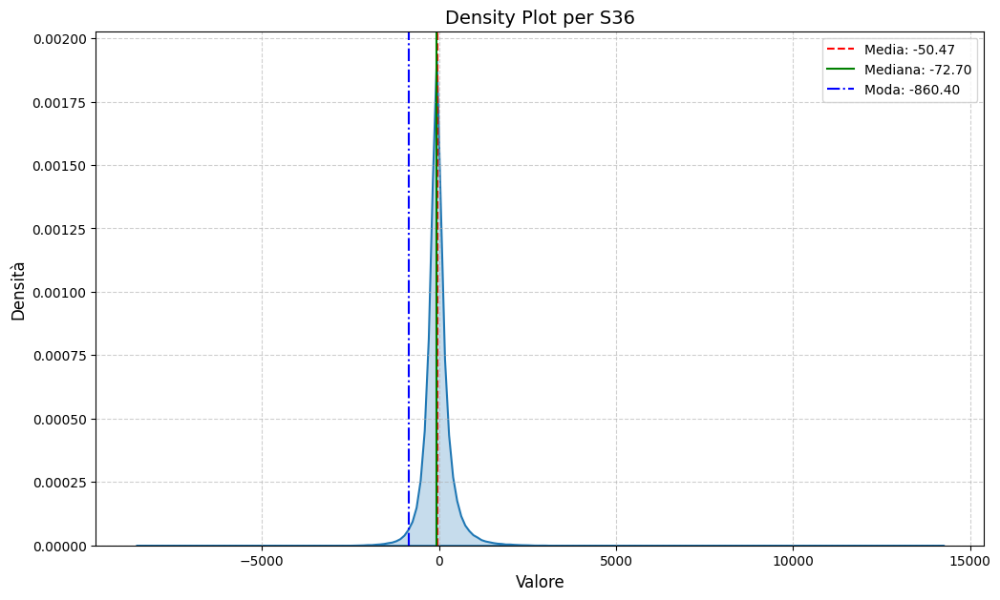

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


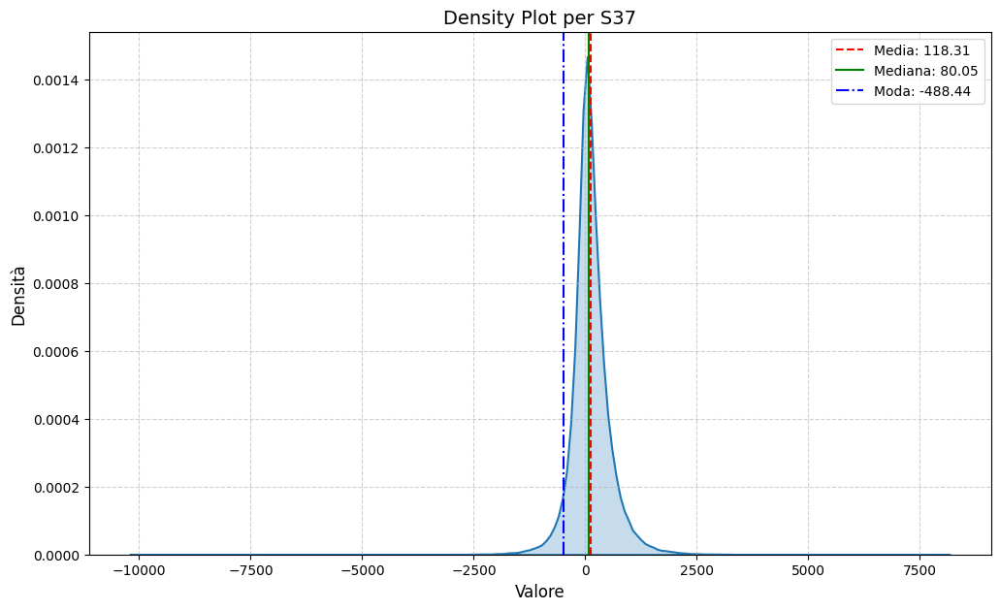

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


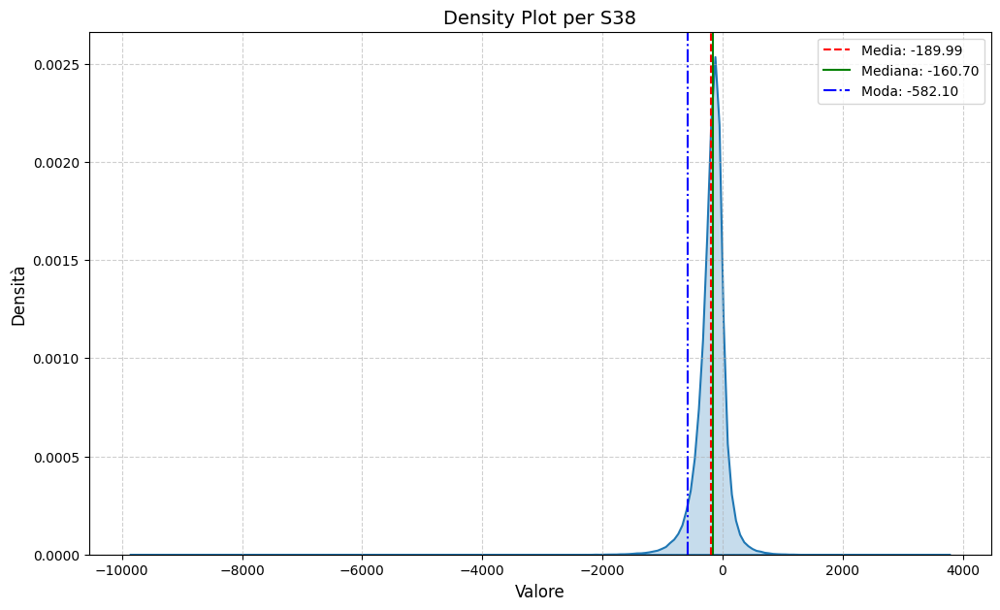

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


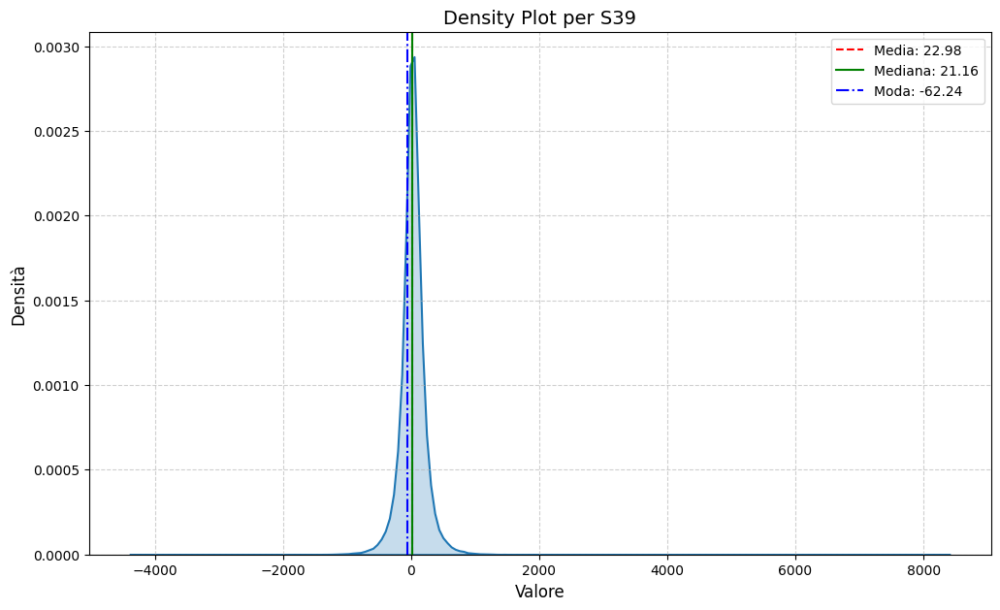

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


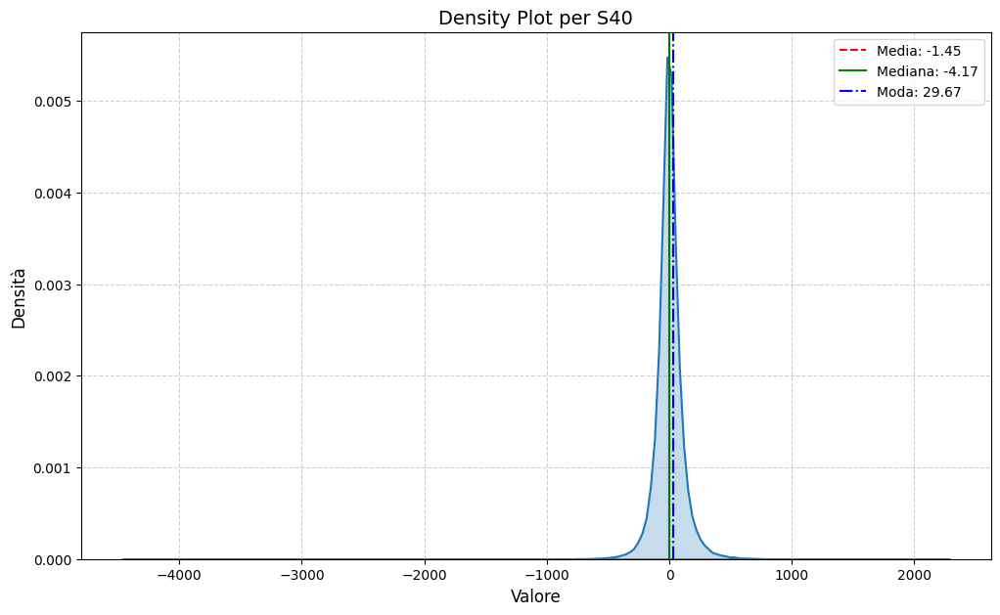

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


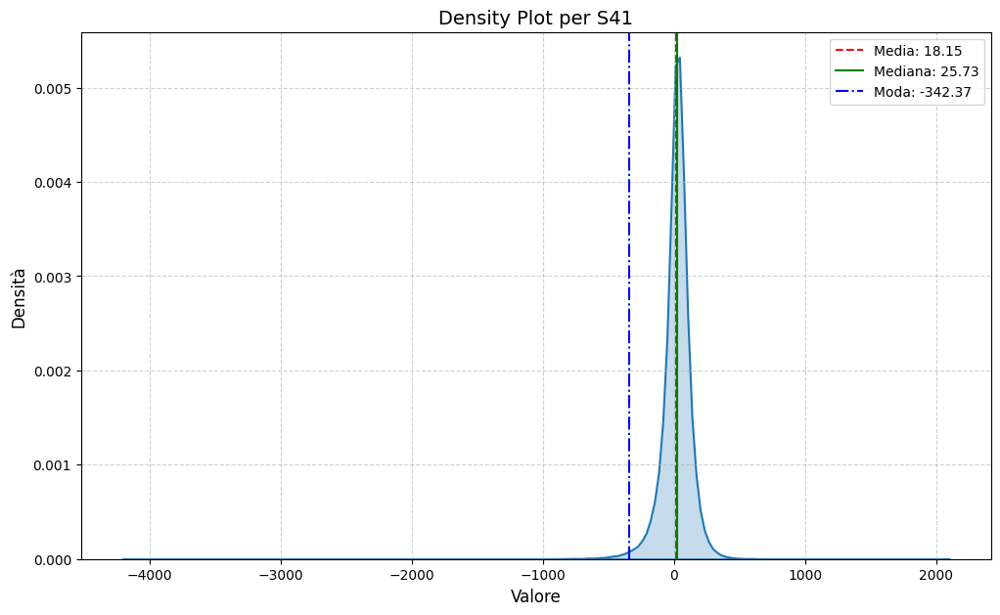

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


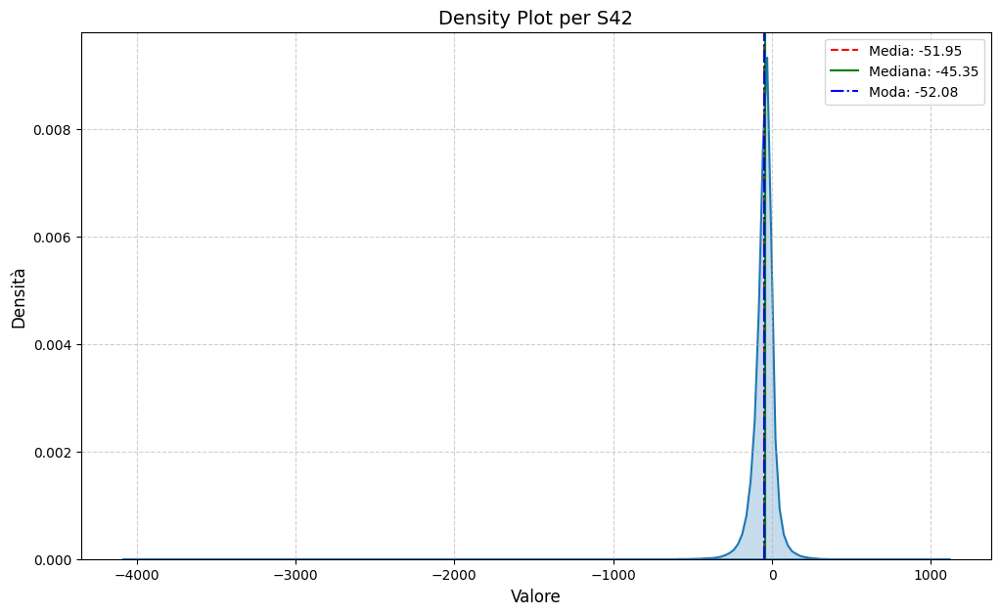

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


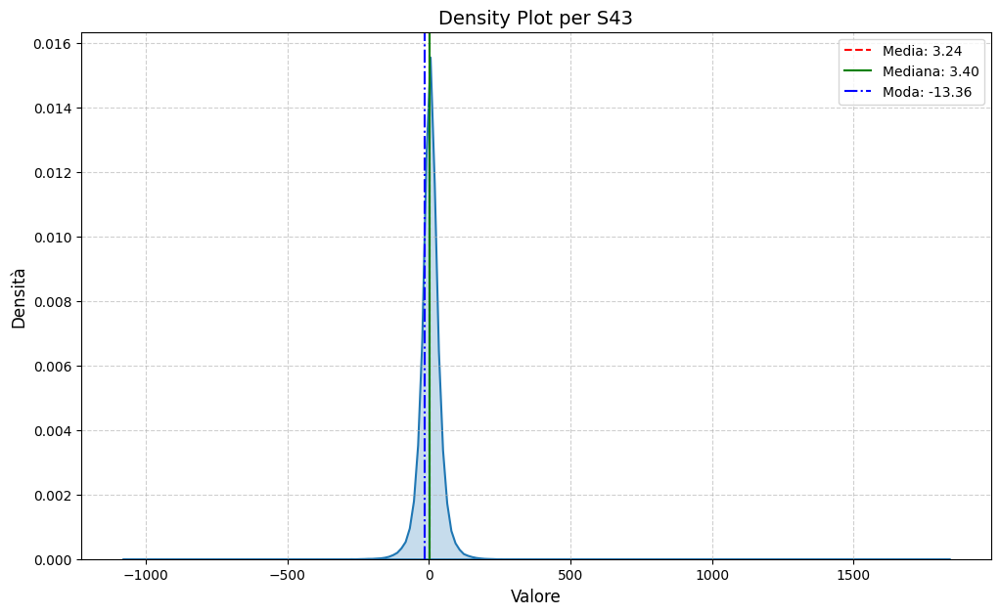

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


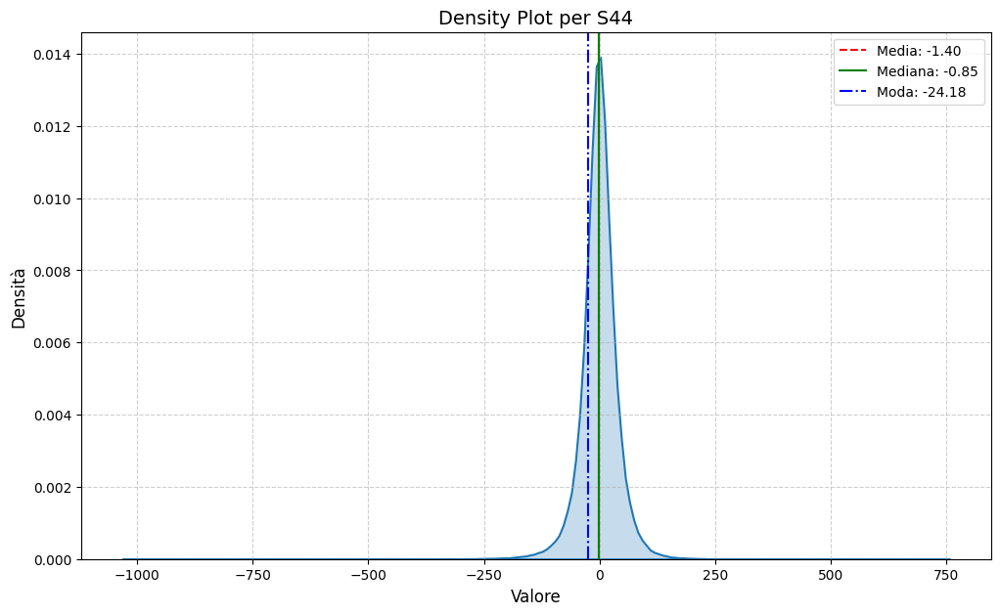

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


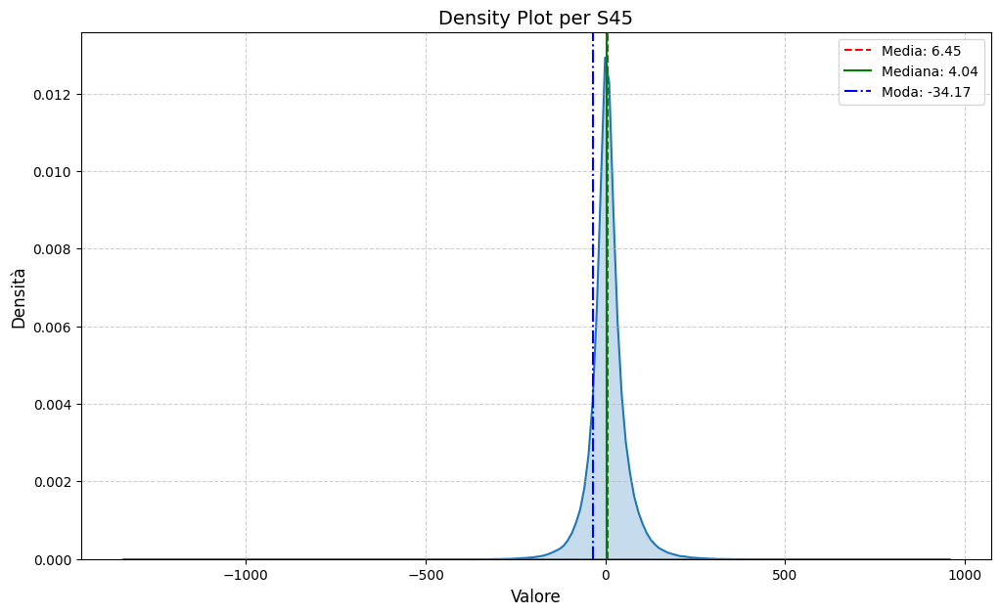

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


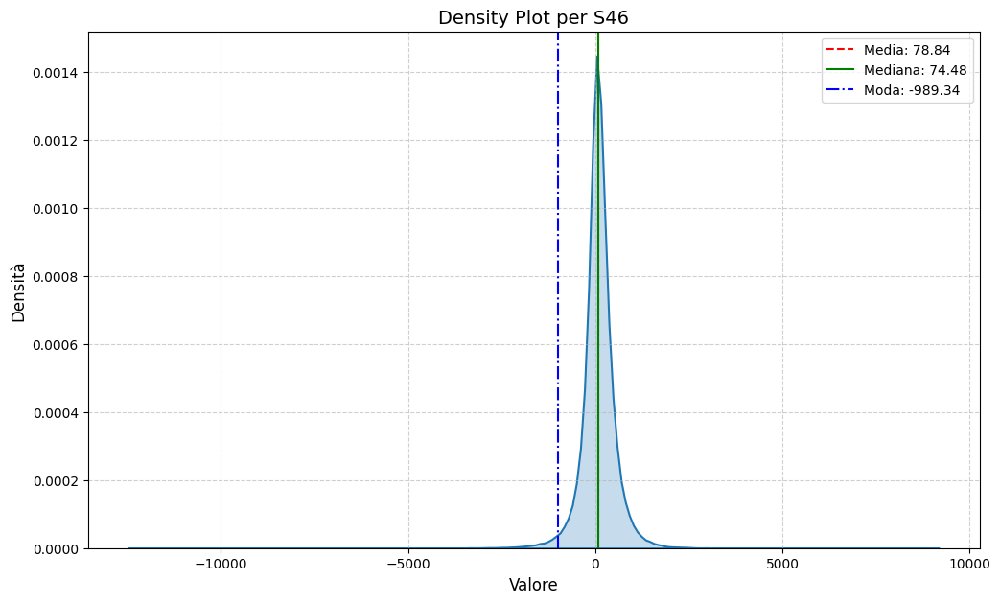

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


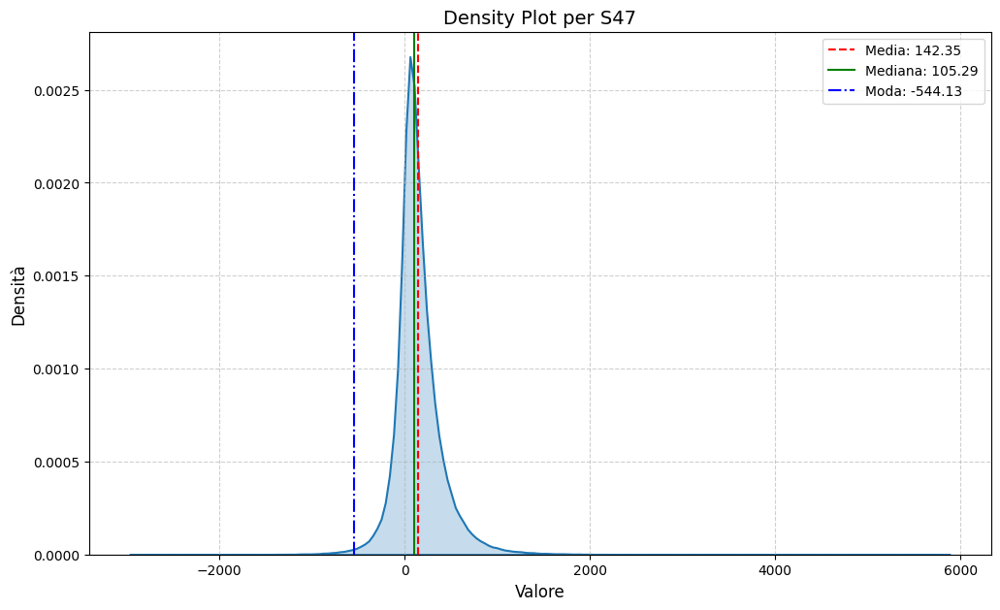

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


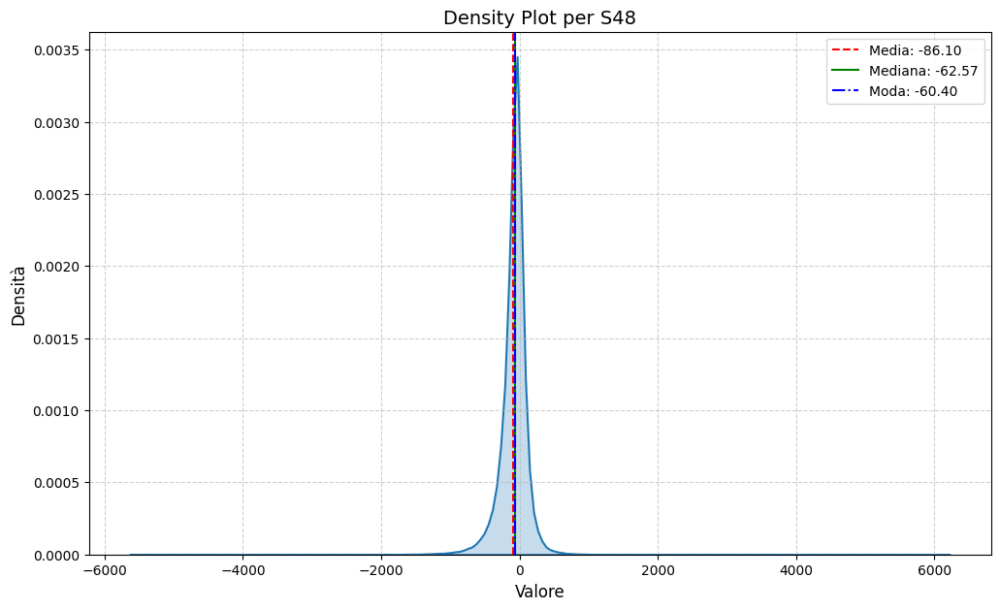

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


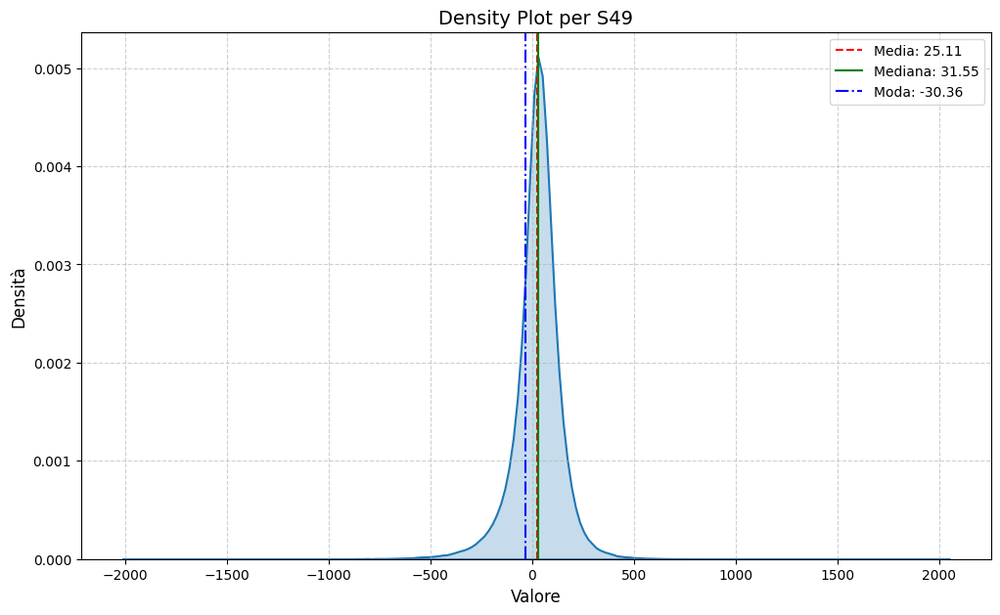

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


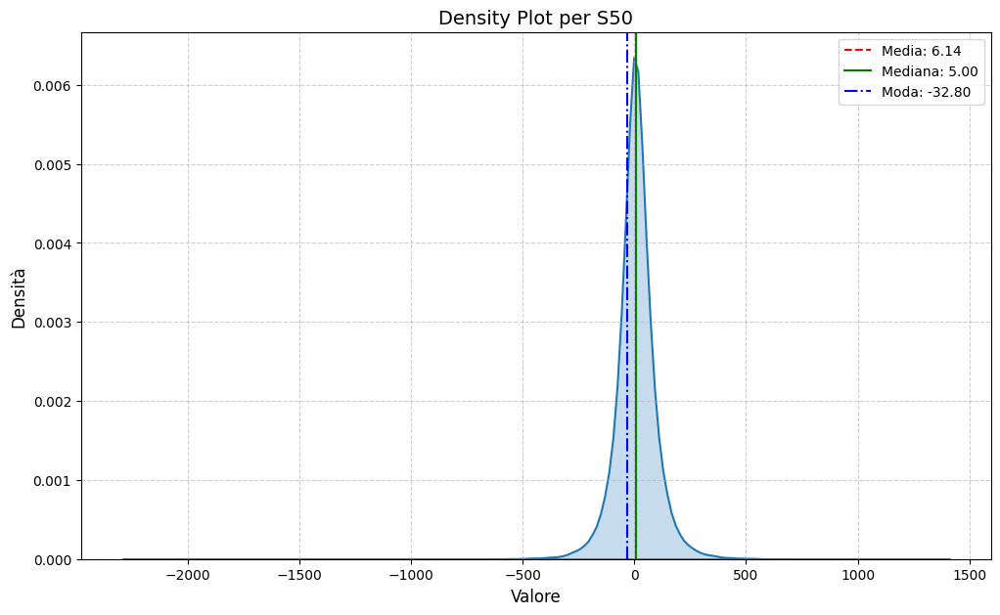

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


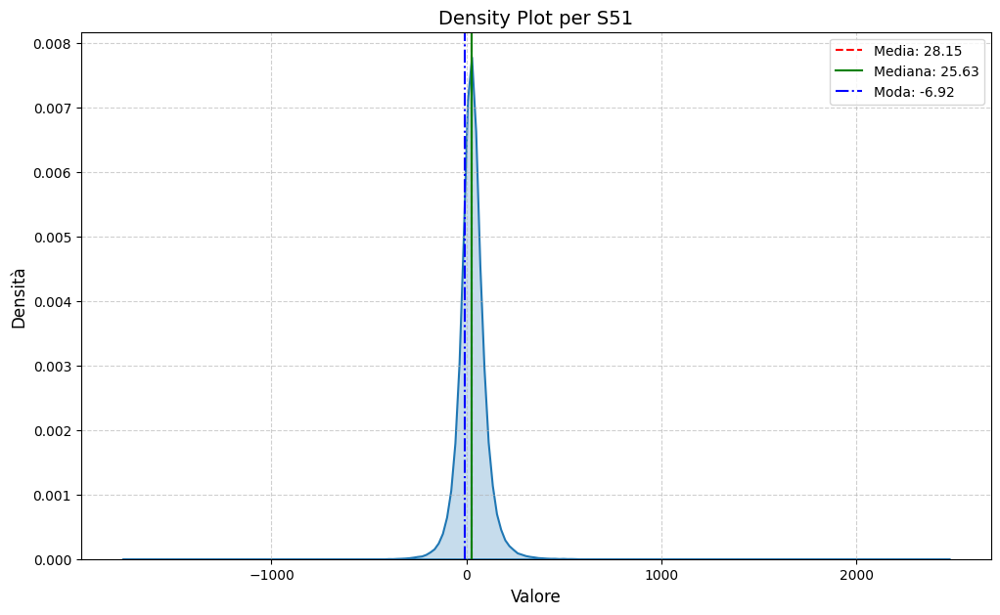

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


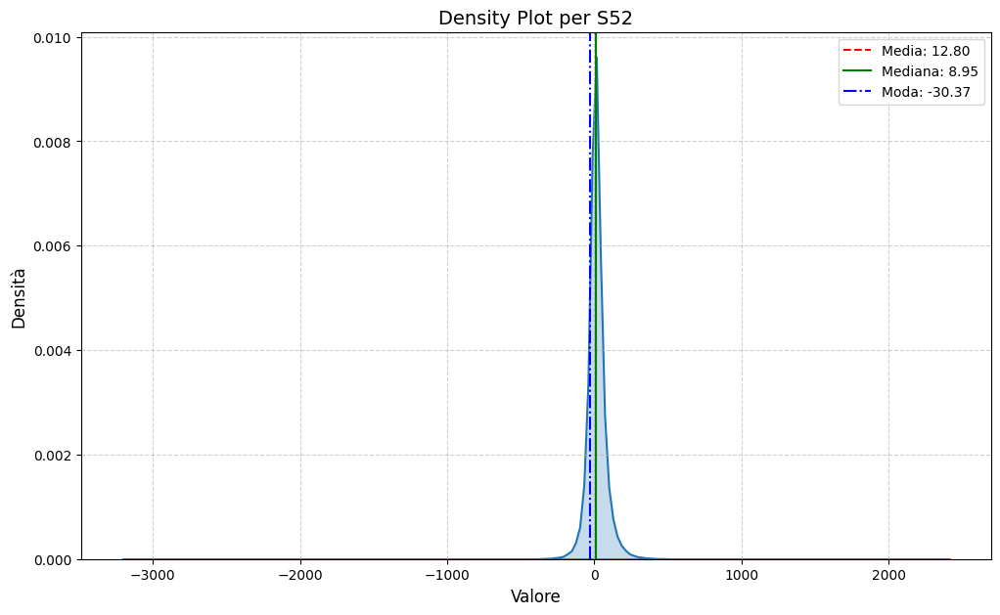

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


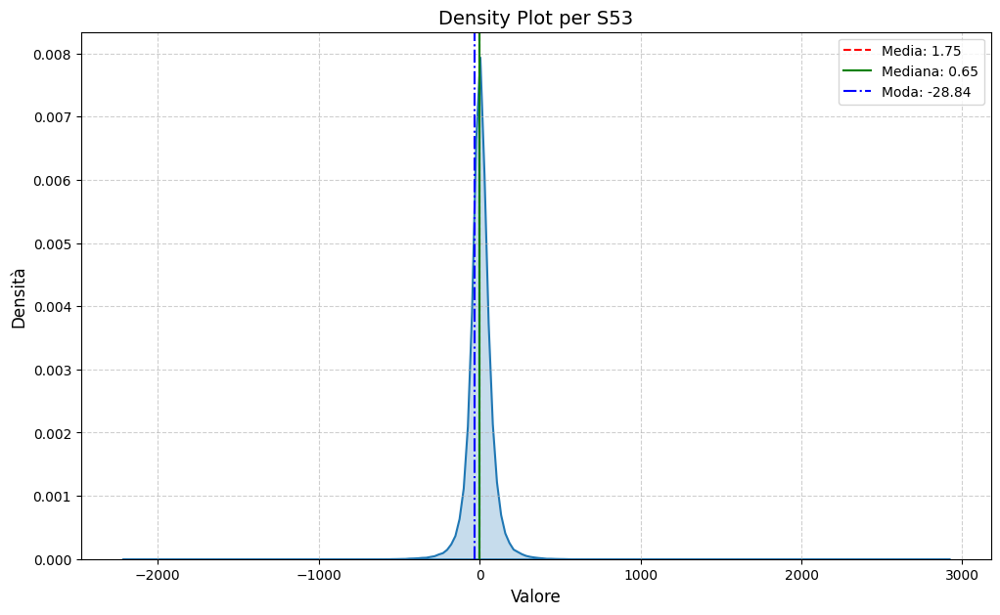

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


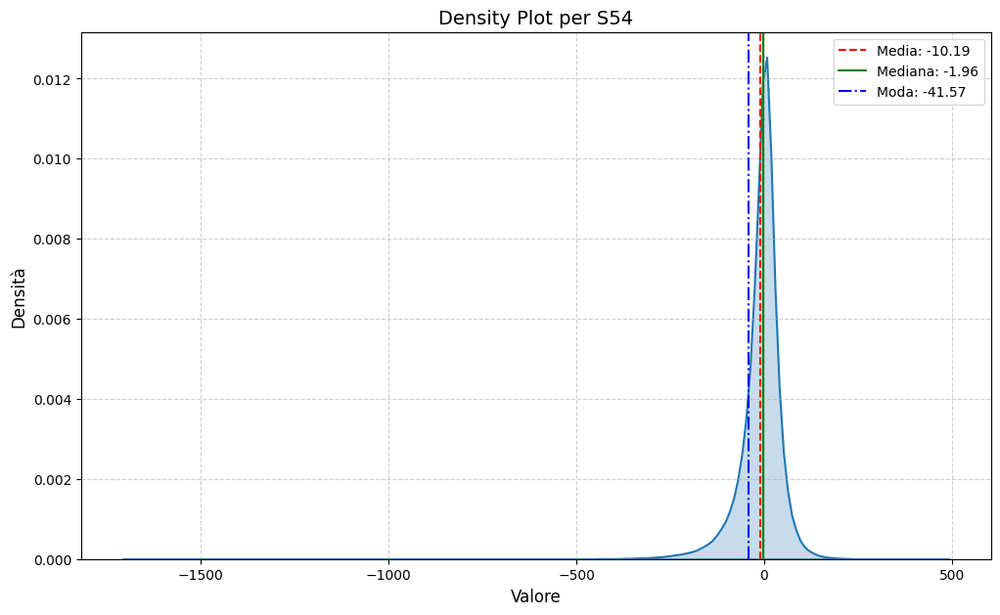

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


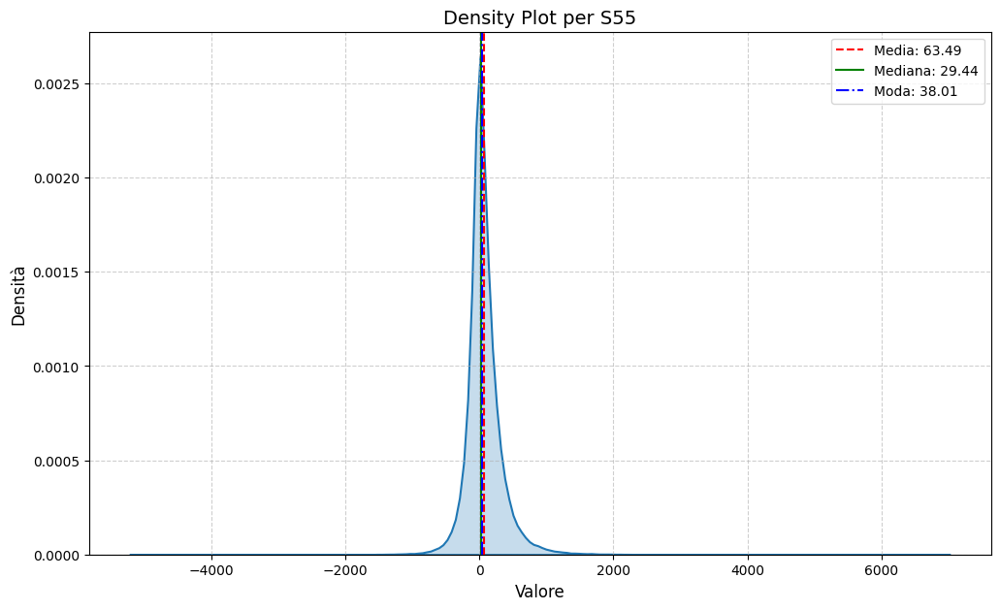

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


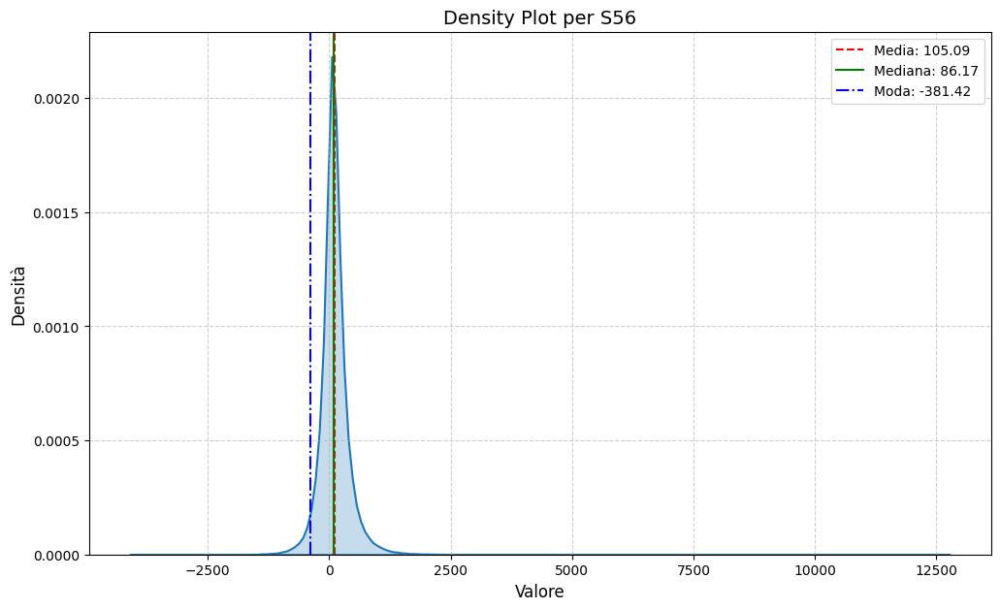

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


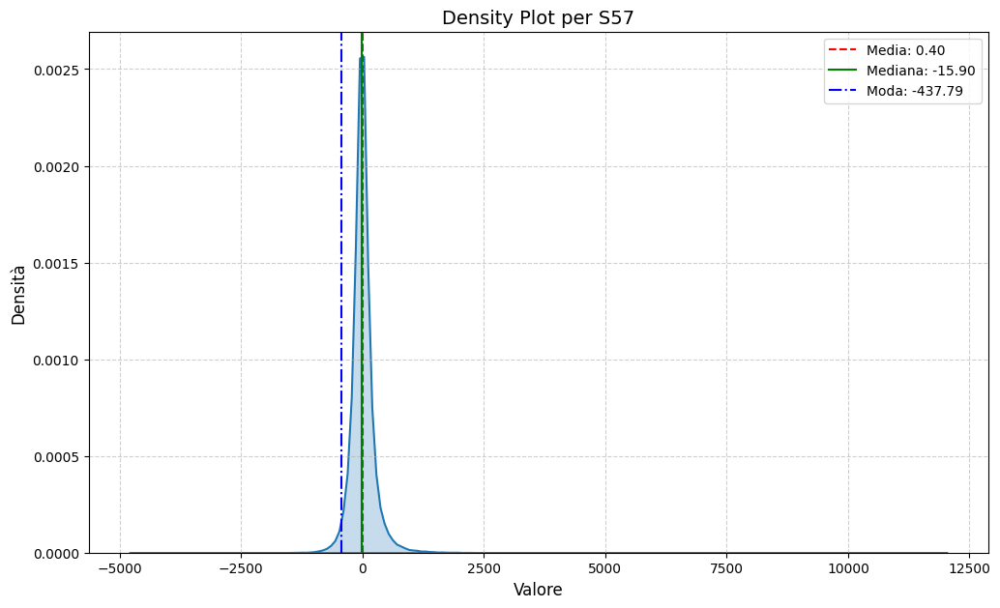

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


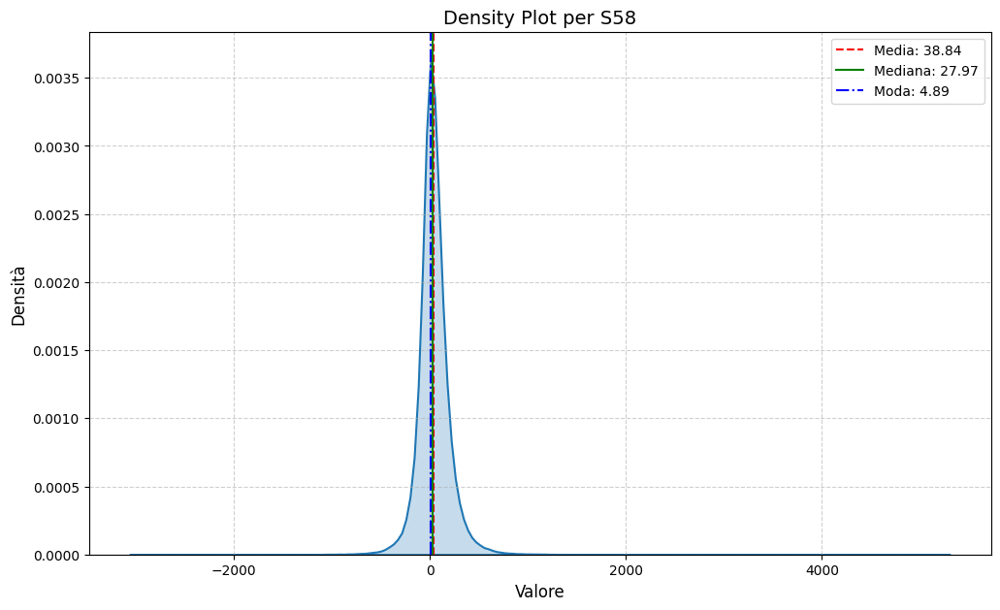

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


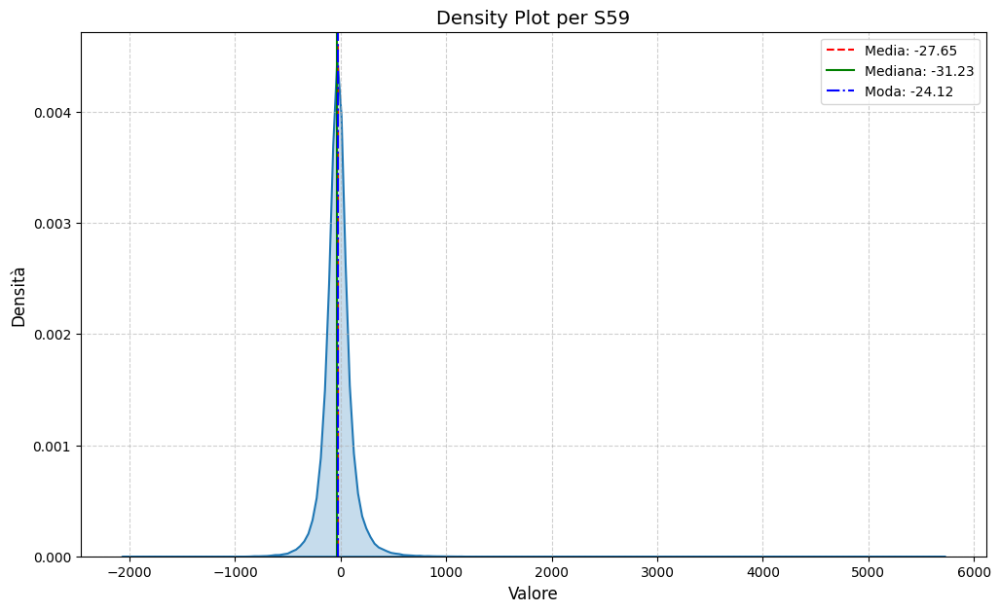

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


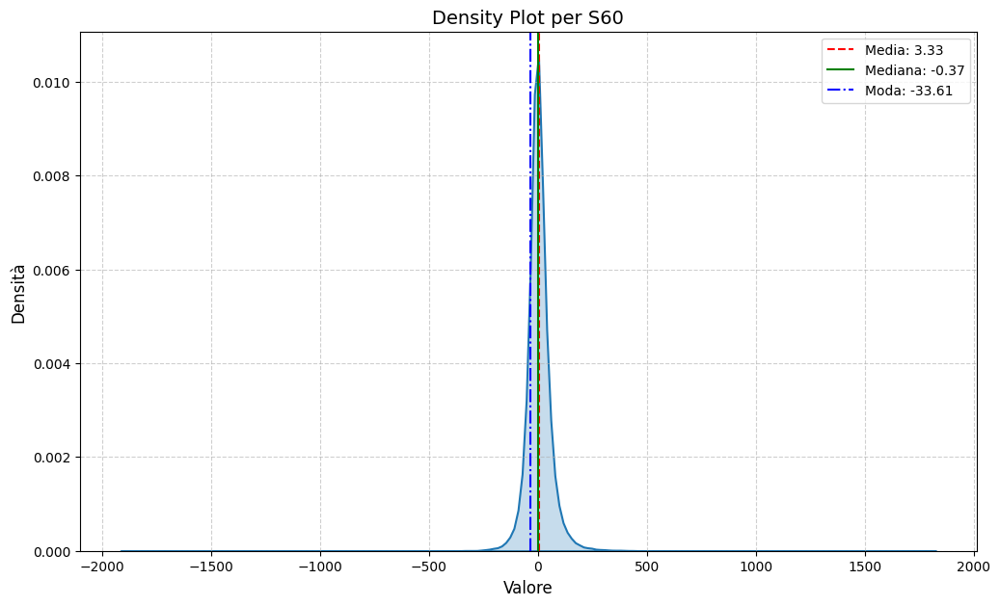

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


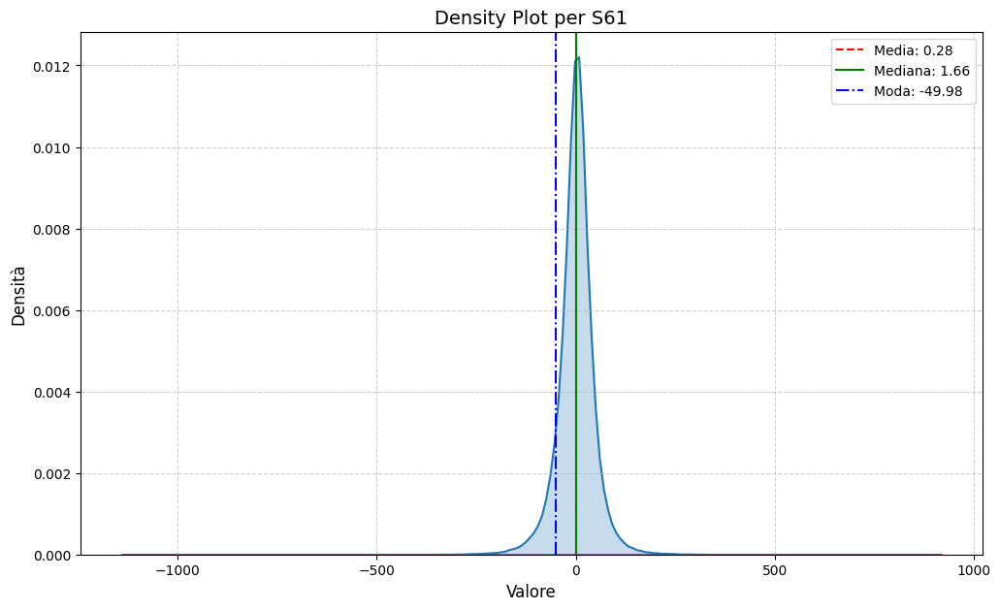

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


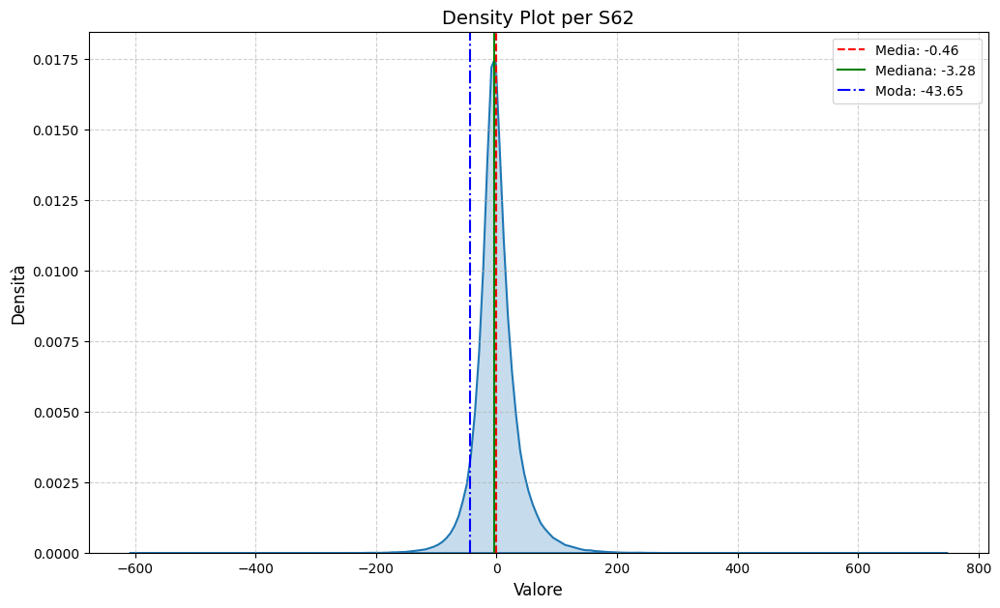

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


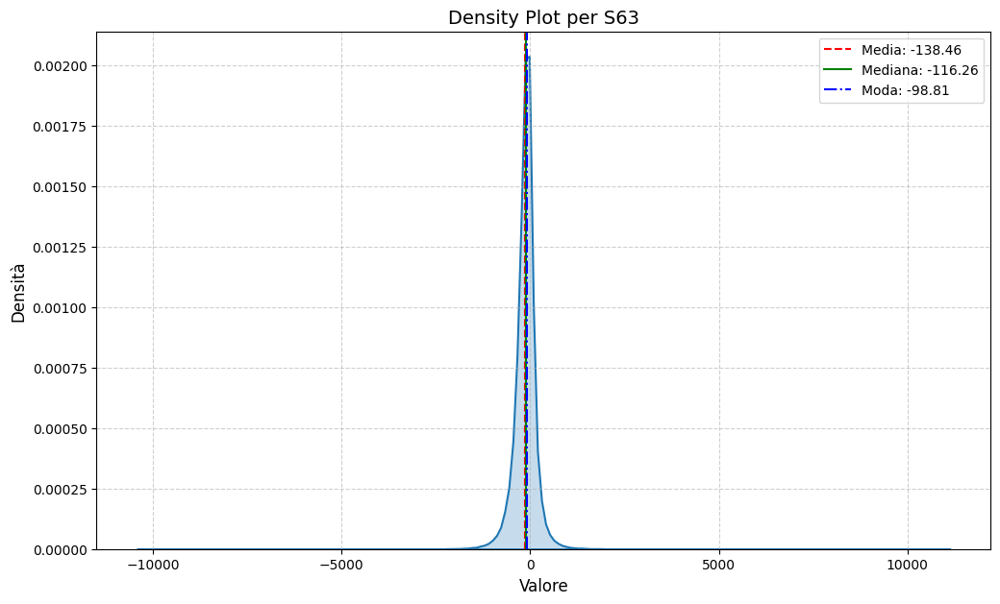

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


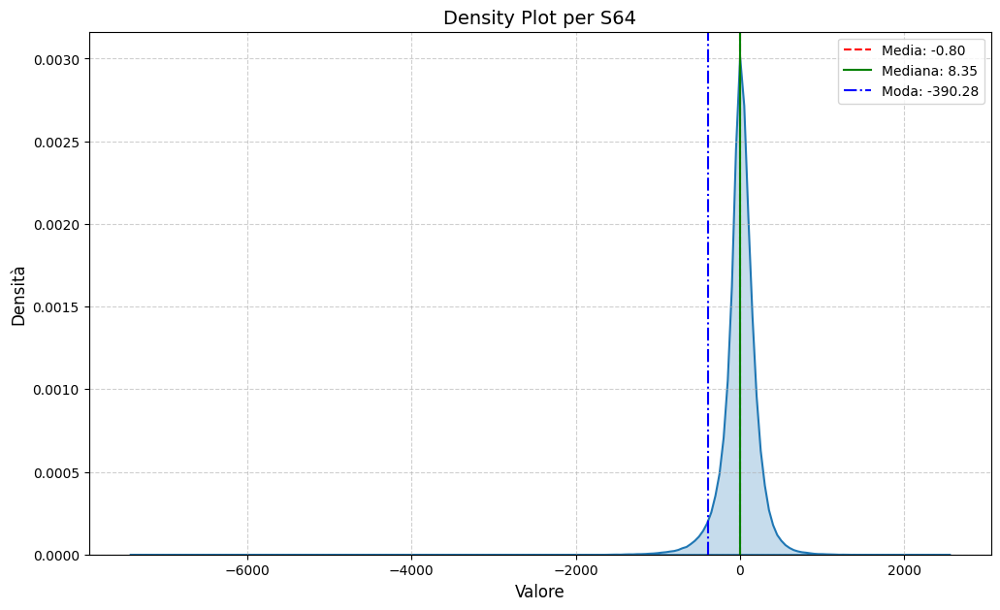

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


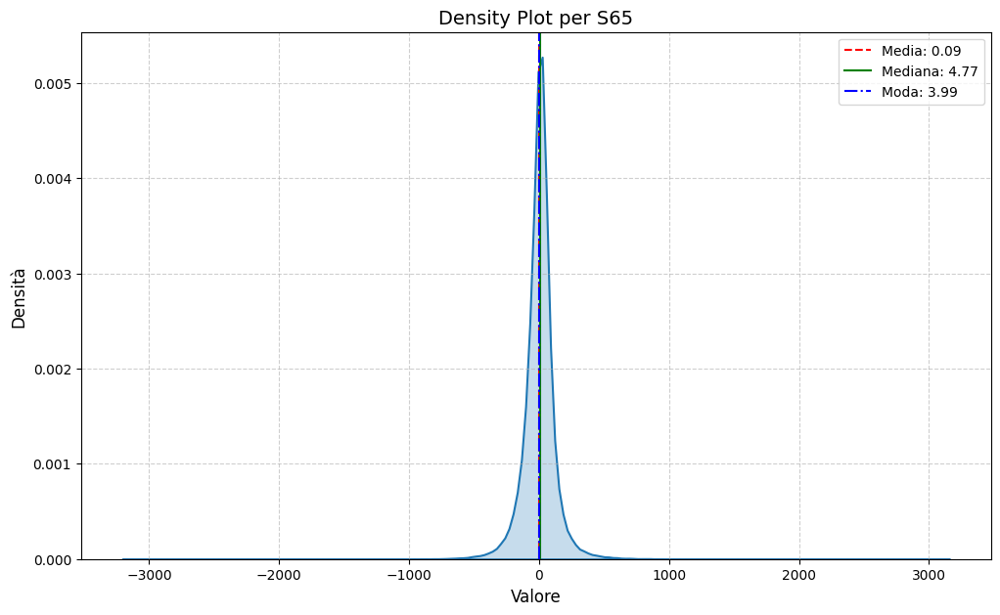

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


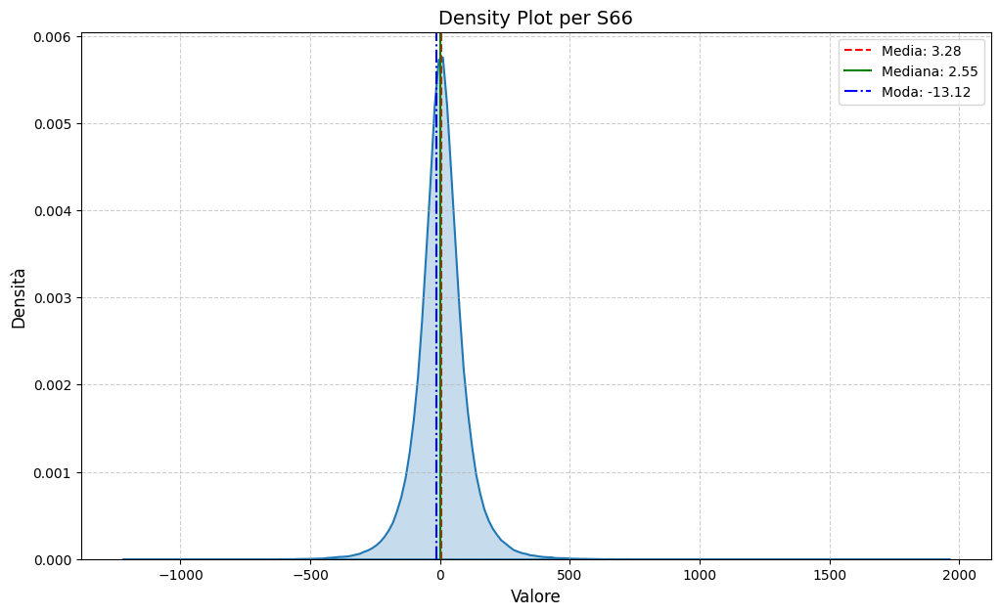

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


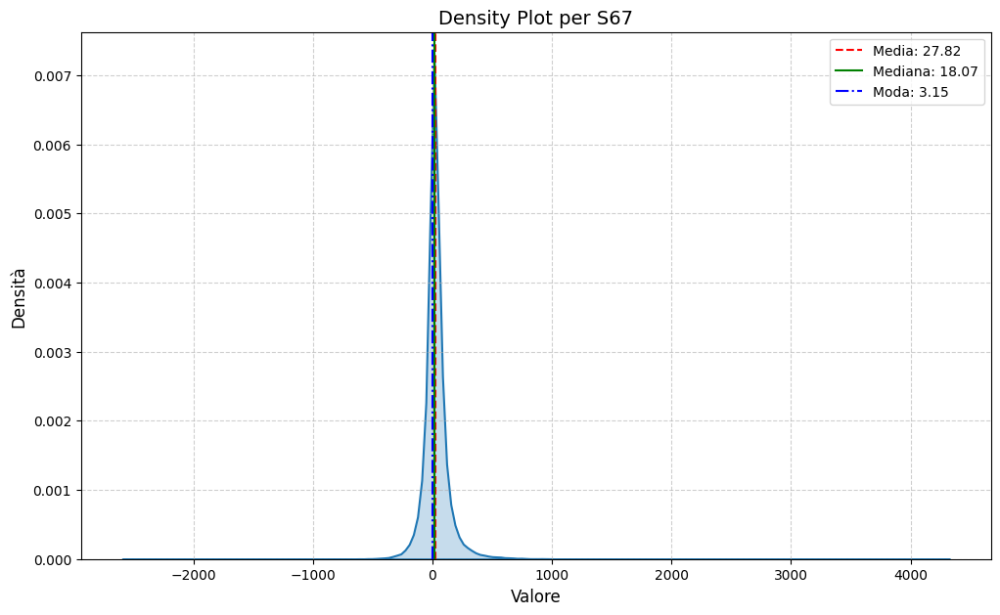

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


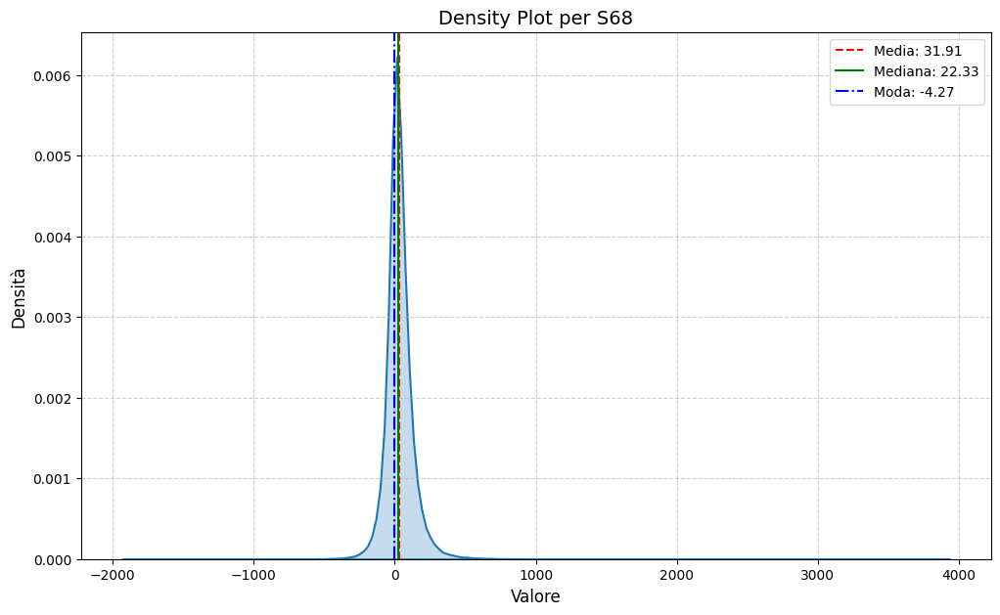

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


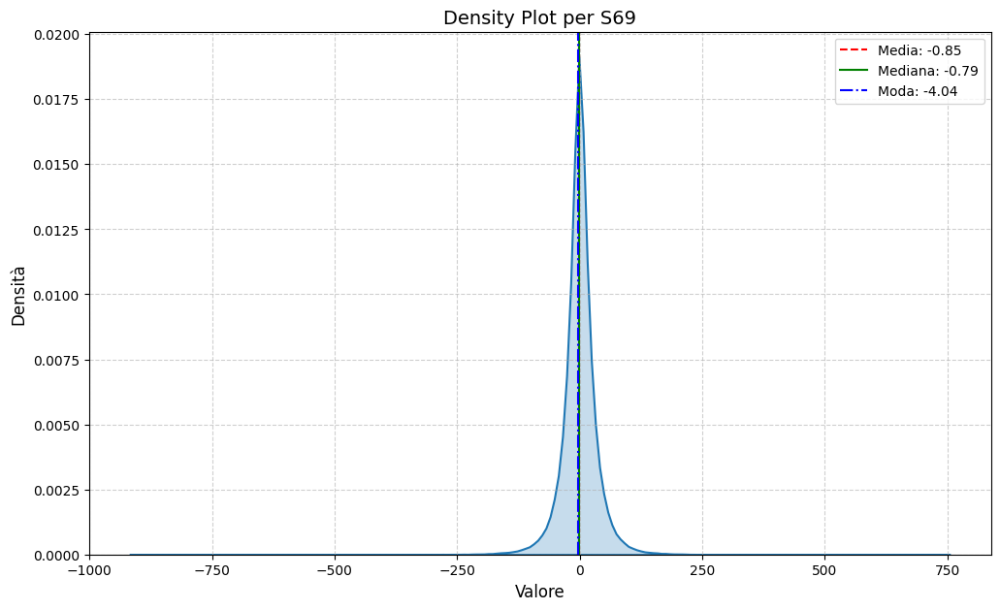

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


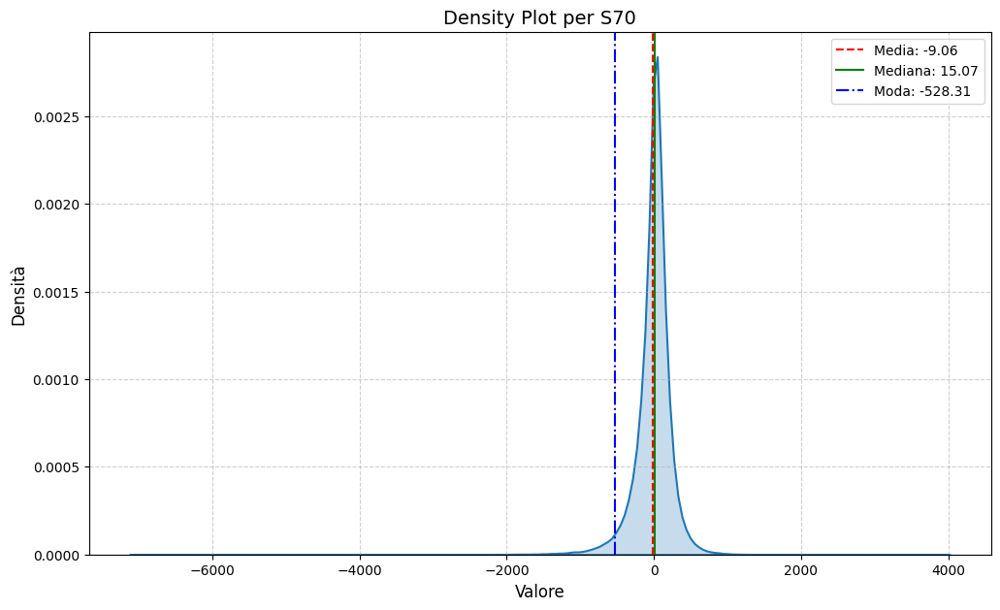

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


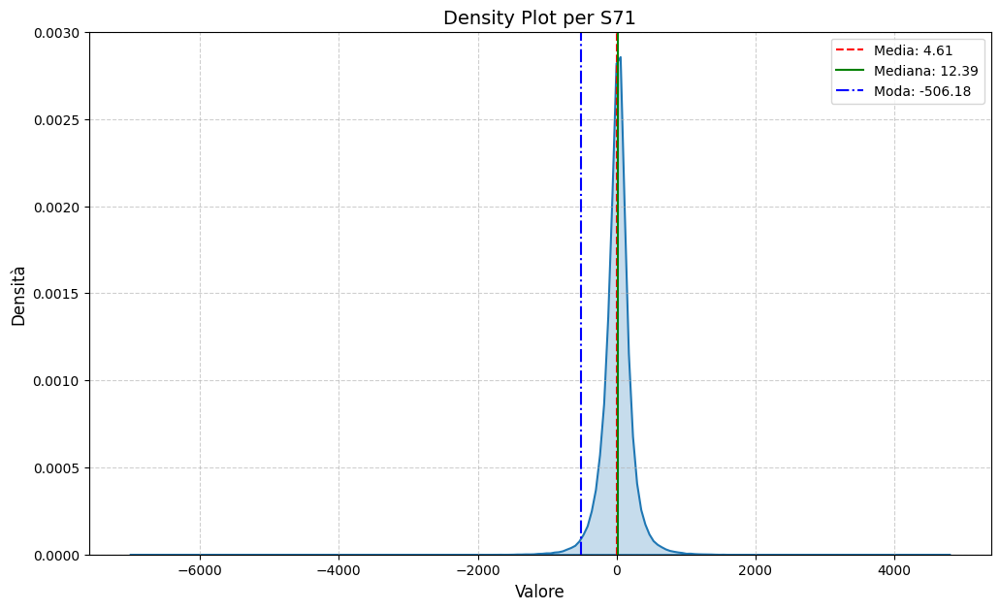

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


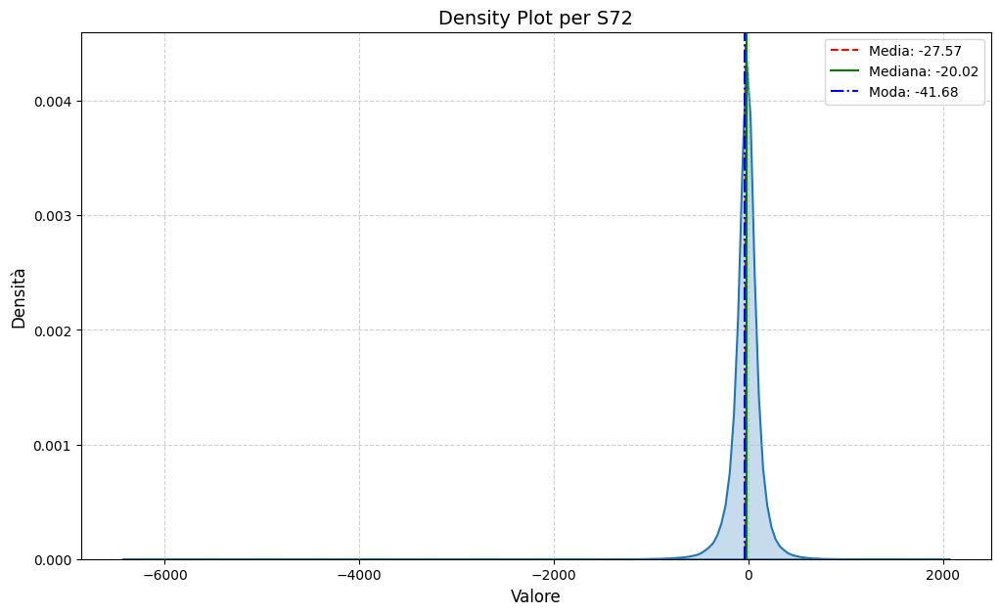

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


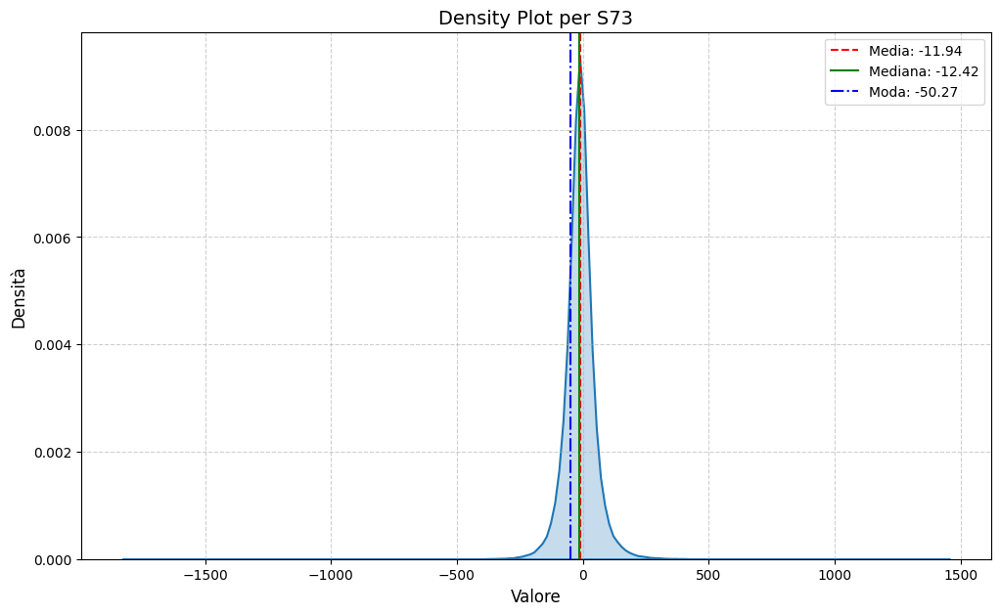

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


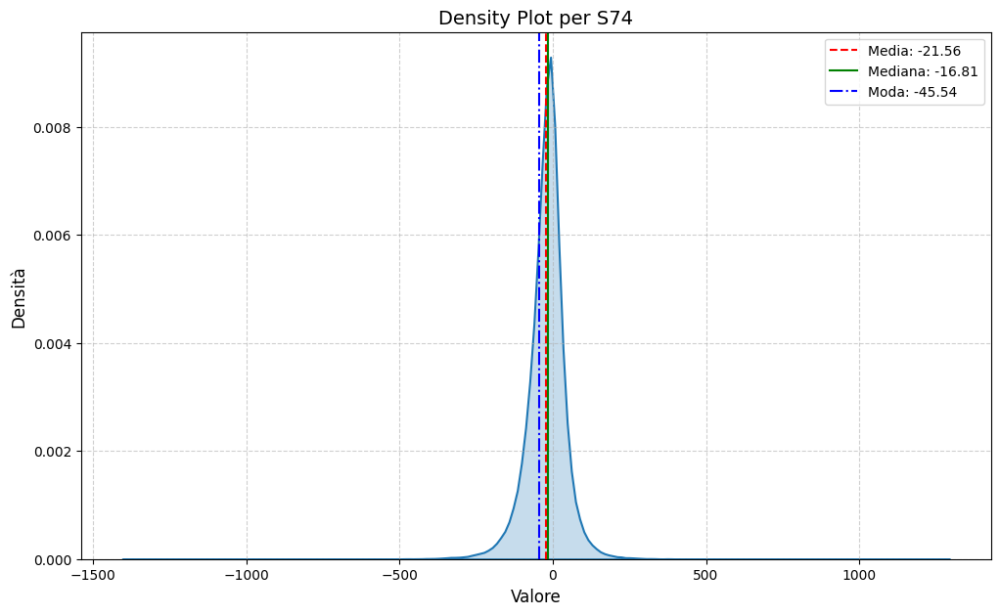

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


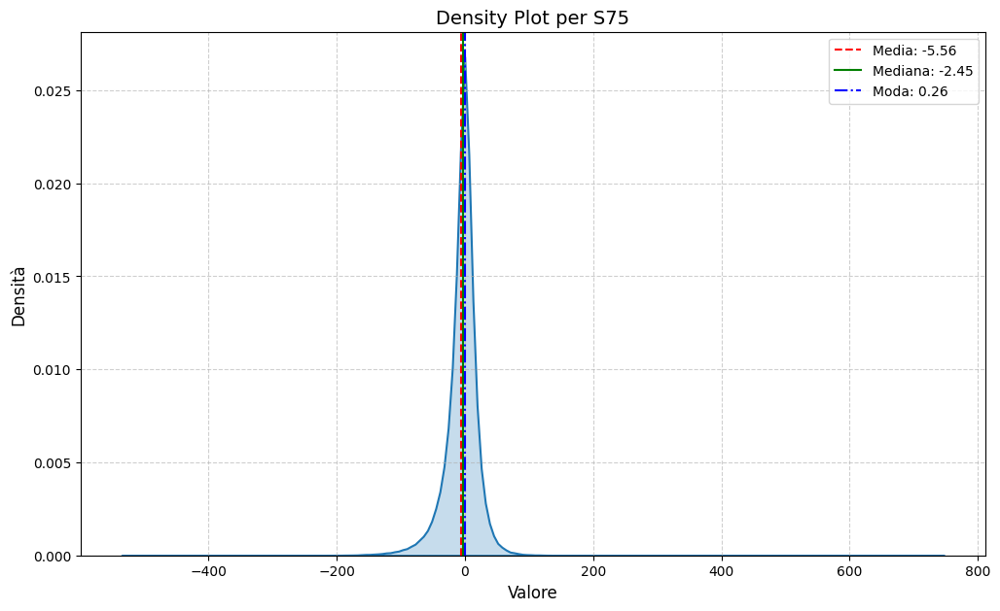

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


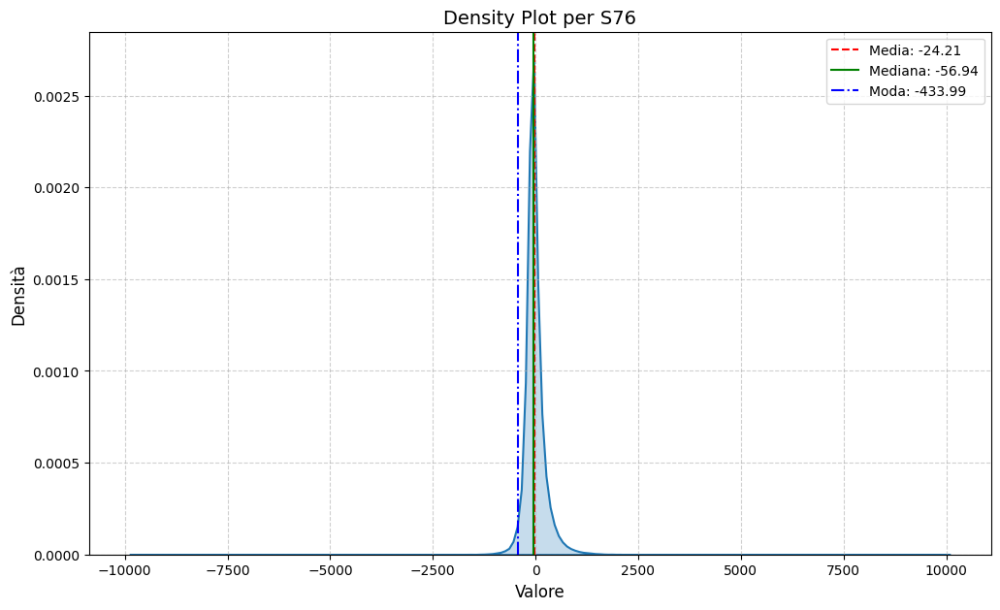

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


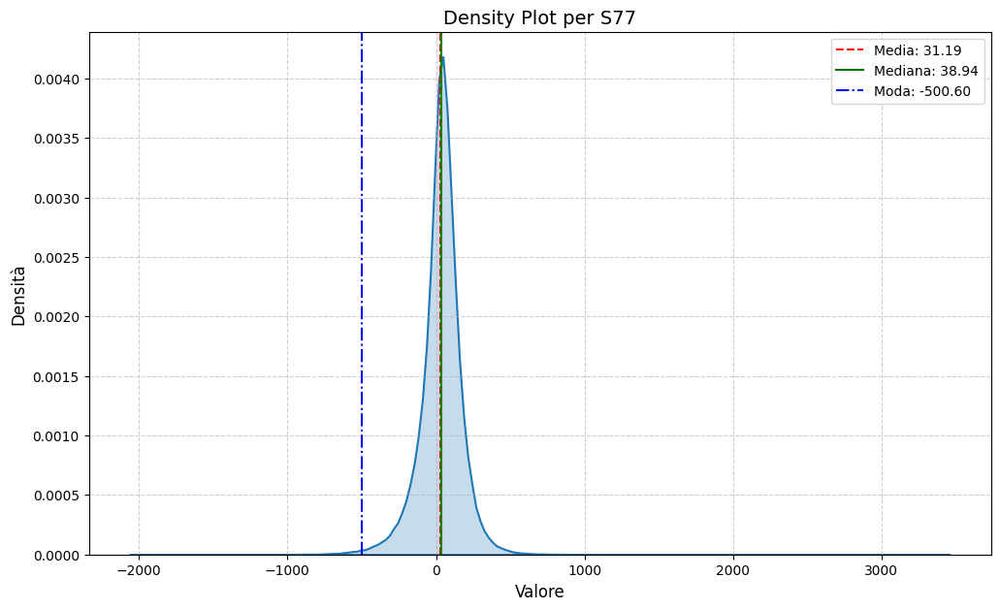

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


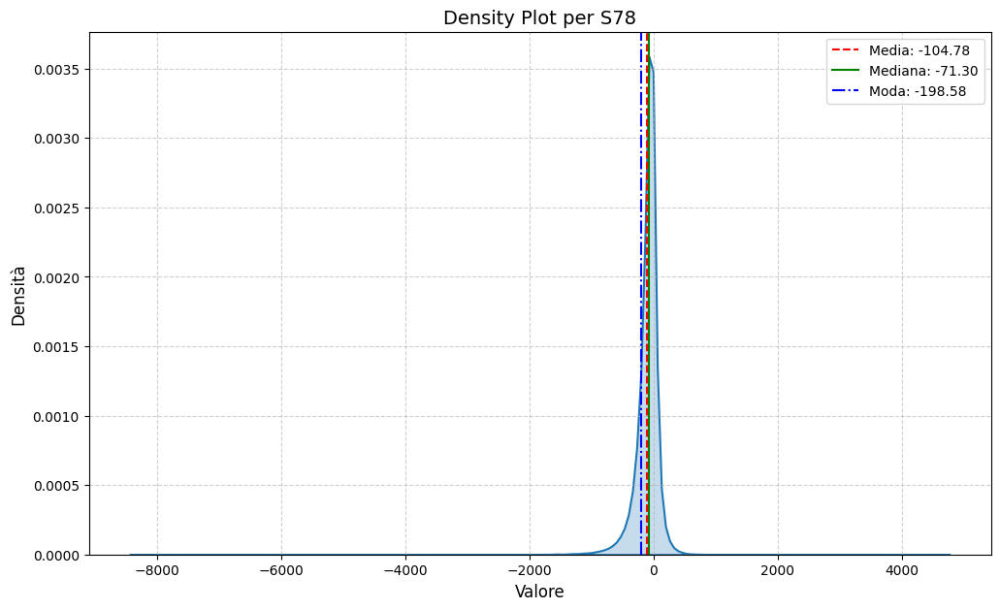

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


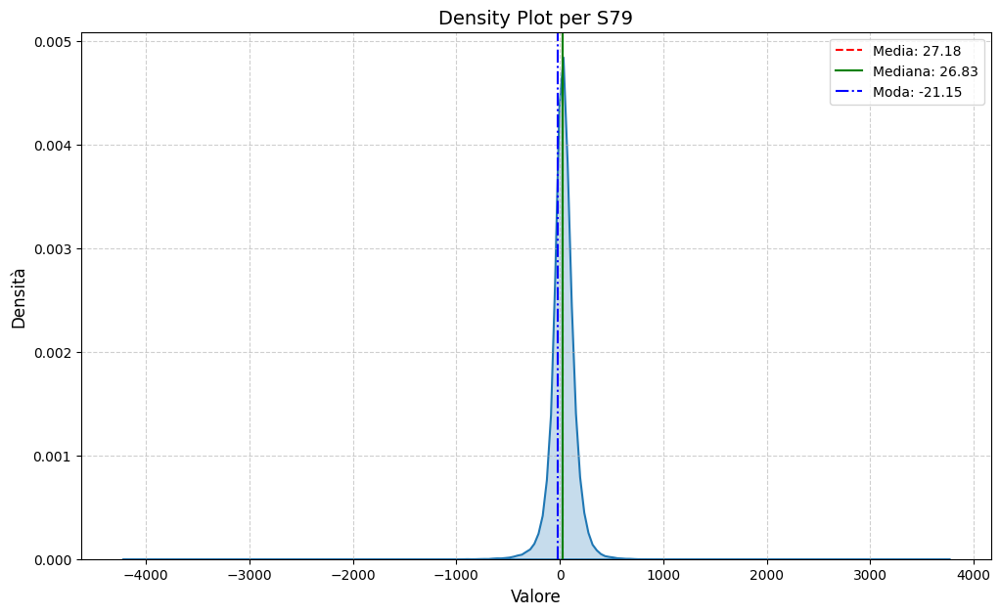

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


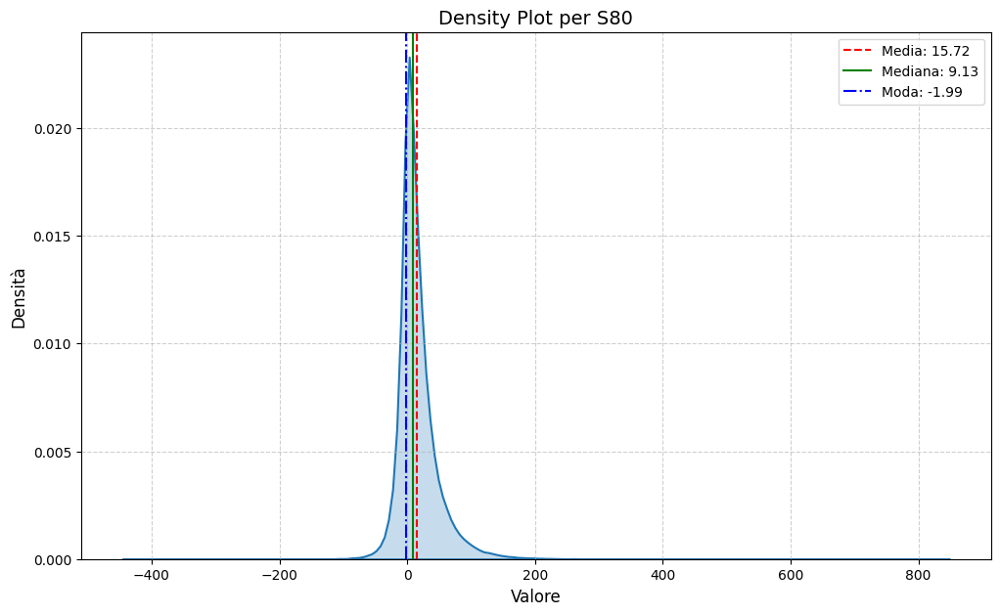

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


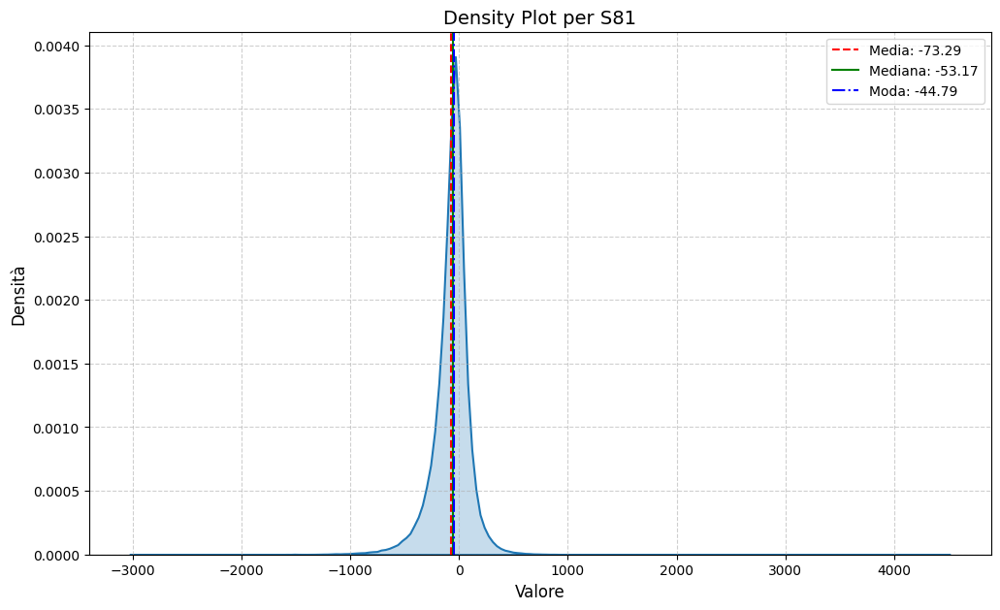

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


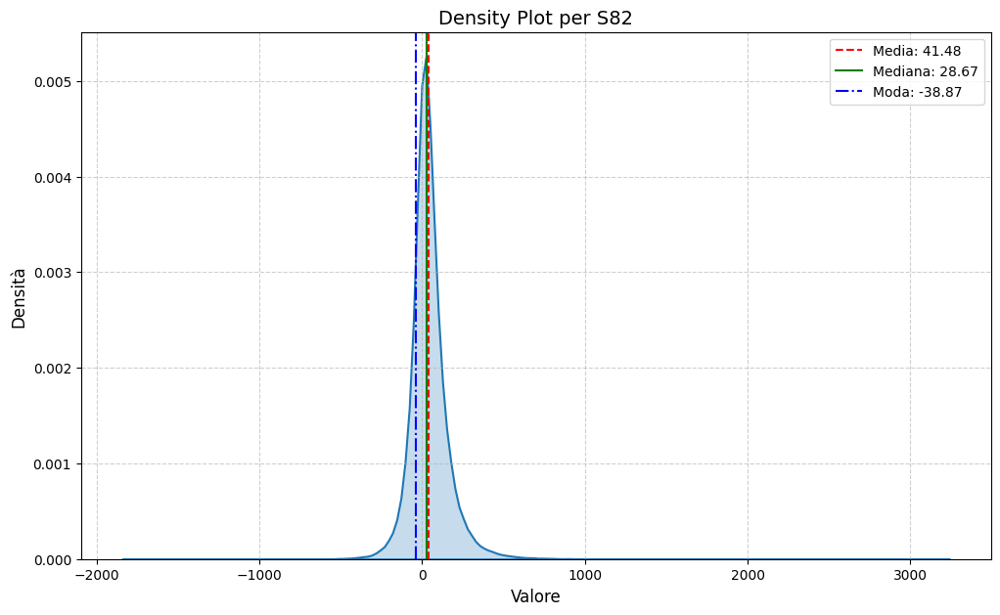

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


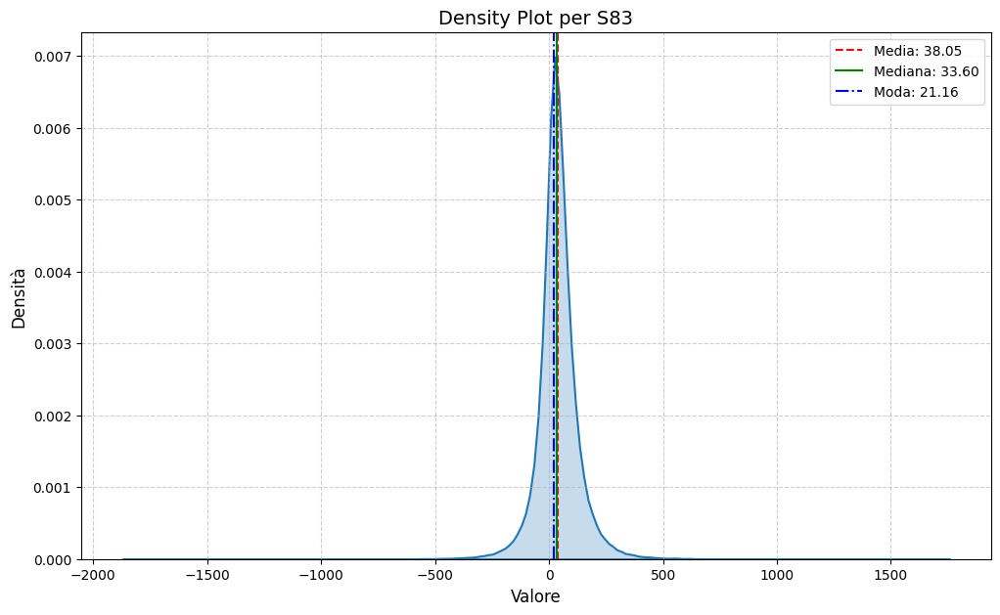

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


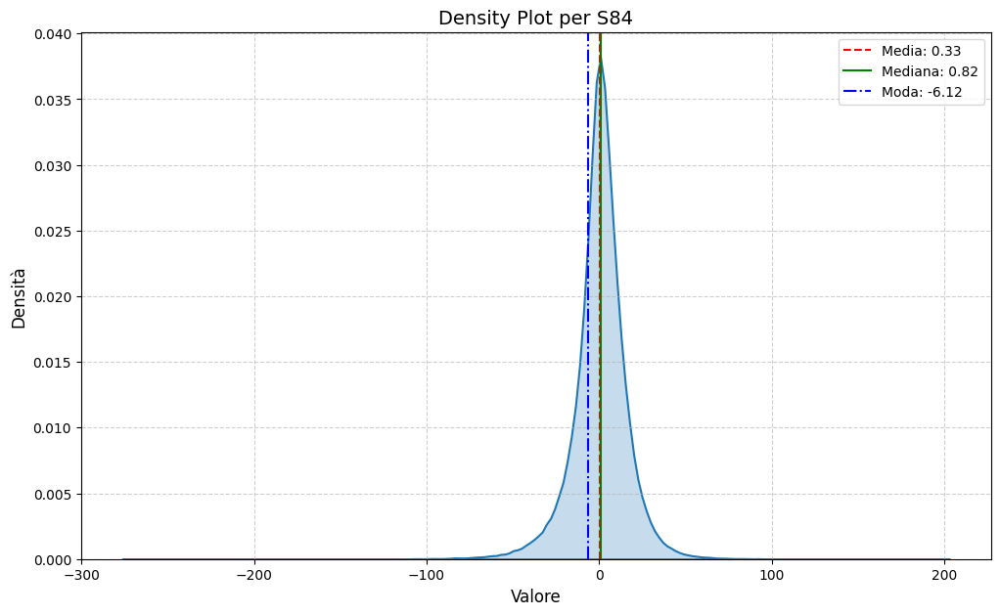

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


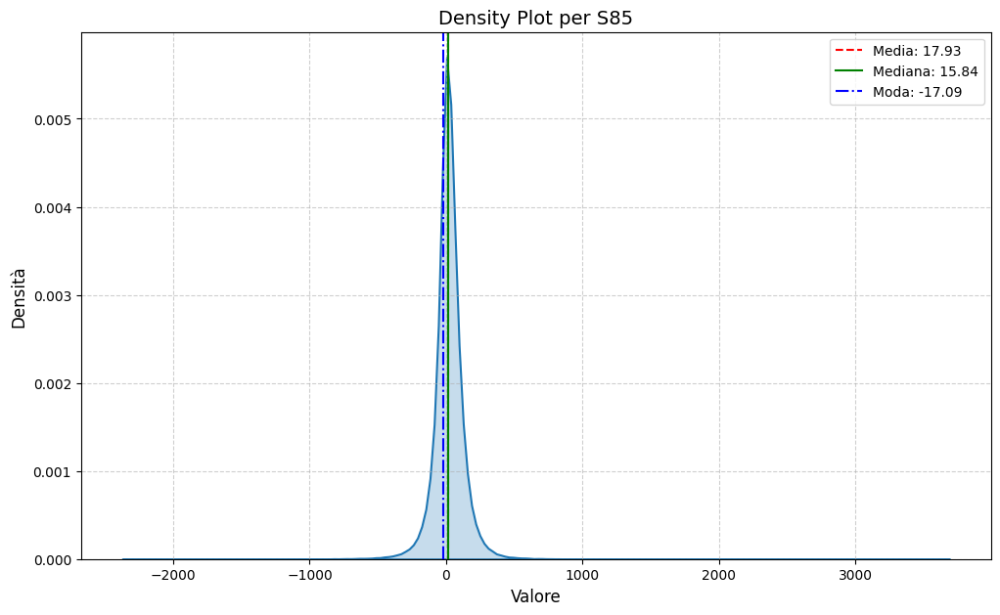

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


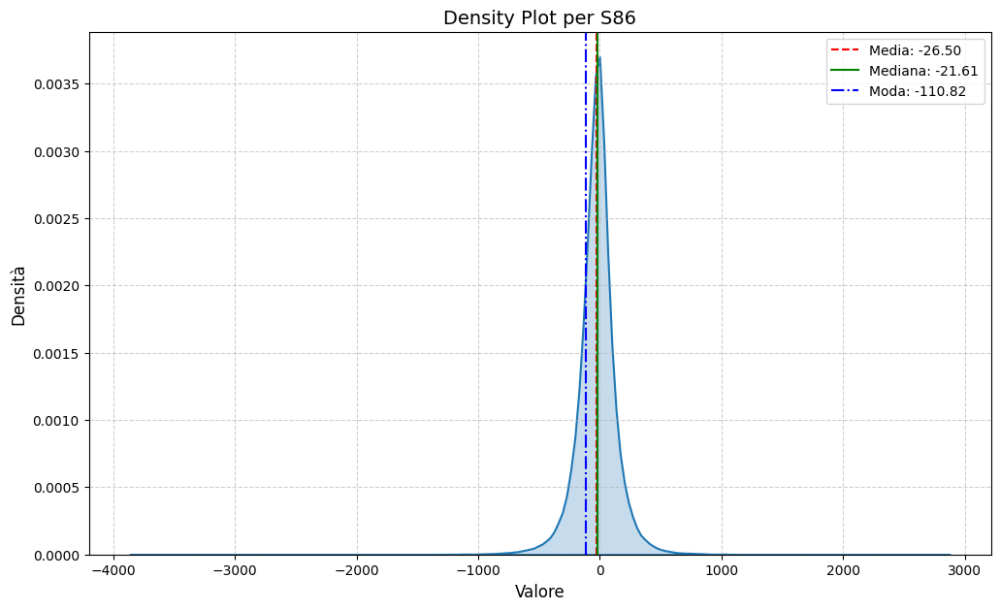

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


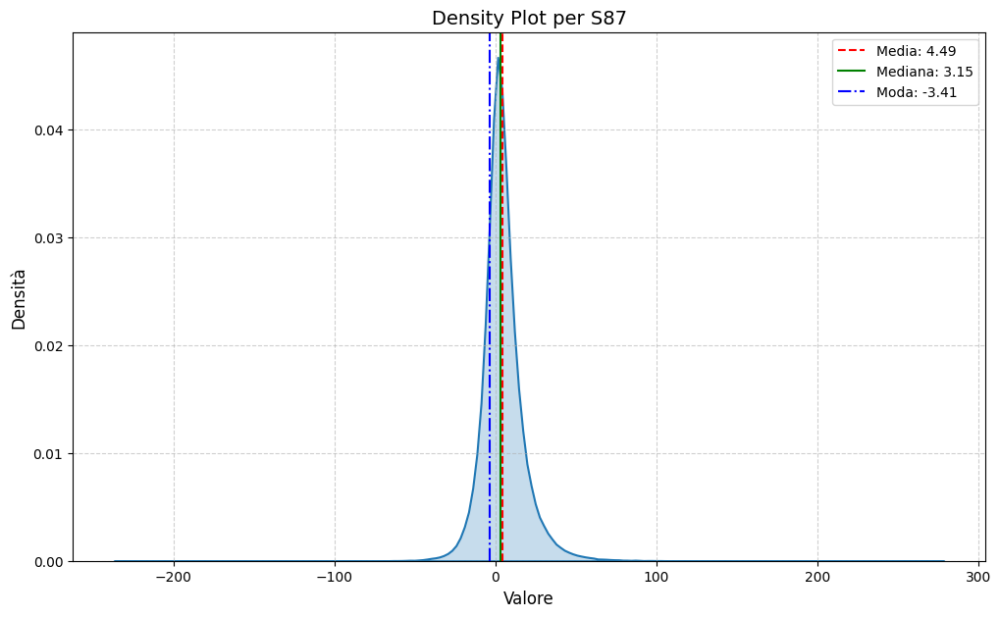

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


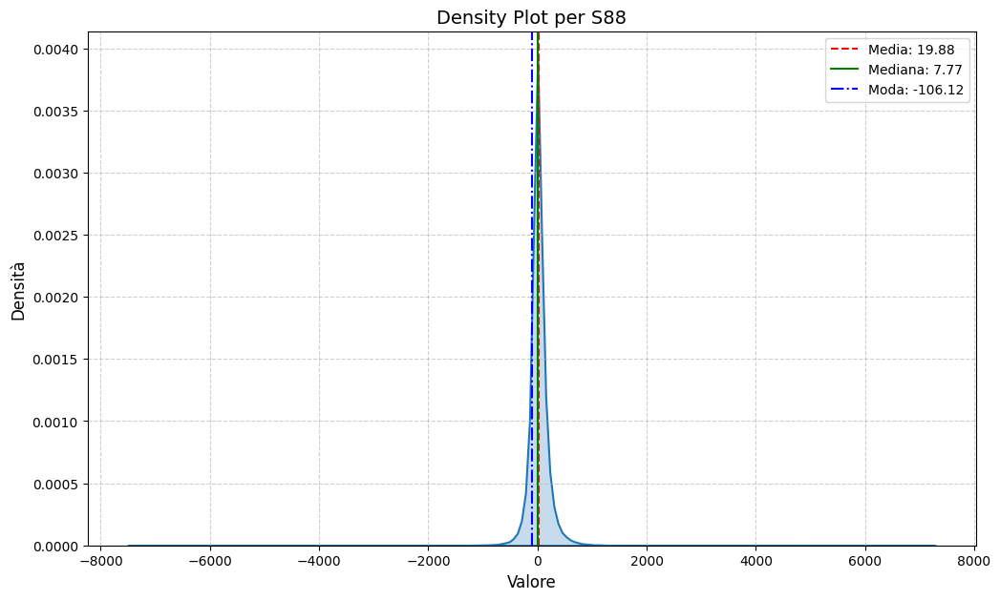

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/558034076.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)


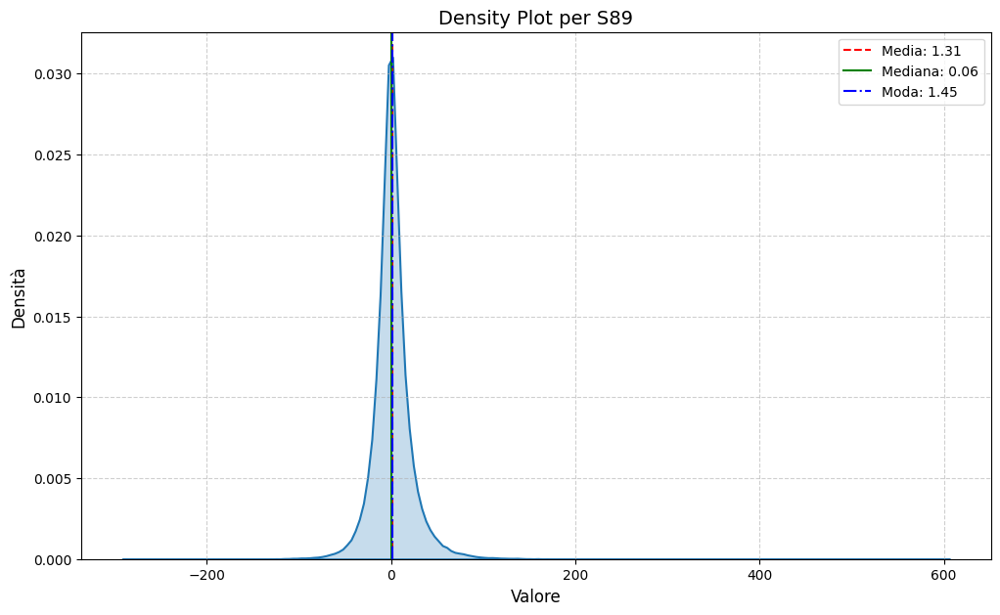

In [21]:
# Itera sulle colonne del dataFrame (tranne "Year" e "DecadeGroup")
for column in df.columns:
    if column not in ['Year', 'DecadeGroup']:
        plt.figure(figsize=(12, 7))

        # Traccia la curva di densità per la colonna senza aggiungere una label alla legenda
        sns.kdeplot(df[column], shade=True, fill=True, label=None, linewidth=1.5)

        # Calcola media, mediana e moda
        mean = df[column].mean()
        median = df[column].median()
        mode = df[column].mode()[0]

        # Aggiungi linee verticali per media, mediana e moda
        plt.axvline(mean, color='red', linestyle='--', linewidth=1.5, label=f'Media: {mean:.2f}')
        plt.axvline(median, color='green', linestyle='-', linewidth=1.5, label=f'Mediana: {median:.2f}')
        plt.axvline(mode, color='blue', linestyle='-.', linewidth=1.5, label=f'Moda: {mode:.2f}')

        # Configura il grafico
        plt.title(f'Density Plot per {column}', fontsize=14)
        plt.xlabel('Valore', fontsize=12)
        plt.ylabel('Densità', fontsize=12)
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.6)
        plt.show()

### Boxplot

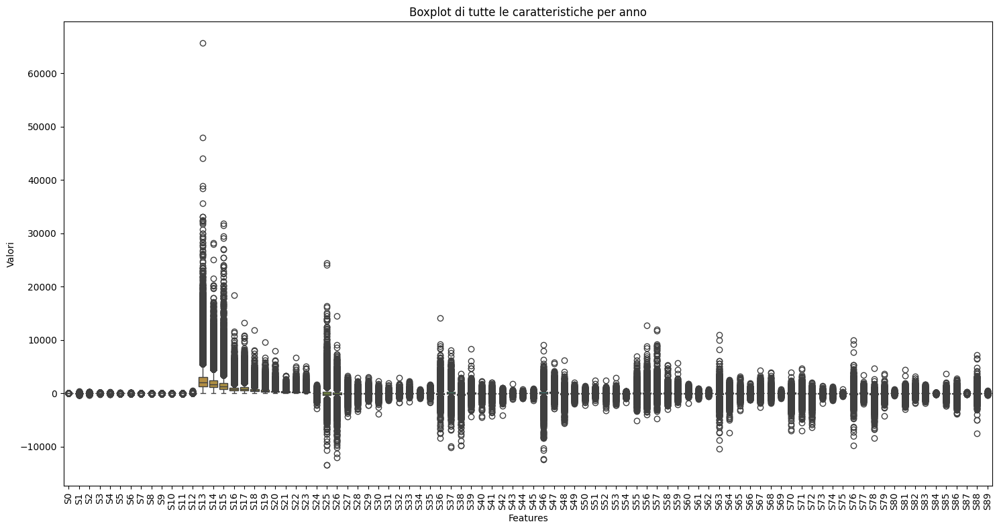

In [9]:
# Boxplot per ogni feature, raggruppando per anno
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.drop(columns=['Year', 'DecadeGroup']), orient='v')  # boxplot verticale
plt.xticks(rotation=90) 
plt.xlabel('Features')
plt.ylabel('Valori')
plt.title('Boxplot di tutte le caratteristiche per anno')
plt.tight_layout()
plt.show()

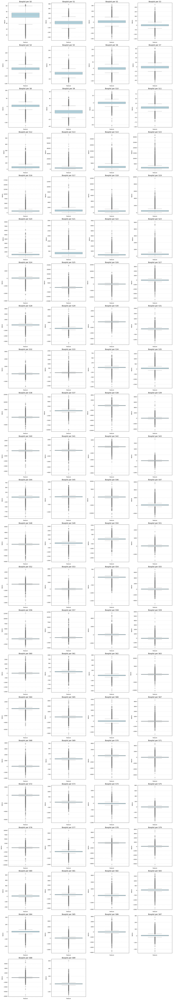

In [25]:
# Filtra le colonne di interesse
features = [column for column in df.columns if column not in ['Year', 'DecadeGroup']]

# Numero di boxplot per riga
ncols = 4
nrows = int(np.ceil(len(features) / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 5 * nrows))

axes = axes.flatten()

for i, column in enumerate(features):
    sns.boxplot(y=df[column], color='lightblue', ax=axes[i])
    axes[i].set_title(f'Boxplot per {column}', fontsize=14)
    axes[i].set_xlabel('Feature')
    axes[i].set_ylabel('Valore')
    axes[i].grid(True, linestyle='--', alpha=0.6)

for j in range(len(features), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

### Outliers

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/3879996075.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/Users/martinadaghia/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


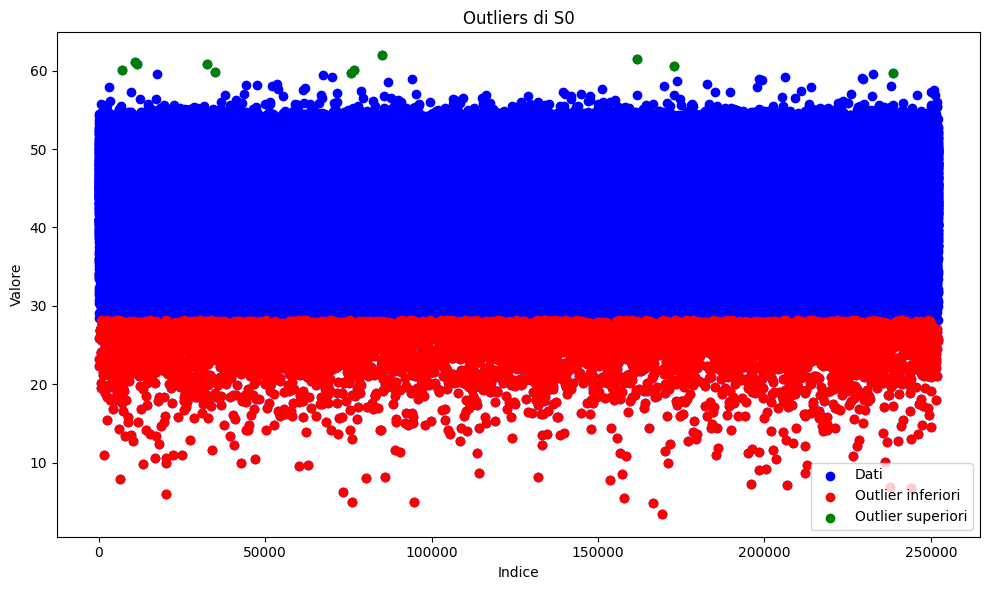

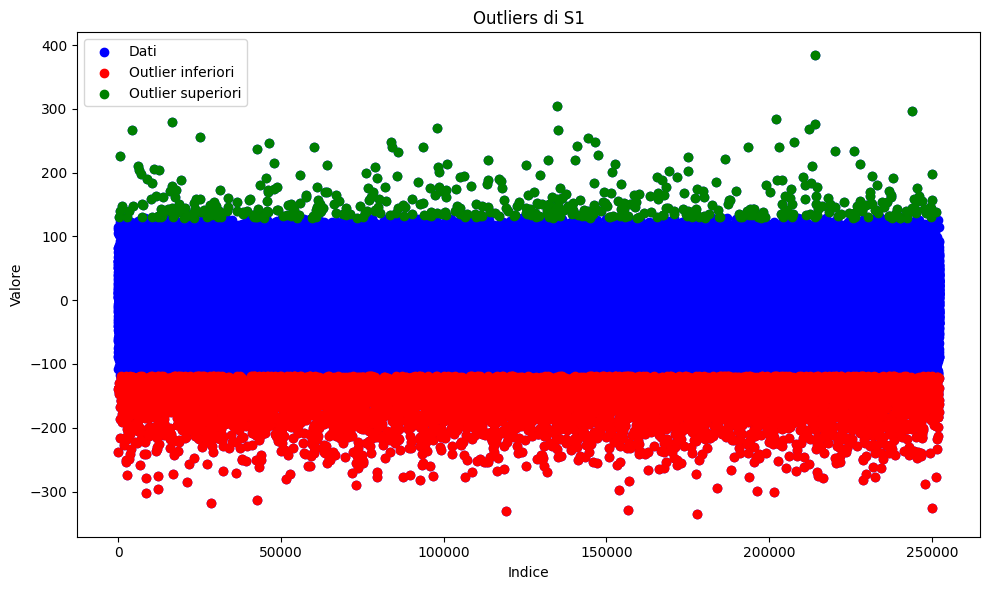

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/3879996075.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


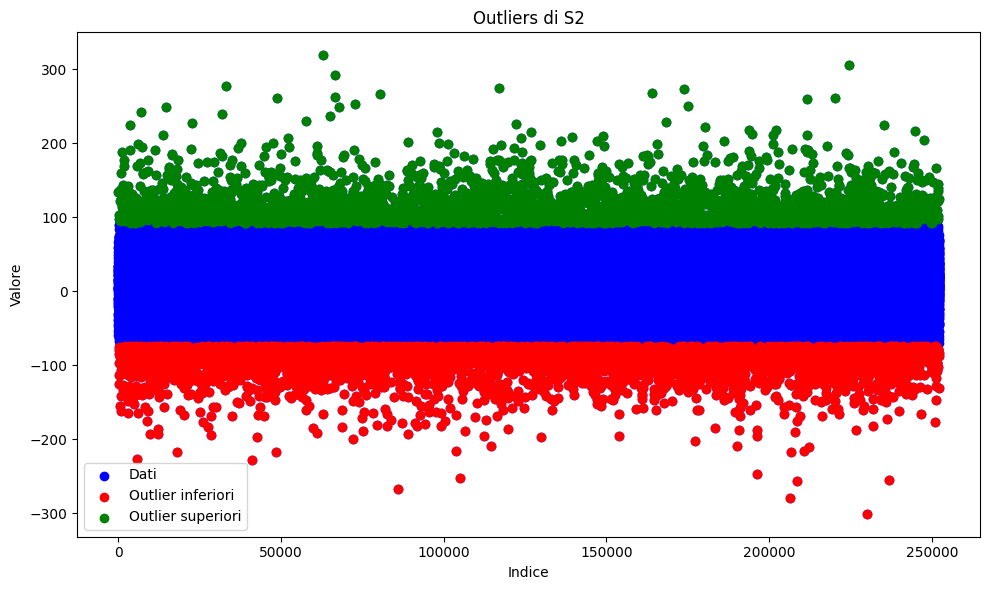

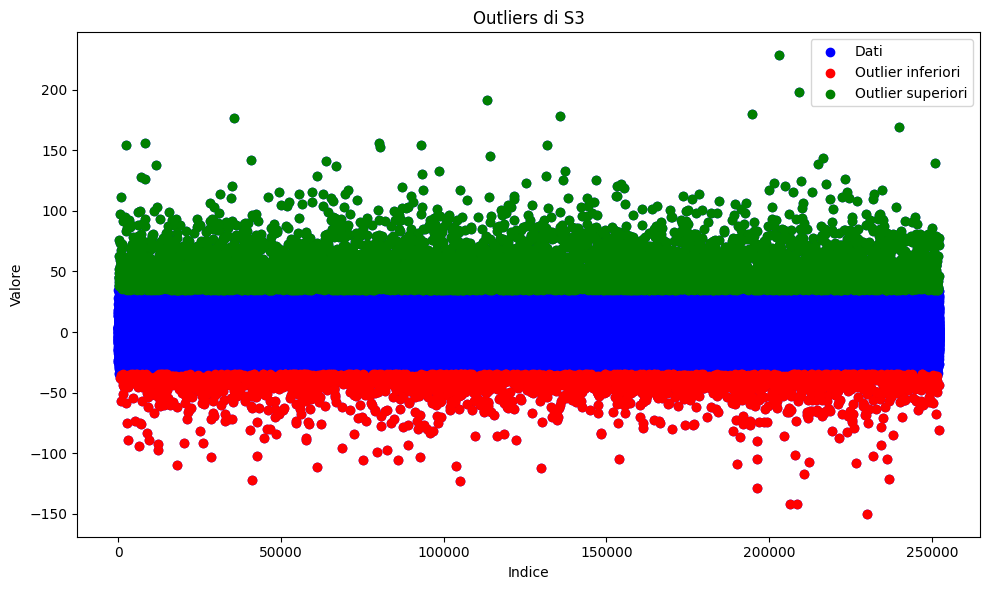

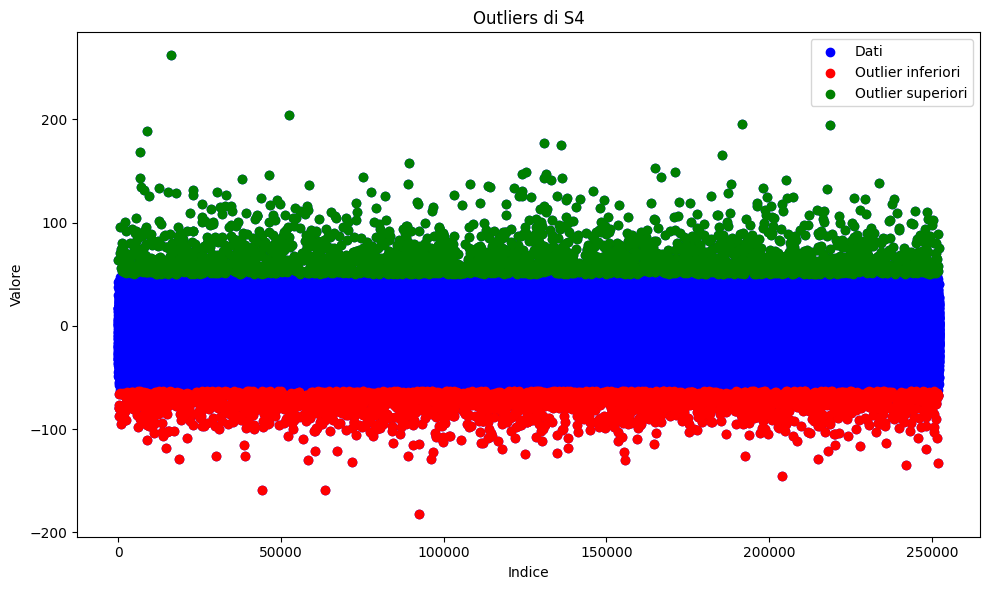

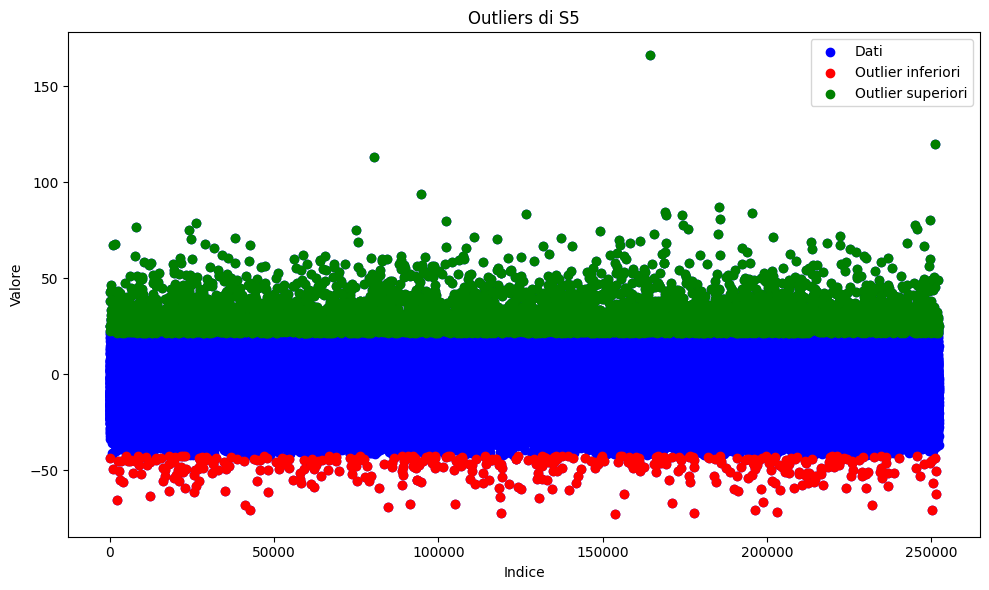

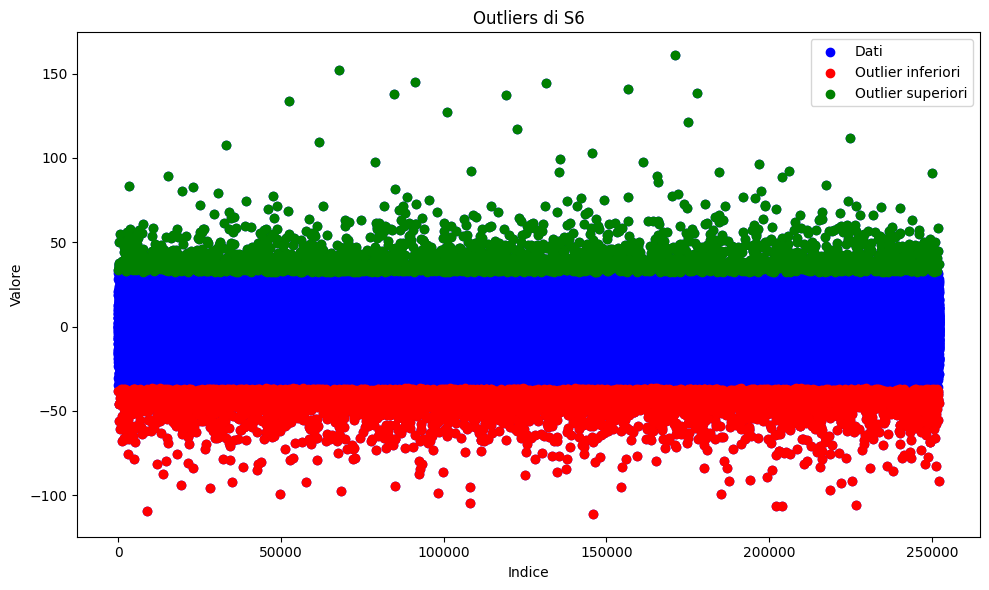

...

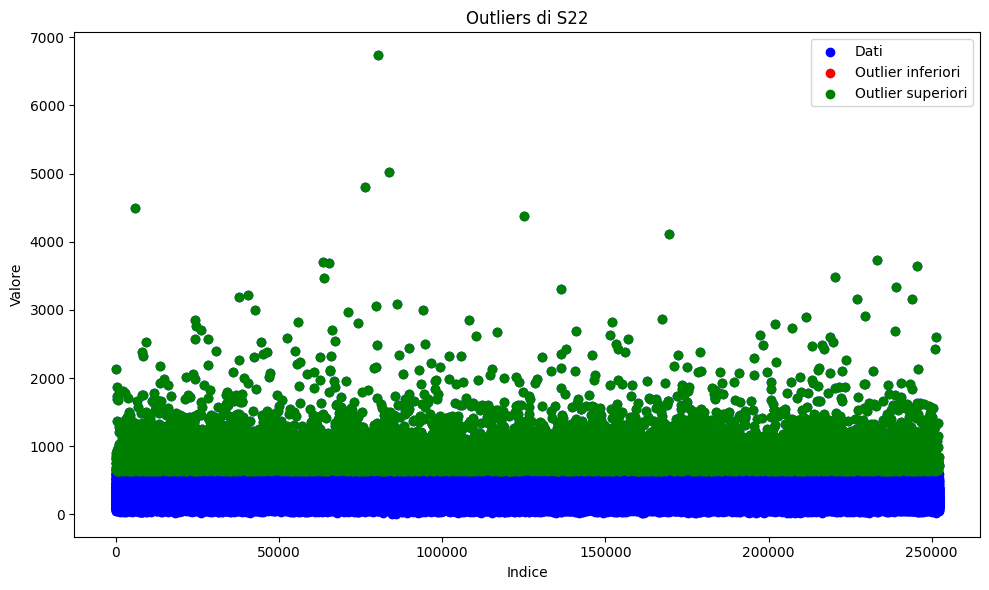

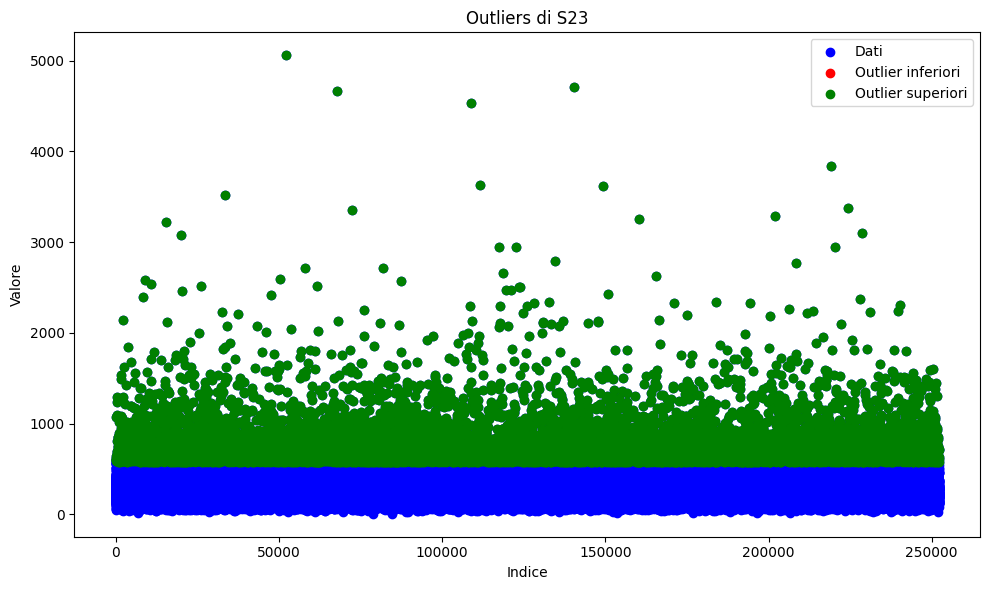

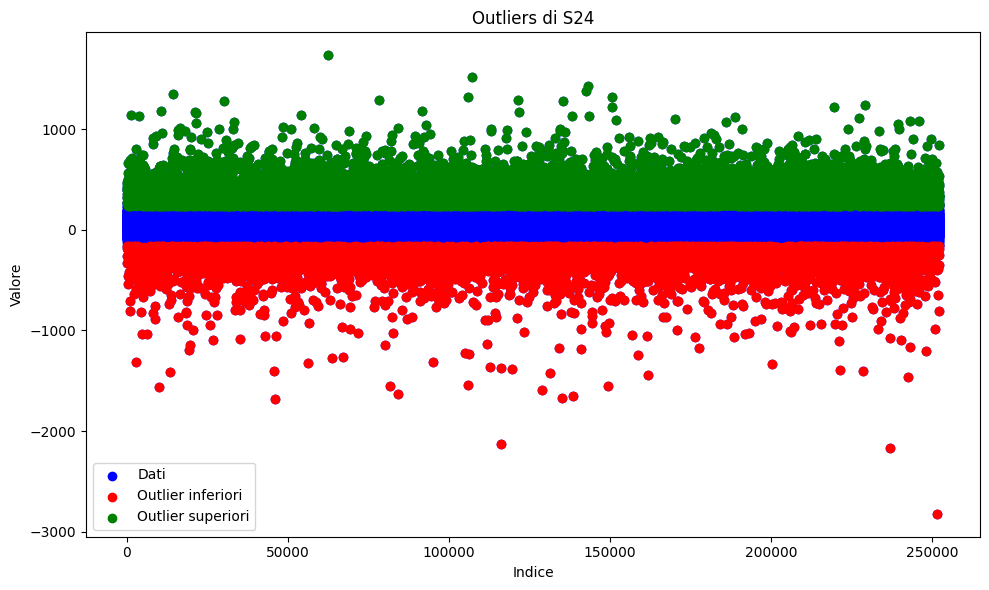

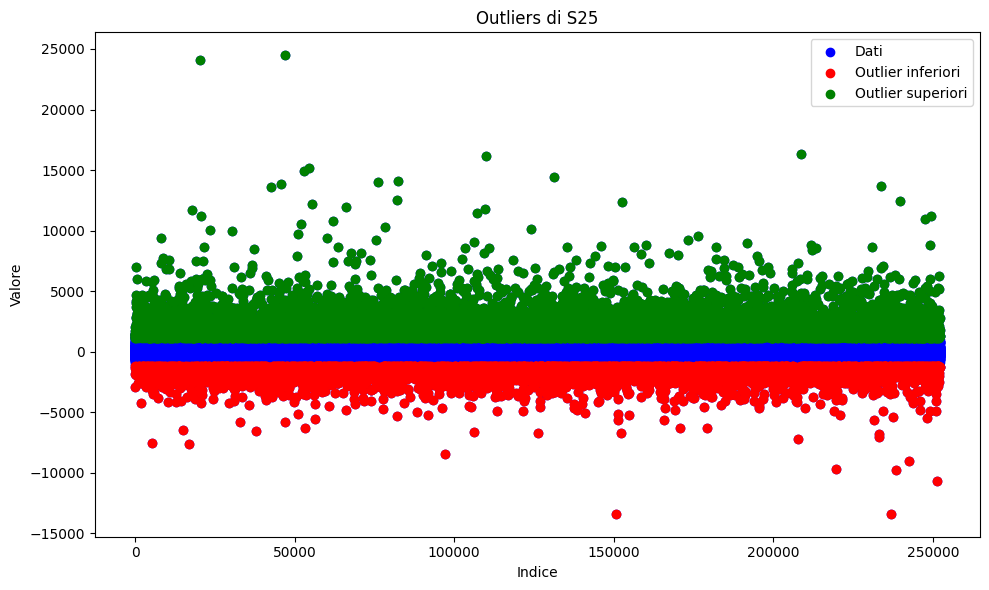

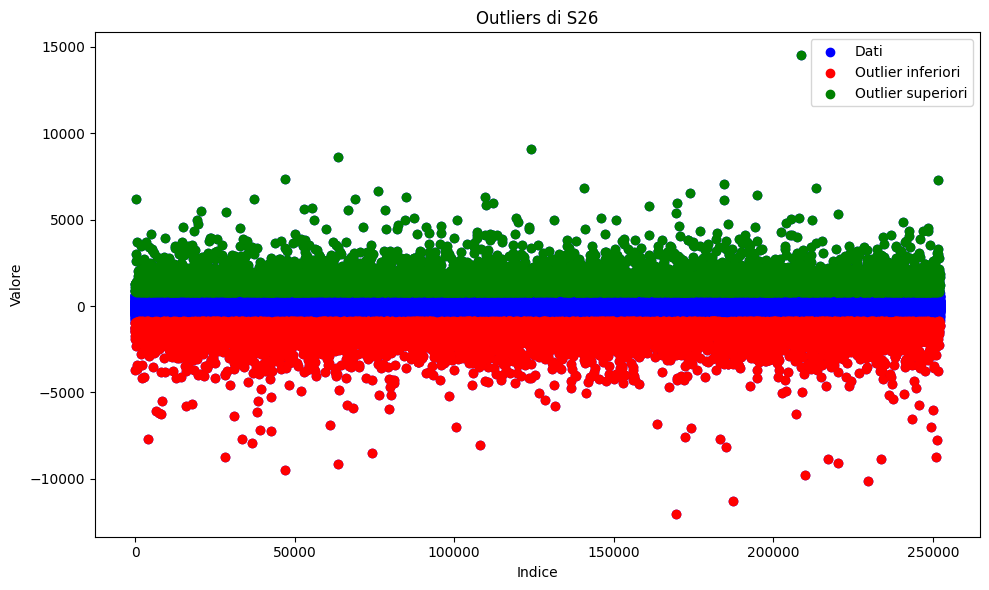

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/3879996075.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


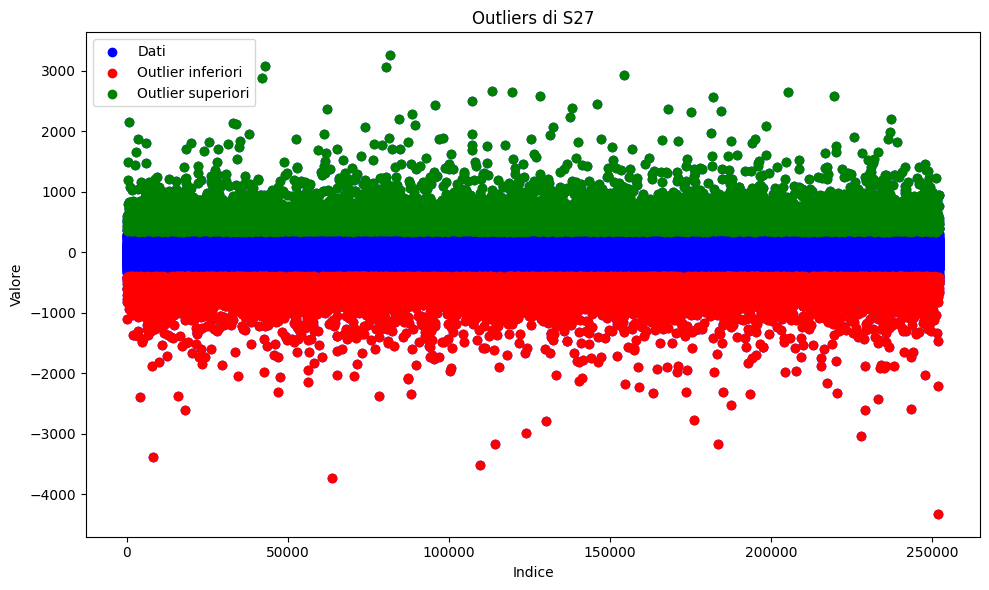

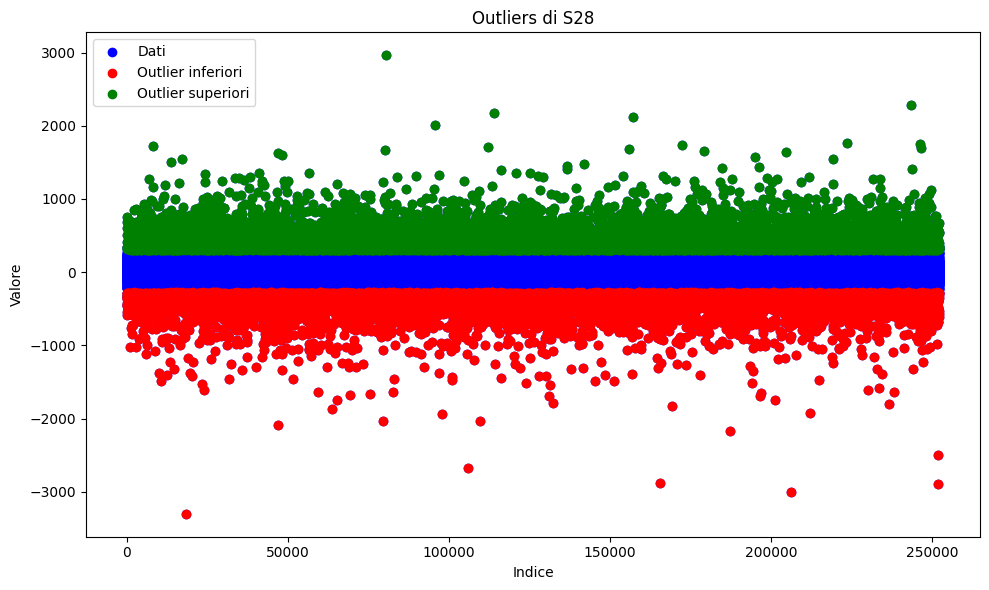

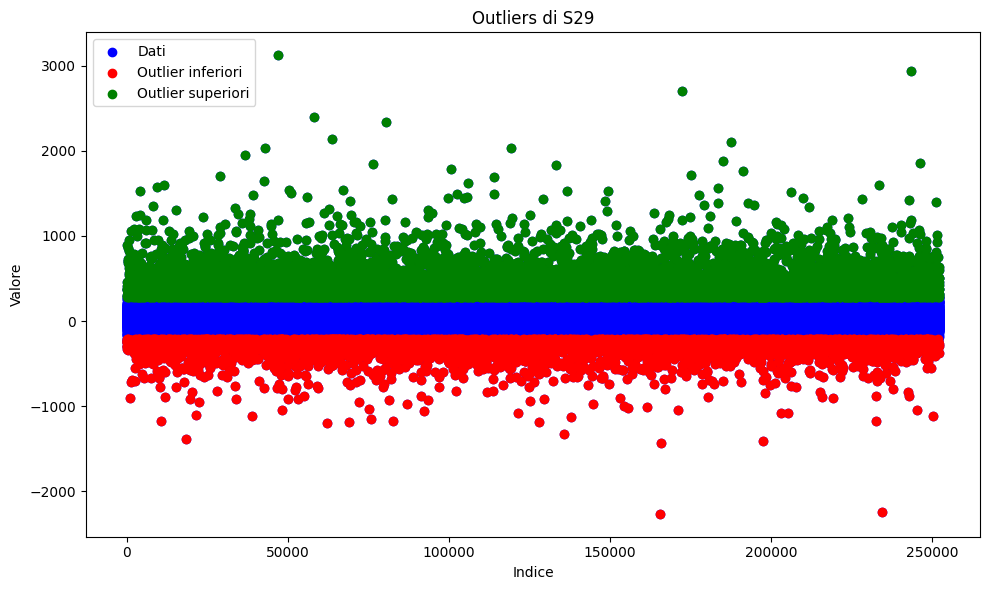

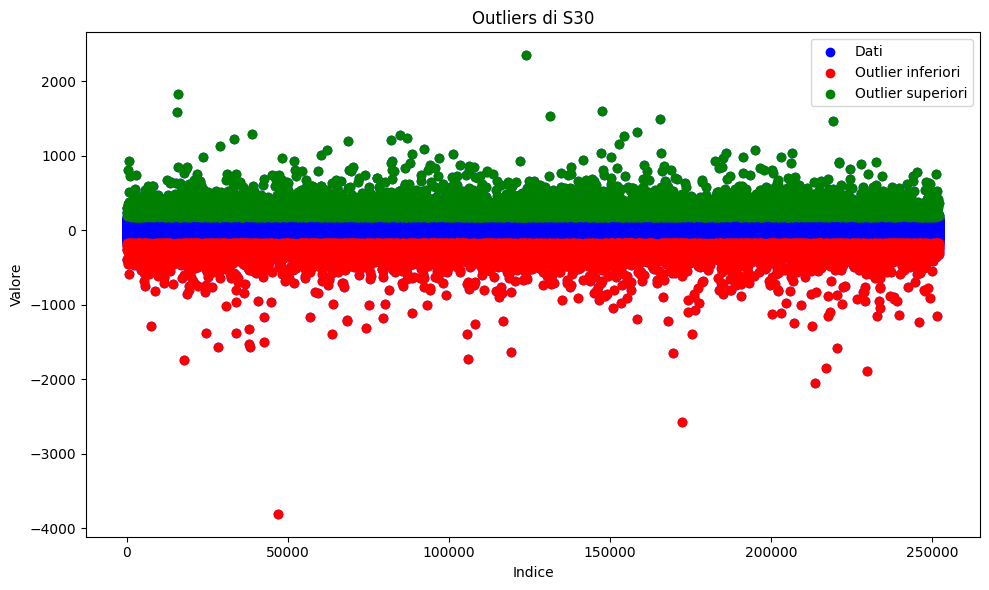

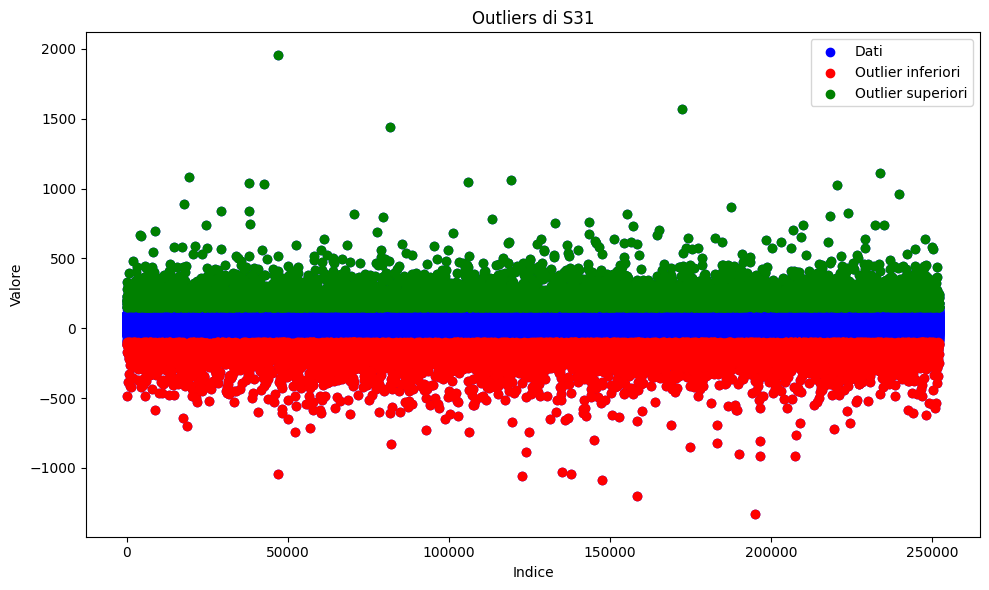

...

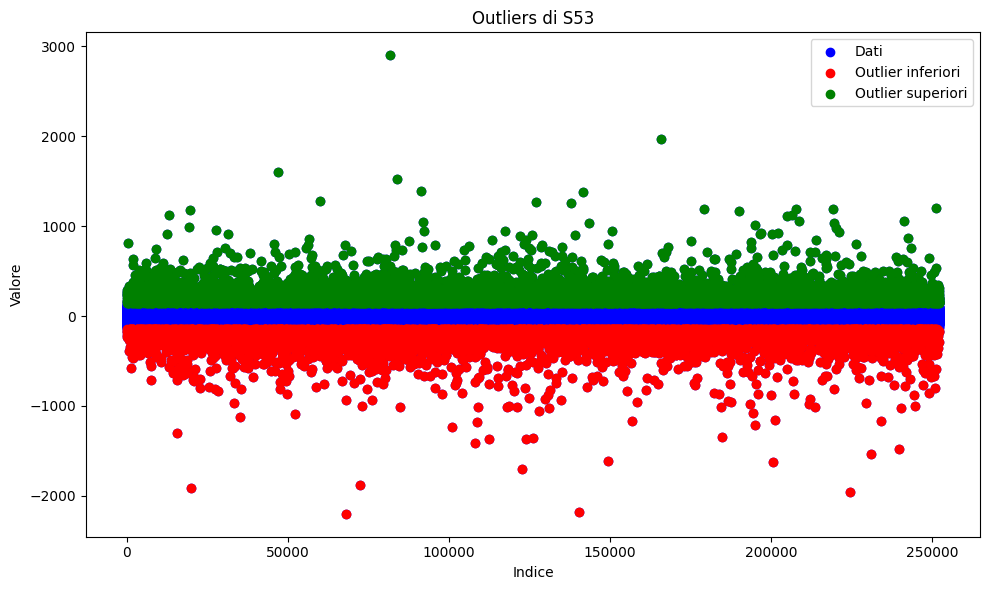

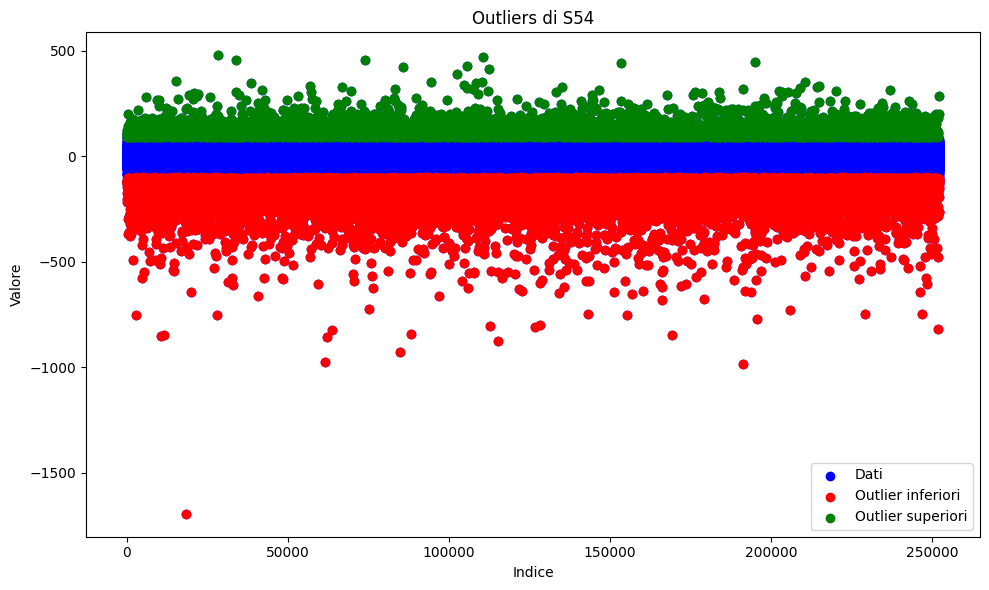

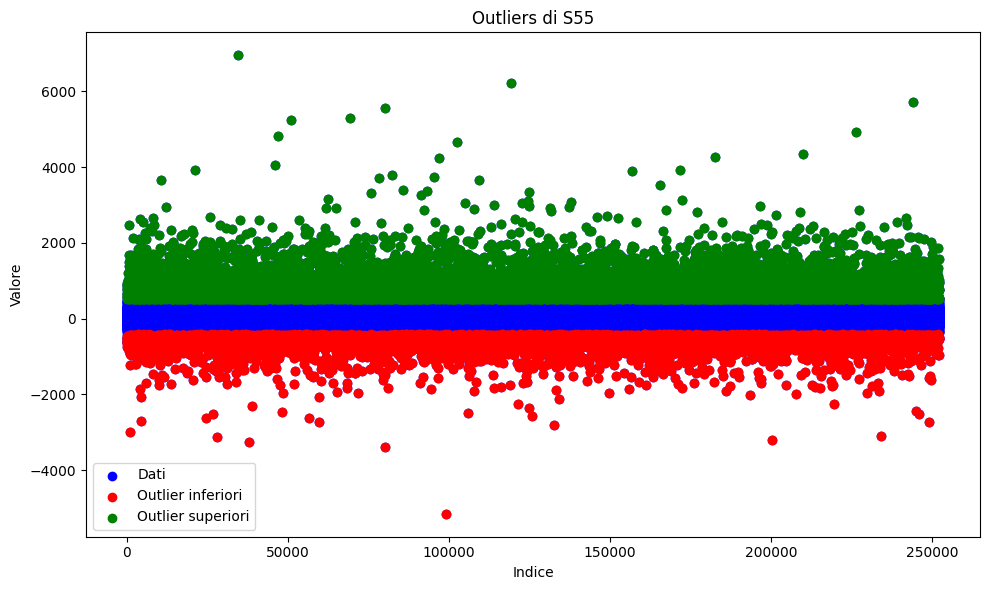

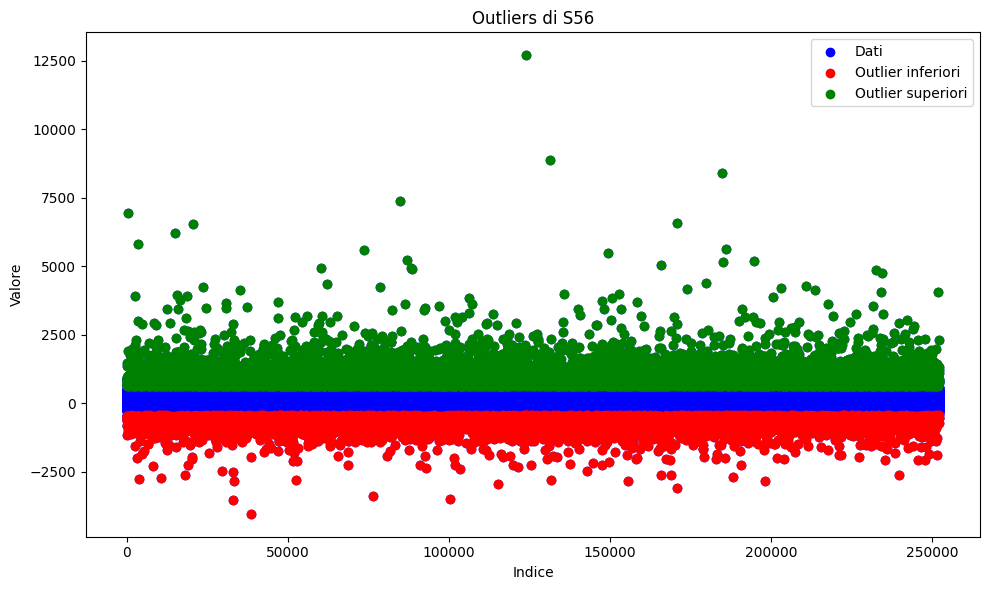

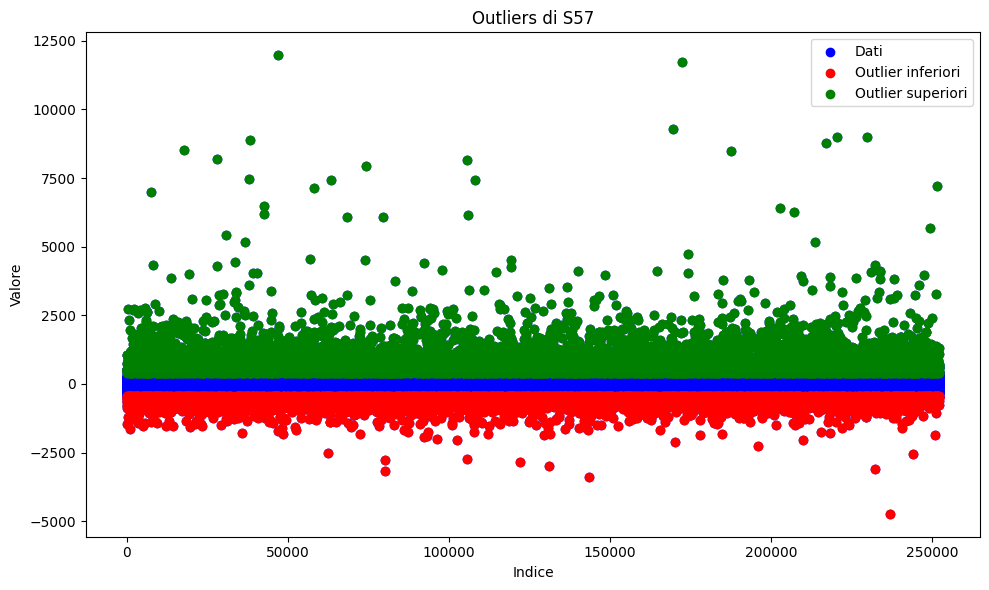

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/3879996075.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


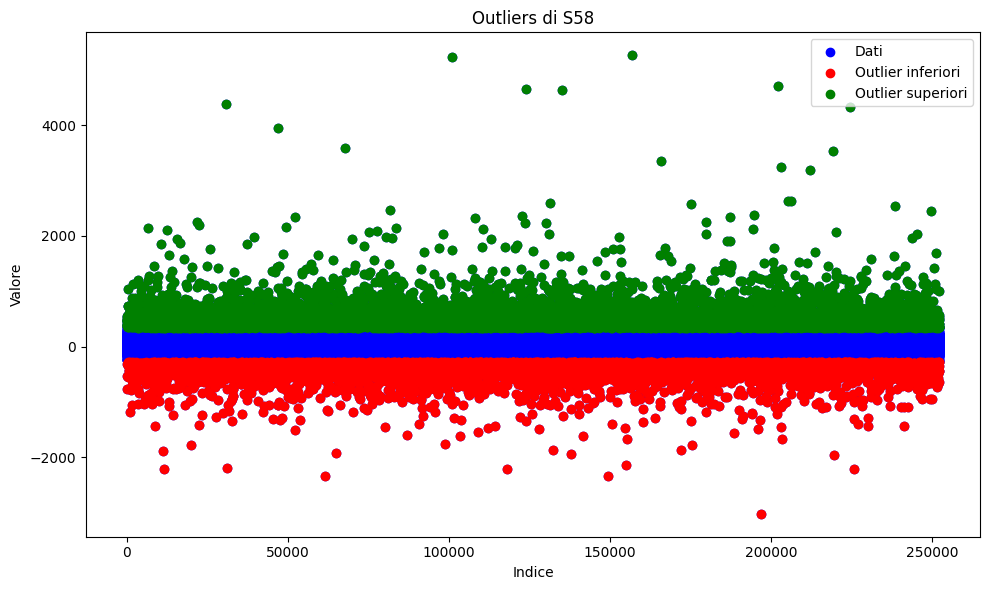

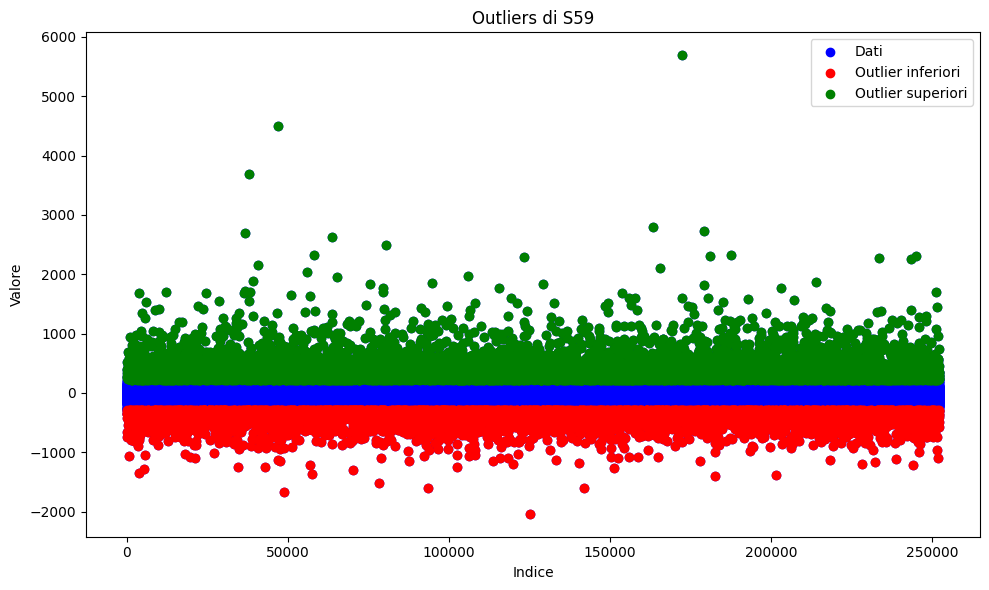

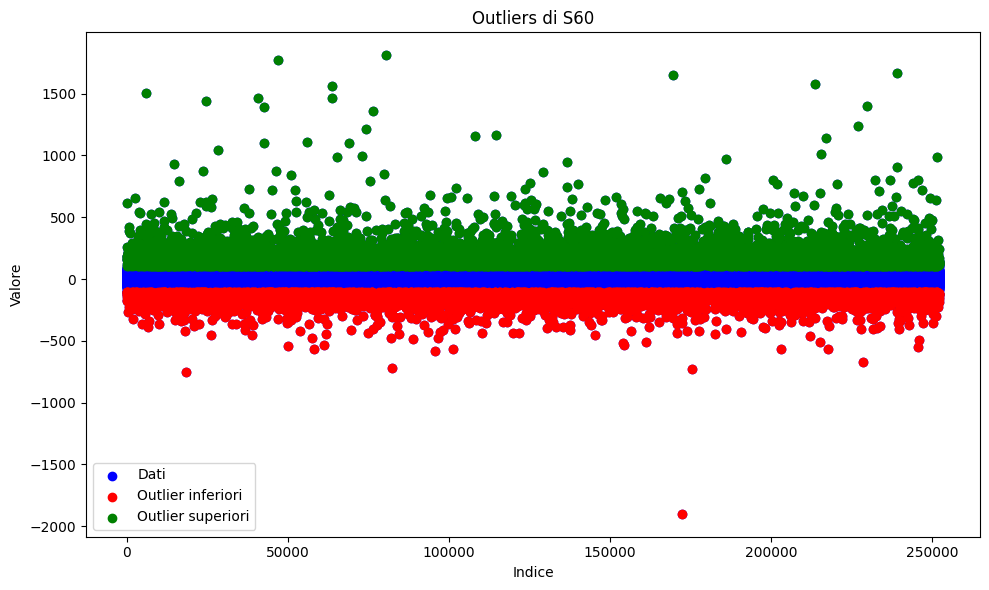

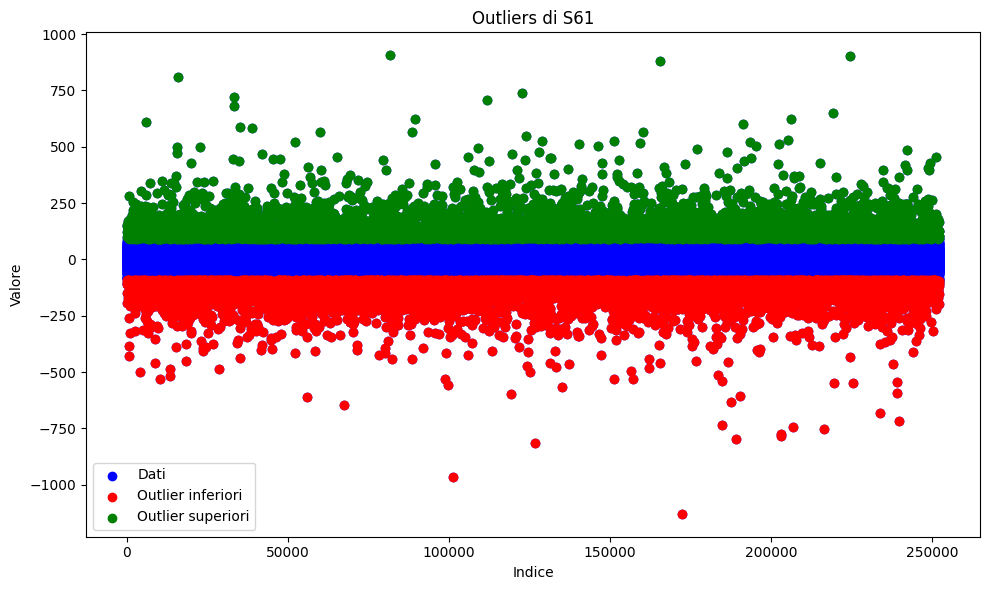

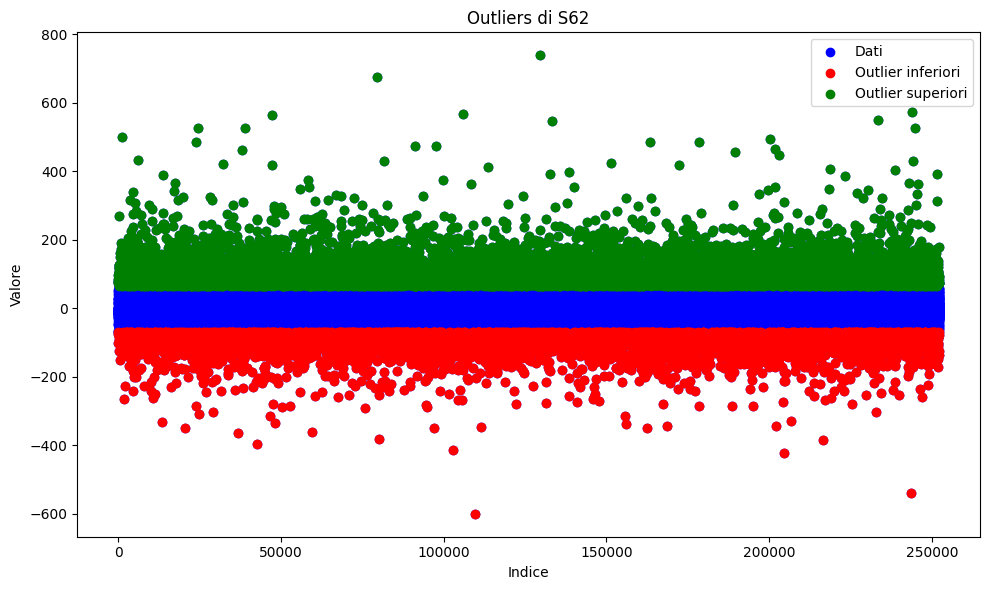

...

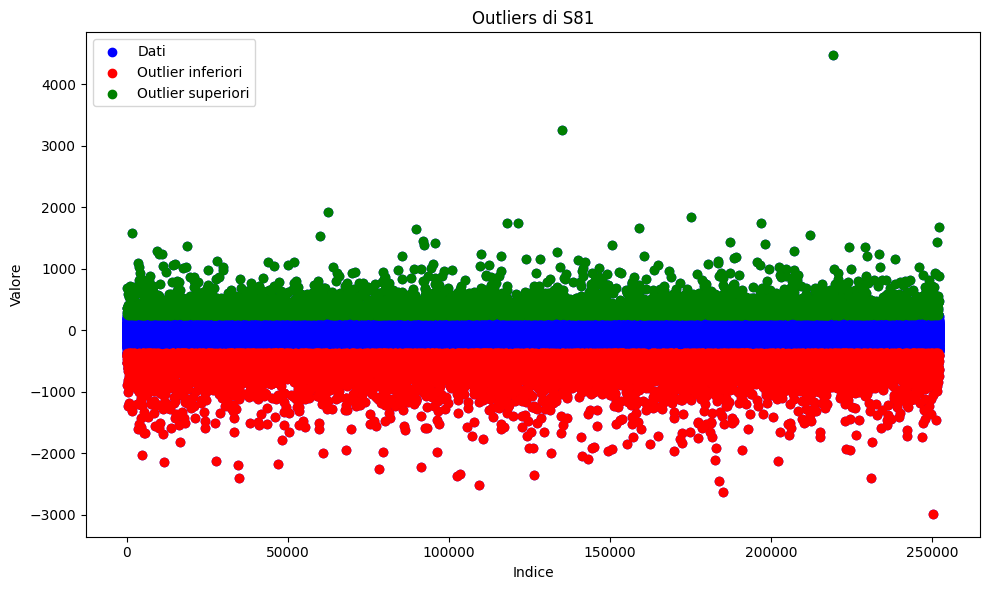

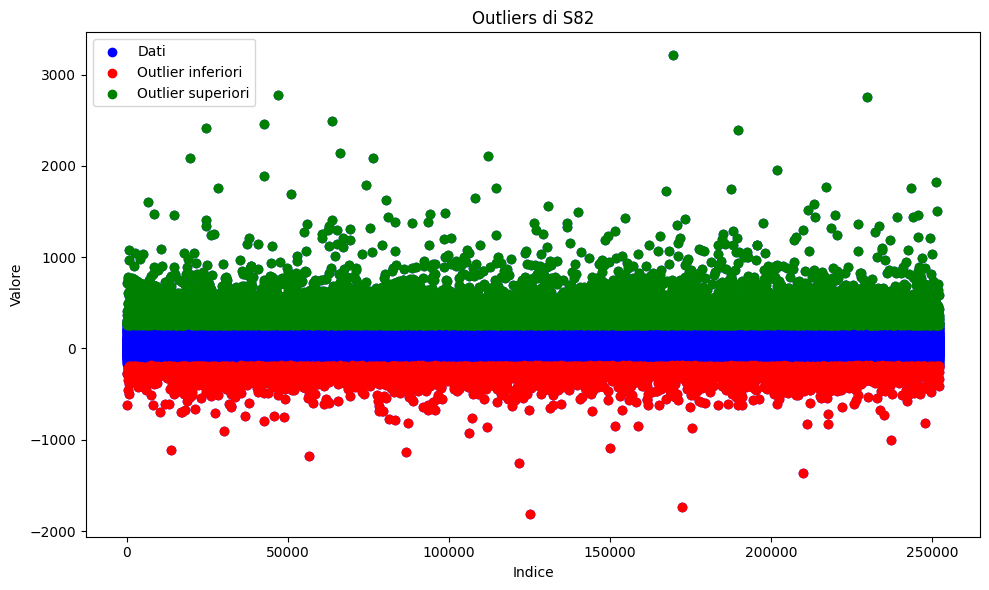

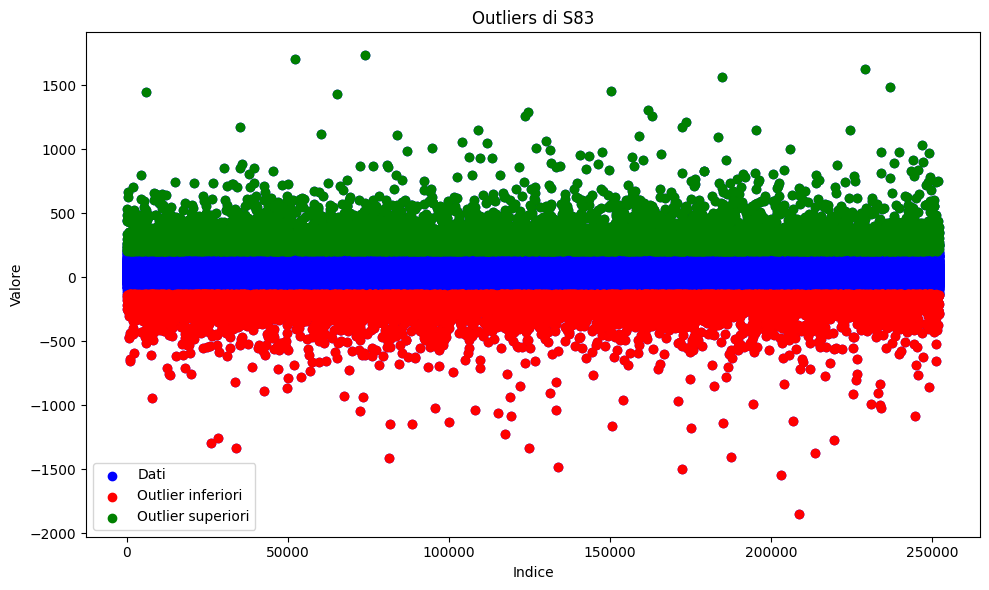

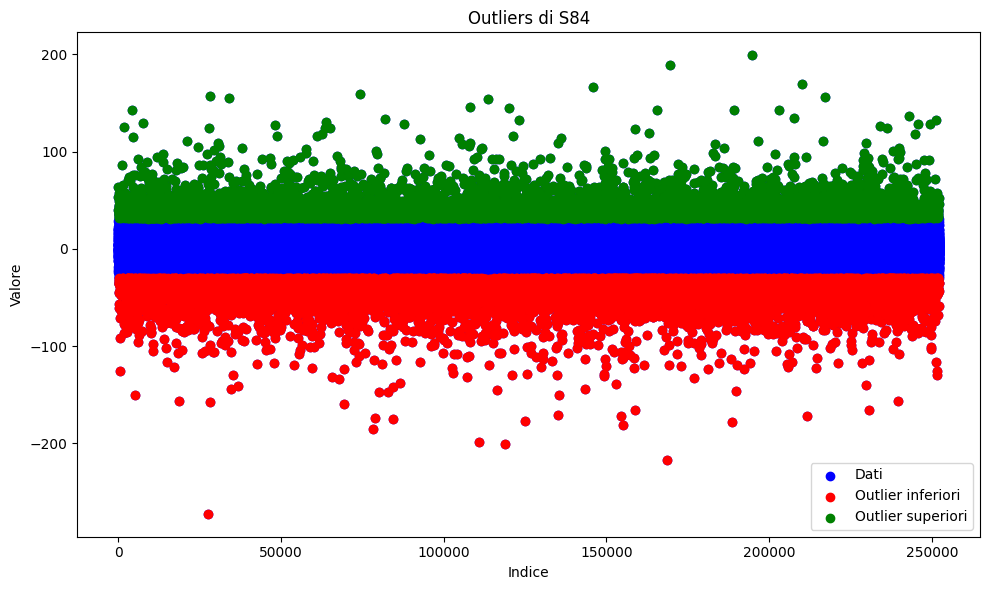

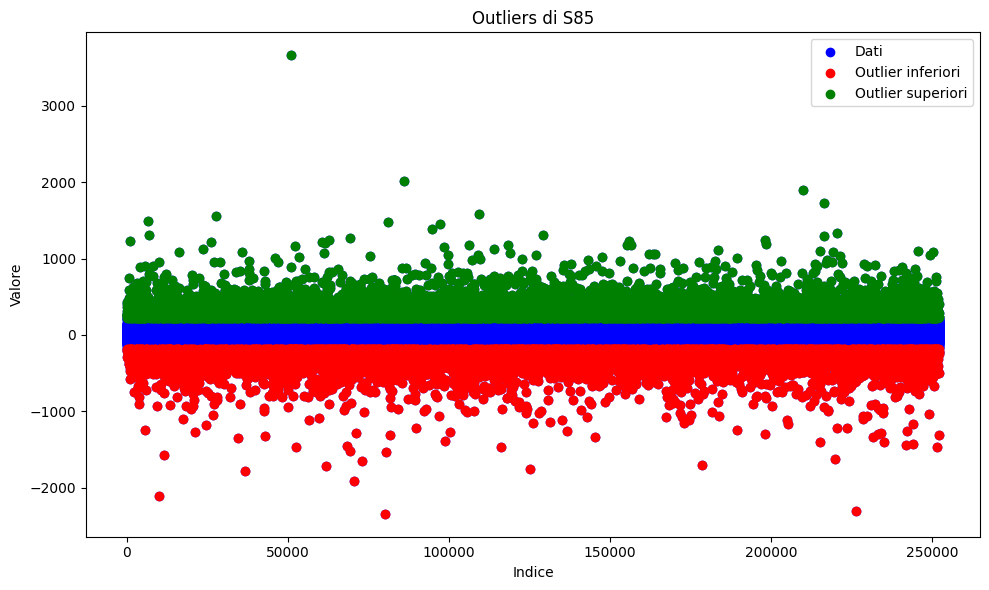

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_1669/3879996075.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


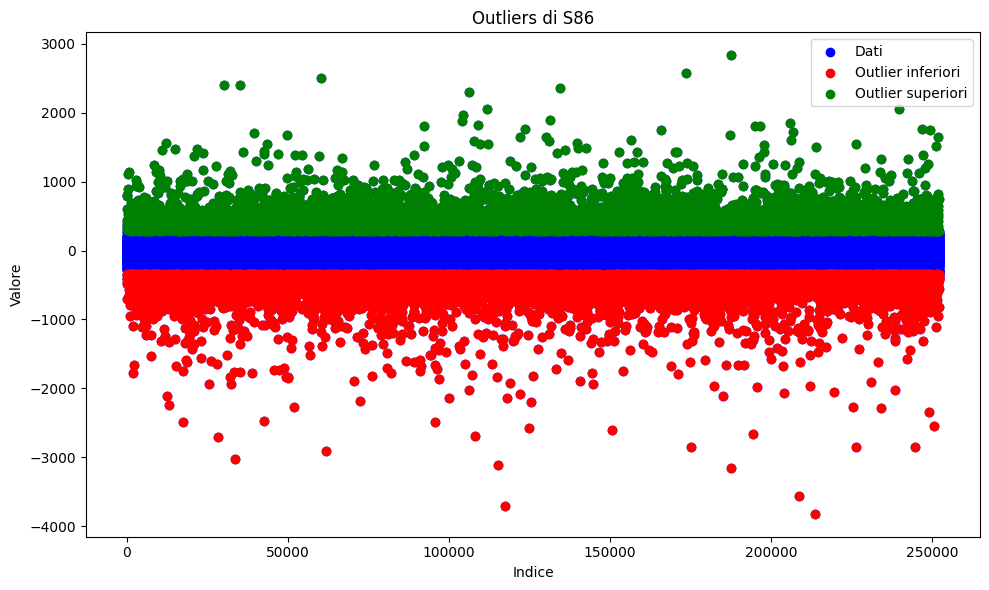

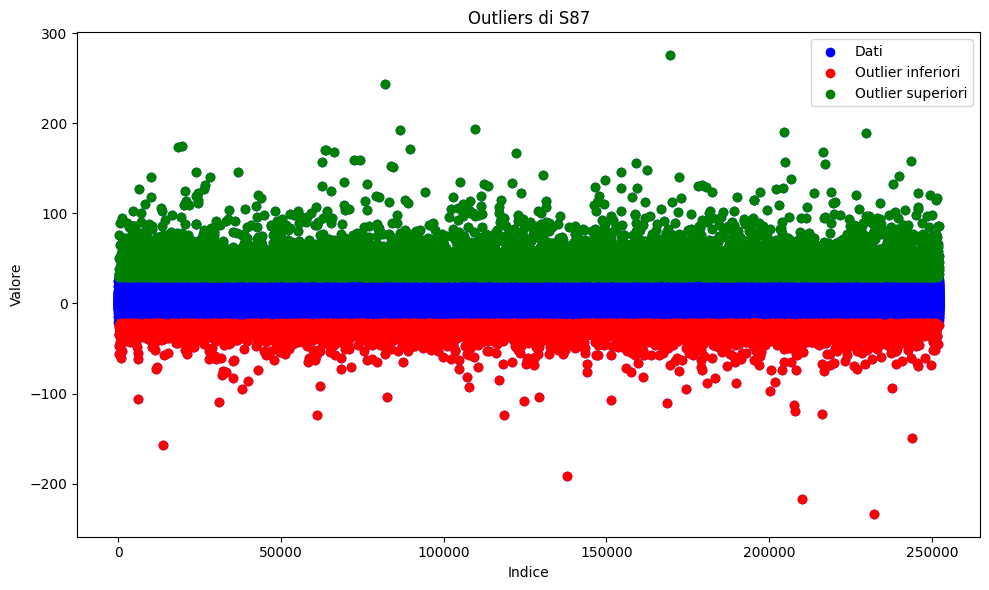

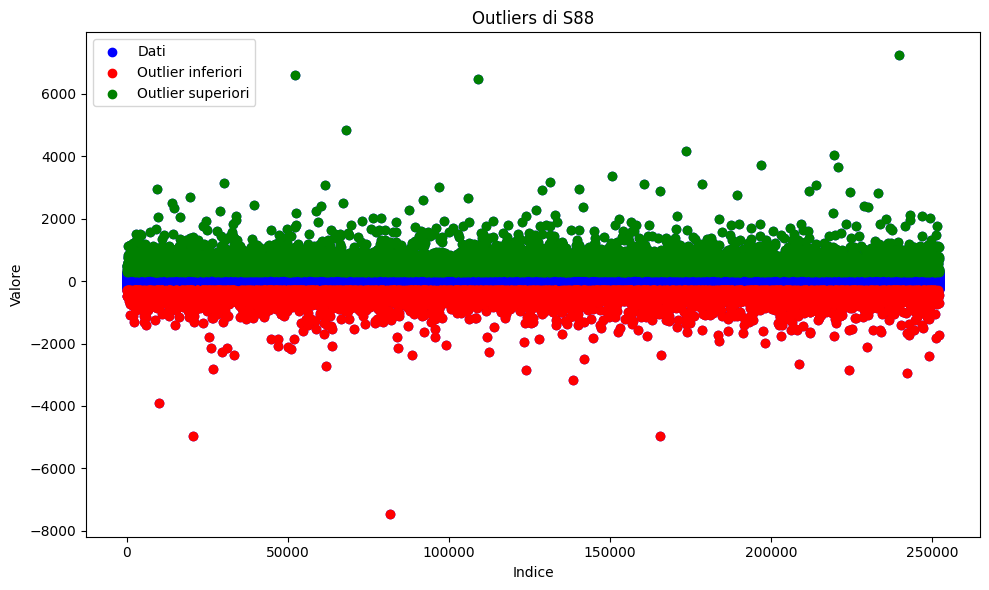

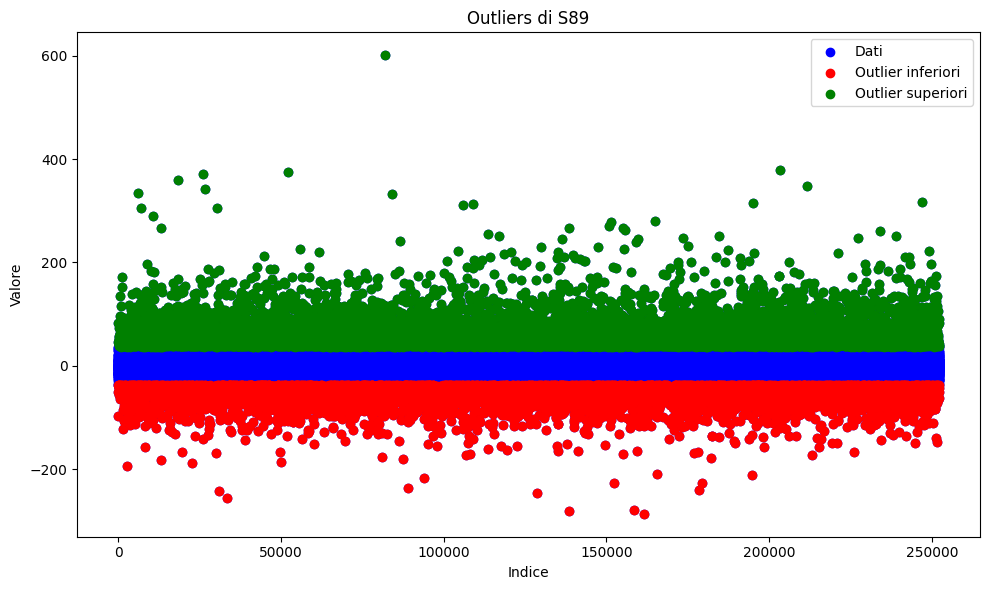

   Colonna  Numero Outliers Percentuale Outliers
0       S0             5306                2.10%
1       S1             7313                2.90%
2       S2             7484                2.97%
3       S3            11229                4.45%
4       S4             5224                2.07%
..     ...              ...                  ...
85     S85            16608                6.59%
86     S86            15876                6.30%
87     S87            14794                5.87%
88     S88            19031                7.55%
89     S89            19330                7.67%

[90 rows x 3 columns]


In [38]:
# Seleziona solo le colonne che iniziano con 'S'
colonne_s = [col for col in df.columns if col.startswith('S')]

# Lista per memorizzare i risultati
risultati_outliers = []

# Ciclo attraverso ogni colonna 'S'
for col in colonne_s:
    # Calcola i quantili e l'IQR (Interquartile Range)
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    
    # Calcola i baffi inferiori e superiori
    baffo_inferiore = q1 - 1.5 * iqr
    baffo_superiore = q3 + 1.5 * iqr
    
    # Trova gli outliers inferiori e superiori
    outliers_inferiori = df[df[col] < baffo_inferiore]
    outliers_superiori = df[df[col] > baffo_superiore]
    numero_outliers = len(outliers_inferiori) + len(outliers_superiori)
    
    # Calcola la percentuale di outliers
    percentuale_outliers = (numero_outliers / len(df)) * 100
    
    # Aggiungi i risultati alla lista
    risultati_outliers.append({
        'Colonna': col,
        'Numero Outliers': numero_outliers,
        'Percentuale Outliers': f'{percentuale_outliers:.2f}%'
    })
    
    # Crea un grafico a dispersione per gli outlier
    plt.figure(figsize=(10, 6))  # Imposta la dimensione della figura
    plt.scatter(df.index, df[col], color='blue', label='Dati')
    plt.scatter(outliers_inferiori.index, outliers_inferiori[col], color='red', label='Outlier inferiori')
    plt.scatter(outliers_superiori.index, outliers_superiori[col], color='green', label='Outlier superiori')
    plt.title(f'Outliers di {col}')
    plt.xlabel('Indice')
    plt.ylabel('Valore')
    plt.legend()
    plt.tight_layout()
    plt.show() 

# Converti i risultati in un DataFrame e stampalo
df_outliers = pd.DataFrame(risultati_outliers)
print(df_outliers)

### Matrice di correlazione

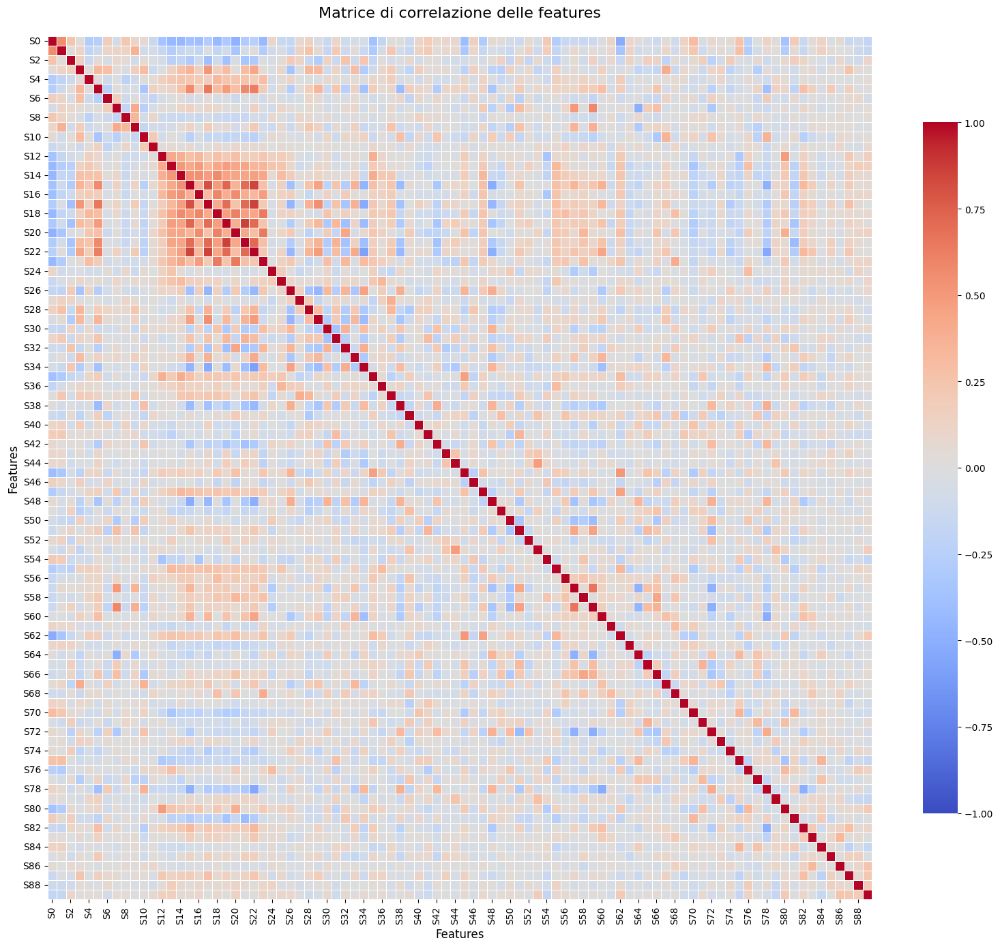

KeyError: 'Year'

In [42]:
# Calcola la matrice di correlazione
correlation_matrix = df.drop(columns=['Year', 'DecadeGroup']).corr()

plt.figure(figsize=(16, 14))

# Crea una heatmap della matrice di correlazione senza annotazioni
sns.heatmap(
    correlation_matrix, 
    annot=False,  # Disabilitazione annotazioni numeriche
    cmap='coolwarm', 
    linewidths=0.5, 
    vmin=-1, 
    vmax=1,
    cbar_kws={"shrink": 0.8} 
)

plt.title('Matrice di correlazione delle features', fontsize=16, pad=20)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.tight_layout()
plt.show()

# Estrazione delle correlazioni delle feature con l'anno di pubblicazione
correlation_with_year = correlation_matrix['Year']

# Filtraggio delle feature con correlazione superiore a 0.7
high_correlation_features = correlation_with_year[correlation_with_year.abs() > 0.7]

# Creazione di un DataFrame per mostrare le correlazioni e i valori
result_df = pd.DataFrame({
    'Feature': high_correlation_features.index,
    'Correlation': high_correlation_features.values
})

# Stampa del risultato
print("Feature con correlazione superiore a 0.7 con l'anno di pubblicazione:")
print(result_df)

# DA ELIMINAREEEEEEEE

# Prepocessing

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pickle

from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

### Controllo  e rimozione valori nulli e duplicati

In [44]:
# Valori mancanti per ciascuna colonna
missing_values_per_column = df.isnull().sum()
print("\nValori mancanti nel DataFrame per ciascuna colonna:")
print(missing_values_per_column)

# Totale dei valori mancanti in tutto il DataFrame
total_missing_values = missing_values_per_column.sum()
print(f"\nTotale dei valori mancanti nel DataFrame:\n{total_missing_values}")


Valori mancanti nel DataFrame per ciascuna colonna:
Year           0
S0             0
S1             0
S2             0
S3             0
              ..
S86            0
S87            0
S88            0
S89            0
DecadeGroup    0
Length: 92, dtype: int64

Totale dei valori mancanti nel DataFrame:
0


In [45]:
print("\nDuplicati nel DataFrame:")
print(df.duplicated().sum())


Duplicati nel DataFrame:
52


In [46]:
clean_df = df.dropna() 
clean_df = df.drop_duplicates()

In [47]:
# Verifica rimozione valori nulli e duplicati
total_missing_values = missing_values_per_column.sum()
print(f"\nTotale dei valori mancanti nel DataFrame: {total_missing_values}")
print(f"\nDuplicati nel DataFrame: {clean_df.duplicated().sum()}")


Totale dei valori mancanti nel DataFrame: 0

Duplicati nel DataFrame: 0


In [48]:
clean_df.describe()

,Year,S0,S1,S2,S3,S4,S5,S6,S7,S8,...,S80,S81,S82,S83,S84,S85,S86,S87,S88,S89
count,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,...,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000,252123.000000
mean,1998.350143,43.379082,1.554115,8.644903,1.160495,-6.526296,-9.531860,-2.367001,-1.788615,3.712732,...,15.724619,-73.286196,41.487949,38.044051,0.334009,17.931321,-26.509443,4.488371,19.873068,1.309111
std,10.497821,6.066799,51.553786,35.236419,16.336976,22.842798,12.809783,14.531206,7.963667,10.554074,...,31.984394,174.926010,122.250505,94.579907,16.021250,114.048957,173.685614,13.286652,185.161556,22.113446
min,1956.000000,3.455260,-334.953220,-301.005060,-149.962040,-181.953370,-72.717370,-111.017810,-68.404510,-119.762620,...,-437.722030,-2984.920970,-1810.689190,-1848.702260,-272.289050,-2343.894110,-3819.933620,-233.456480,-7458.378150,-286.031200
25%,1994.000000,39.959190,-25.652865,-11.525215,-8.492365,-20.588825,-18.403075,-10.770910,-6.473035,-2.296255,...,-1.788015,-139.031800,-21.015265,-4.631245,-6.749575,-31.247580,-102.179795,-2.536405,-59.734690,-8.819860
50%,2002.000000,44.250210,8.654700,10.517340,-0.641620,-5.998880,-11.189760,-2.072920,-1.727880,3.821940,...,9.132190,-53.171760,28.675010,33.593230,0.818240,15.846730,-21.623440,3.145800,7.775050,0.062890
75%,2006.000000,47.823030,36.250215,29.795445,8.767810,7.740135,-2.448085,6.512805,2.913495,9.938115,...,26.208285,13.413625,89.185855,77.879375,8.451960,67.776985,51.887175,9.999690,85.829385,9.651235
max,2009.000000,61.970140,384.065730,318.868960,228.412110,262.068870,166.236890,160.815220,82.942190,92.792850,...,840.973380,4469.454870,3210.701700,1734.079690,199.121500,3662.065650,2833.608950,275.353660,7240.653730,600.766240


# Rimozione outlier

In [49]:
# Itera su ogni anno presente nel DataFrame
for year in clean_df['Year'].unique():
    # Filtra il DataFrame per l'anno corrente
    df_year = clean_df[clean_df['Year'] == year]
    
    # Calcola la mediana per ogni colonna
    median_values = df_year.median()
    
    # Calcola i limiti per individuare gli outlier per ogni colonna
    Q1 = df_year.quantile(0.25)
    Q3 = df_year.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    
    # Sostituisci gli outlier con la mediana per ogni colonna
    def replace_outliers(row):
        for col in df_year.columns[1:]:  # Escludi la colonna 'year'
            if row[col] < lower_limit[col] or row[col] > upper_limit[col]:
                row[col] = median_values[col]
        return row
    
    df_year = df_year.apply(replace_outliers, axis=1) # Sostituzione outlier con mediana
    
    # Sostituisci i dati nel DataFrame originale
    clean_df.loc[clean_df['Year'] == year] = df_year

TypeError: 'Categorical' with dtype category does not support reduction 'median'

In [ ]:
# Inizializza una lista per memorizzare i risultati dei nuovi outlier
outliers_after_replacement = []
 
# Calcola gli outlier nel DataFrame clean_df
for col in clean_df.columns:
    if col.startswith('S'):
        # Calcolo dei cinque numeri riassuntivi
        q1 = clean_df[col].quantile(0.25)
        median = clean_df[col].median()
        q3 = clean_df[col].quantile(0.75)

        # Calcolo dei baffi
        iqr = q3 - q1
        lower_whisker = q1 - 1.5 * iqr
        upper_whisker = q3 + 1.5 * iqr

        # Calcolo degli outlier nel DataFrame sostituito
        outliers_lower_replaced = clean_df[clean_df[col] < lower_whisker][col]
        outliers_upper_replaced = clean_df[clean_df[col] > upper_whisker][col]
        num_outliers_replaced = len(outliers_lower_replaced) + len(outliers_upper_replaced)
 
        # Aggiungi i risultati alla lista
        outliers_after_replacement.append({
            'Feature': col,
            'Num_Outliers_After_Replacement': num_outliers_replaced
        })


# Converti la lista in un DataFrame
outliers_replaced_df = pd.DataFrame(outliers_after_replacement)
 
# Unisci il DataFrame originale con il nuovo DataFrame sui risultati dopo la sostituzione
outliers_summary_df = df_outliers.merge(outliers_replaced_df, on='Feature')
 
# Visualizza la tabella finale
print(outliers_summary_df)

### Suddivisione del DataSet

In [ ]:
X = clean_df.drop(columns=['Year'])  # Non la consideriamo per il modello
y = clean_df['Year'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) 

### Standardizzazione

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Salva il modello di scaling
with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

print("\nDati di training normalizzati:")
print(X_train_scaled)

# Modeling

### PCA

In [ ]:
# Riduzione della dimensionalità con PCA
pca = PCA(n_components=0.95)  # Mantieni il 95% della varianza spiegata
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Numero di componenti principali: {pca.n_components_}")
print(f"Forma dei dati di training dopo PCA: {X_train_pca.shape}")
print(f"Forma dei dati di test dopo PCA: {X_test_pca.shape}")

In [ ]:
#Scree Plot -> mostra la percentuale di variazione spiegata da ogni componente principale
PC_values = np.arange(pca.n_components_) + 1
plt.figure(figsize=(10,10))
plt.grid()
plt.plot(PC_values, pca.explained_variance_ratio_, 'o-', linewidth=2, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.xticks(range(0,90,2))
plt.ylabel('Variance Explained')
plt.show()
print("Explainer variance of each component:",pca.explained_variance_ratio_)
print("Variance total:", sum(pca.explained_variance_ratio_))